# Event Detection Via Social Media Data
----

##Data Loading

In [1]:
#@title Fix Dependency Issue
# Uninstall potentially conflicting versions first
# !pip uninstall -y numpy scipy gensim fasttext bertopic laserembeddings sentence-transformers

# !pip install numpy==1.26.4 scipy=
# !pip install gensim
# !pip install fasttext
# !pip install laserembeddings
!pip install bertopic
!pip install sentence-transformers
!pip install gensim


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.6/150.6 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 55.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 64.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 52.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalli

In [1]:
#@title Install Packages
# !pip install arabic-reshaper python-bidi
# !pip install ar_wordcloud
# !pip install transformers
# !pip install stanza
# !pip install -U bertopic
# !pip install -U sentence-transformers
# !pip install -U scikit-learn
# !pip install -U arabert

# import nltk
# # import stanza

# nltk.download('stopwords')
# from nltk.corpus import stopwords

# arabic_stopwords = set(stopwords.words('arabic'))

# english_stopwords = set(stopwords.words('english'))
# combined_stopwords = arabic_stopwords.union(english_stopwords)

# # Download Arabic model once
# # stanza.download('ar', verbose=False)

# # Initialize pipeline for Arabic with NER
# # nlp = stanza.Pipeline('ar', processors='tokenize,ner', use_gpu=True)


In [2]:
#@title import packages
import numpy as np
import requests
# from nltk.corpus import stopwords
# from nltk.tokenize import word_tokenize

import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
import matplotlib.pyplot as plt

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import silhouette_score
import re
import ast

# For reproducibility
np.random.seed(42)

import pandas as pd
#@title import packages
import numpy as np
import requests
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import random
# import arabic_reshaper
# from bidi.algorithm import get_display
import matplotlib.pyplot as plt
from collections import Counter
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import DBSCAN
import numpy as np

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

import matplotlib.pyplot as plt
# import arabic_reshaper
# from bidi.algorithm import get_display
from collections import Counter
import ast
# import arabic_reshaper
# from bidi.algorithm import get_display
# from ar_wordcloud import ArabicWordCloud

import networkx as nx

import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import random
import networkx as nx


In [3]:
#@title uitlities
import re

def clean_tweet(text):
    if not isinstance(text, str):
        return ''
    text = re.sub(r'http\S+', '', text)            # remove URLs
    text = re.sub(r'@\w+', '', text)                # remove mentions
    text = re.sub(r'#\w+', '', text)                # remove hashtags
    text = re.sub(r'[^ء-يa-zA-Z0-9\s]', ' ', text) # keep Arabic letters, Latin letters, numbers, and spaces only
    text = re.sub(r'\s+', ' ', text)                 # remove extra whitespace
    return text.strip()

def extract_entities_stanza(text):
    if not isinstance(text, str) or text.strip() == "":
        return []
    doc = nlp(text)
    entities = [ent.text for ent in doc.ents]
    return entities


# Save results DataFrame to CSV file
def save_results(results_df, model_name):
    filename = f"{model_name}.csv"
    results_df.to_csv(filename, index=False)
    print(f"Results saved to {filename}")

def print_results_tables(models_results_dict, metric_names=['nmi', 'ami', 'ari']):
    """
    models_results_dict: dict of {model_name: pd.DataFrame with columns ['date', 'nmi', 'ami', 'ari', ...]}
    metric_names: list of metric columns to show
    """
    for model_name, df in models_results_dict.items():
        # Make sure date is datetime.date type
        df['date'] = pd.to_datetime(df['date']).dt.date

        # Pivot each metric to have dates as columns
        metrics_data = {}
        for metric in metric_names:
            metric_series = df.set_index('date')[metric]
            metrics_data[metric] = metric_series

        table_df = pd.DataFrame(metrics_data).T  # transpose for metric rows

        print(f"\n=== Metrics Table for {model_name} ===")
        print(table_df.round(4))



In [5]:
# @title Define Constants
urls = [
    "https://raw.githubusercontent.com/HasanKhadd0ur/SocialED_datasets/main/npy_data/Event2012.npy"
]
from google.colab import drive
drive.mount('/content/drive')

columns=[ 'tweet_id', 'text', 'event_id', 'words', 'filtered_words', 'entities', 'user_id', 'created_at', 'urls', 'hashtags', 'user_mentions']

Mounted at /content/drive


In [6]:
#@title process data
# import os
# import pandas as pd

# # Define folder path in your Drive
# folder_path = '/content/drive/MyDrive/Events'

# # List CSV files only
# csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]
# dataframes = []

# for label, filename in enumerate(csv_files):
#     file_path = os.path.join(folder_path, filename)
#     try:
#         df = pd.read_csv(file_path)
#         df['event_label'] = label  # Numeric label for each file
#         df['event_filename'] = filename  # Optional: store filename
#         dataframes.append(df)
#     except Exception as e:
#         print(f"Error reading {filename}: {e}")
# merged_df = pd.concat(dataframes, ignore_index=True)

# # Optional: Save to Drive or download
# merged_df.to_csv('/content/drive/MyDrive/merged_labeled_events.csv', index=False)

In [7]:
#@title Load dataset
df = pd.read_csv("/content/drive/MyDrive/cleaned_merged_labeled_events.csv")

In [8]:
#@title Data Columns
df.columns

Index(['Tweet ID', 'Tweet Text', 'Type', 'Author Name', 'Author Username',
       'Creation Time', 'Reply Count', 'Retweet Count', 'Quote Count',
       'Like Count', 'View Count', 'Bookmark Count', 'Language',
       'Possibly Sensitive', 'Source', 'Hashtags', 'Tweet URL', 'Media Type',
       'Media URLs', 'External URLs', 'event_label', 'event_filename',
       'Hashtags_str', 'Old Tweet Text', 'Date', 'Block', 'duration_days',
       'duration_hours', 'duration_minutes', 'Named Entities', 'PER', 'ORG',
       'LOC', 'date', 'arabert_embeddings', 'fasttext_embeddings',
       'named_entities_embedding_32d', 'hashtags_embedding_32d',
       'per_embeddings_32d', 'org_embeddings_32d', 'loc_embeddings_32d',
       'mbert_embeddings', 'verbs', 'nouns', 'adjectives'],
      dtype='object')

In [9]:
# @title Ensure Type
# Ensure datetime format
df['Creation Time'] = pd.to_datetime(df['Creation Time'])
# Extract just the date part
df['date'] = df['Creation Time'].dt.date

import ast

def entities_to_list(entities_str):
    if isinstance(entities_str, str):
        try:
            # Safely evaluate the string to a Python list
            entities = ast.literal_eval(entities_str)
            # Ensure it's a list and strip whitespace from each entity
            if isinstance(entities, list):
                return [e.strip() for e in entities]
            else:
                return []
        except (ValueError, SyntaxError):
            return []
    else:
        return []
# convert the embedding fro type str to type ndarray
df['arabert_embeddings']=df['arabert_embeddings'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' '))

# Apply to the Named Entities column
# df['Named Entities'] = df['Named Entities'].apply(entities_to_list)

def clean_hashtag_entry(entry):
    try:
        # Step 1: Flatten if it’s a nested list like [[...]]
        if isinstance(entry, list) and len(entry) == 1 and isinstance(entry[0], list):
            entry = entry[0]

        # Step 2: Join everything into one string
        if isinstance(entry, list):
            entry = ''.join(entry)

        # Step 3: Remove outer brackets and unescape
        entry = entry.strip()

        # Step 4: Use regex to extract valid Arabic hashtags (words)
        # This captures Arabic words, hashtags, or unicode escapes
        words = re.findall(r'[\u0600-\u06FF#\w]+', entry)
        return words
    except Exception as e:
        return []
# Apply cleaning function
df['Hashtags'] = df['Hashtags'].apply(clean_hashtag_entry)


In [10]:
#@title Ensure hashtags are stored as lists instead of comma-separated strings
# def convert_hashtags_to_list(value):
#     if isinstance(value, str):
#         return [tag.strip() for tag in value.split(',') if tag.strip()]
#     return []

# df['Hashtags'] = df['Hashtags'].apply(convert_hashtags_to_list)
# Convert the string of hashtags separated by commas into a list, handling NaN

def hashtags_to_list(hstring):
    if isinstance(hstring, str):
        # Split by comma, strip whitespace
      return [tag.strip().lstrip('#') for tag in hstring.split(',') if tag.strip()]

    else:
        # For NaN or missing values
        return []
df['Hashtags_str'] = df['Hashtags']

# Apply conversion to your hashtag column, e.g., 'Hashtags_str'
df['Hashtags'] = df['Hashtags'].apply(hashtags_to_list)



In [11]:
# @title Data shape
print(df.shape)


(6998, 45)


In [12]:
#@title Clean the tweet texts
df['Old Tweet Text'] = df['Tweet Text']
df['Tweet Text'] = df['Tweet Text'].apply(clean_tweet)


## run this

In [239]:
#@title Split the Dataset
from datetime import date

# Define the split date
split_date = date(2025, 5, 7)

# Convert Date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Split the dataset
tuning_df = df[df['date'] < split_date].copy()
evaluation_df = df[df['date'] >= split_date].copy()


daily_blocks = dict(tuple(evaluation_df.groupby(evaluation_df['Date'].dt.date)))

# Show the sizes
print(f"🧪 Tuning Set Size     : {tuning_df.shape[0]} messages")
print(f"📈 Evaluation Set Size : {evaluation_df.shape[0]} messages")


🧪 Tuning Set Size     : 934 messages
📈 Evaluation Set Size : 6064 messages


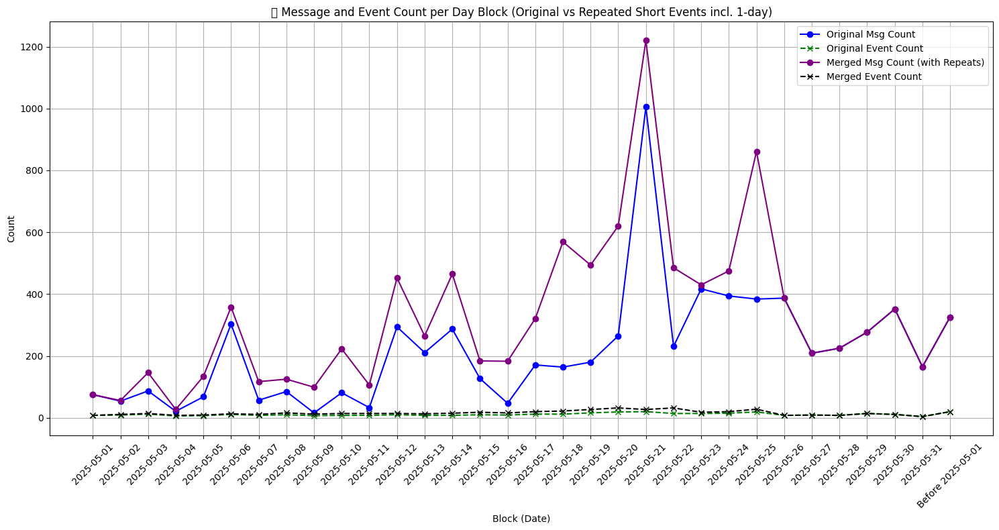

In [240]:
#@title Augment the data by repeating the events
from datetime import timedelta

# Ensure 'Date' column is datetime.date type
if df['Date'].dtype != 'O':
    df['Date'] = pd.to_datetime(df['Date']).dt.date

start_date = pd.to_datetime("2025-05-01").date()
end_date = pd.to_datetime("2025-05-25").date()

# Assign Block column
df['Block'] = df['Date'].apply(lambda d: "Before 2025-05-01" if d < start_date else str(d))

# Original stats
block_stats = df.groupby('Block').agg(
    Block_Size=('Tweet ID', 'count'),
    Num_Events=('event_filename', pd.Series.nunique)
).reset_index()

# --- Step 1: Detect short events (< 5 days) and 1-day events
event_durations = df.groupby('event_filename')['Creation Time'].agg(['min', 'max'])
event_durations['duration_days'] = (event_durations['max'] - event_durations['min']).dt.total_seconds() / 86400
event_durations['start_date'] = event_durations['min'].dt.date
event_durations['end_date'] = event_durations['max'].dt.date

short_events = event_durations[event_durations['duration_days'] < 5]
one_day_events = event_durations[event_durations['duration_days'] == 1.0]

# Extract only short event rows in range
filtered_df = df[
    (df['event_filename'].isin(short_events.index)) &
    (df['Date'] >= start_date) & (df['Date'] <= end_date)
].copy()

# Precompute daily counts
daily_counts = df[df['Date'] >= start_date].groupby('Date').size().to_dict()
augmented_rows = []

# Augment short events (< 5 days)
for event_name, row in short_events.iterrows():
    original_rows = filtered_df[filtered_df['event_filename'] == event_name]
    if original_rows.empty:
        continue

    candidates = []
    for shift in [-3, 3, 7, 10]:
        target_date = row['end_date'] + timedelta(days=shift) if shift >= 0 else row['start_date'] + timedelta(days=shift)
        if start_date <= target_date <= end_date and daily_counts.get(target_date, 0) < 500:
            candidates.append(target_date)

    used_targets = set()
    for target_date in candidates:
        if target_date in used_targets:
            continue
        used_targets.add(target_date)

        shift_days = (target_date - row['start_date']).days
        repeated_rows = original_rows.copy()
        repeated_rows['Date'] = repeated_rows['Date'] + timedelta(days=shift_days)
        repeated_rows = repeated_rows[(repeated_rows['Date'] >= start_date) & (repeated_rows['Date'] <= end_date)]
        if not repeated_rows.empty:
            augmented_rows.append(repeated_rows)

# Augment 1-day events with more shifts
filtered_one_day = df[
    (df['event_filename'].isin(one_day_events.index)) &
    (df['Date'] >= start_date) & (df['Date'] <= end_date)
].copy()

for event_name, row in one_day_events.iterrows():
    original_rows = filtered_one_day[filtered_one_day['event_filename'] == event_name]
    if original_rows.empty:
        continue

    for shift in [-7, -3, 3, 7]:
        target_date = row['start_date'] + timedelta(days=shift)
        if start_date <= target_date <= end_date and daily_counts.get(target_date, 0) < 500:
            repeated_rows = original_rows.copy()
            repeated_rows['Date'] = repeated_rows['Date'] + timedelta(days=shift)
            repeated_rows = repeated_rows[(repeated_rows['Date'] >= start_date) & (repeated_rows['Date'] <= end_date)]
            if not repeated_rows.empty:
                augmented_rows.append(repeated_rows)

# Merge repeated events
repeated_df = pd.concat(augmented_rows, ignore_index=True) if augmented_rows else pd.DataFrame(columns=df.columns)
repeated_df['is_augmented'] = True

# Merge with original
merged_df = pd.concat([df, repeated_df], ignore_index=True)
merged_df['Block'] = merged_df['Date'].apply(lambda d: "Before 2025-05-01" if d < start_date else str(d))

# Recompute block stats
merged_block_stats = merged_df.groupby('Block').agg(
    Block_Size=('Tweet ID', 'count'),
    Num_Events=('event_filename', pd.Series.nunique)
).reset_index()

# --- 📊 Plot comparison
plt.figure(figsize=(15, 8))

plt.plot(block_stats['Block'], block_stats['Block_Size'], marker='o', color='blue', label='Original Msg Count')
plt.plot(block_stats['Block'], block_stats['Num_Events'], marker='x', color='green', linestyle='--', label='Original Event Count')

plt.plot(merged_block_stats['Block'], merged_block_stats['Block_Size'], marker='o', color='purple', label='Merged Msg Count (with Repeats)')
plt.plot(merged_block_stats['Block'], merged_block_stats['Num_Events'], marker='x', color='black', linestyle='--', label='Merged Event Count')

plt.xticks(rotation=45)
plt.title("📦 Message and Event Count per Day Block (Original vs Repeated Short Events incl. 1-day)")
plt.xlabel("Block (Date)")
plt.ylabel("Count")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [241]:
#@title messages blocks
from datetime import date

# Use the merged (augmented) dataset
df_aug = merged_df.copy()

# Make sure Date column is datetime type
df_aug['Date'] = pd.to_datetime(df_aug['Date'])

# Define split date
split_date = pd.to_datetime("2025-05-07")

# Split for tuning and evaluation
tuning_df = df_aug[df_aug['Date'] < split_date].copy()
evaluation_df = df_aug[df_aug['Date'] >= split_date].copy()

# Show the sizes
print(f"🧪 Tuning Set Size     : {tuning_df.shape[0]} messages")
print(f"📈 Evaluation Set Size : {evaluation_df.shape[0]} messages")


🧪 Tuning Set Size     : 1122 messages
📈 Evaluation Set Size : 9309 messages


In [242]:
#@title blocks
# Daily blocks from evaluation set (each day = one message block)
daily_blocks = dict(tuple(evaluation_df.groupby(evaluation_df['Date'].dt.date)))

# Show block summary table
block_stats = evaluation_df.groupby(evaluation_df['Date'].dt.date).agg(
    Block_Size=('Tweet ID', 'count'),
    Num_Events=('event_filename', pd.Series.nunique)
).reset_index().rename(columns={'Date': 'Block (Date)'})

print("\n📊 Daily Block Summary:\n")
print(block_stats.to_string(index=False))



📊 Daily Block Summary:

Block (Date)  Block_Size  Num_Events
  2025-05-07         117          11
  2025-05-08         125          16
  2025-05-09          99          12
  2025-05-10         223          14
  2025-05-11         106          14
  2025-05-12         452          14
  2025-05-13         265          13
  2025-05-14         465          15
  2025-05-15         184          18
  2025-05-16         183          16
  2025-05-17         321          20
  2025-05-18         569          22
  2025-05-19         494          27
  2025-05-20         620          32
  2025-05-21        1220          27
  2025-05-22         485          32
  2025-05-23         430          18
  2025-05-24         475          20
  2025-05-25         861          28
  2025-05-26         387           8
  2025-05-27         209           9
  2025-05-28         225           8
  2025-05-29         277          14
  2025-05-30         352          11
  2025-05-31         165           4


In [243]:
#@title Messages Blocks
from datetime import date

# Ensure Date column is datetime type in original df
df['Date'] = pd.to_datetime(df['Date'])

# Define split date
split_date = pd.to_datetime("2025-05-07")

# Split original dataset
original_tuning_df = df[df['Date'] < split_date].copy()
original_evaluation_df = df[df['Date'] >= split_date].copy()

# Create daily blocks dictionary (group by date)
daily_blocks_original = dict(tuple(original_evaluation_df.groupby(original_evaluation_df['Date'].dt.date)))

# Show sizes
print(f"Original Tuning Set Size   : {original_tuning_df.shape[0]} messages")
print(f"Original Evaluation Set Size : {original_evaluation_df.shape[0]} messages")

# Show some info about blocks
print(f"Number of daily blocks in original evaluation set: {len(daily_blocks_original)}")


Original Tuning Set Size   : 934 messages
Original Evaluation Set Size : 6064 messages
Number of daily blocks in original evaluation set: 25


In [244]:
#@title Messages Blocks Augmented
# Ensure Date column is datetime type
df_aug['Date'] = pd.to_datetime(df_aug['Date'])

# Split augmented dataset
tuning_df_aug = df_aug[df_aug['Date'] < split_date].copy()
evaluation_df_aug = df_aug[df_aug['Date'] >= split_date].copy()

# Create daily blocks dictionary (group by date)
daily_blocks_augmented = dict(tuple(evaluation_df_aug.groupby(evaluation_df_aug['Date'].dt.date)))

# Show sizes
print(f"Augmented Tuning Set Size   : {tuning_df_aug.shape[0]} messages")
print(f"Augmented Evaluation Set Size : {evaluation_df_aug.shape[0]} messages")

# Show some info about blocks
print(f"Number of daily blocks in augmented evaluation set: {len(daily_blocks_augmented)}")


Augmented Tuning Set Size   : 1122 messages
Augmented Evaluation Set Size : 9309 messages
Number of daily blocks in augmented evaluation set: 25


In [245]:
#@title  HDBSCAN Sliding Window
from datetime import timedelta
from hdbscan import HDBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
import numpy as np
import pandas as pd
from tqdm import tqdm

def run_hdbscan_sliding(daily_blocks, window_size, time_window_days,
                        min_cluster_size=15, min_samples=5,
                        initial_df=None,
                        embedding_column='arabert_embeddings'):
    """
    Run HDBSCAN in a sliding window over daily blocks.

    Args:
        daily_blocks (dict): {date: DataFrame}
        window_size (int): Max number of tweets in window
        time_window_days (int): Time-based cutoff in days
        min_cluster_size (int): HDBSCAN min_cluster_size
        min_samples (int): HDBSCAN min_samples
        initial_df (DataFrame): Optional tuning data to preload
        embedding_column (str): Column name with embeddings

    Returns:
        DataFrame with date, NMI, ARI, AMI scores
    """

    window_embeddings, window_labels, window_dates = [], [], []
    results = []

    # Preload window with tuning data
    if initial_df is not None:
        window_embeddings = list(np.vstack(initial_df[embedding_column].apply(np.array).values))
        window_labels = list(initial_df['event_label'].values)
        window_dates = list(pd.to_datetime(initial_df['Date']).tolist())

    for date, block in tqdm(sorted(daily_blocks.items()), desc="Running HDBSCAN Sliding Window"):
        block_embeddings = np.vstack(block[embedding_column].apply(np.array).values)
        block_labels = block['event_label'].values
        block_dates = pd.to_datetime(block['Date']).tolist()

        window_embeddings += list(block_embeddings)
        window_labels += list(block_labels)
        window_dates += list(block_dates)

        # Time filter
        time_cutoff = pd.to_datetime(date) - timedelta(days=time_window_days)
        filtered = [(e, l, d) for e, l, d in zip(window_embeddings, window_labels, window_dates) if d >= time_cutoff]
        if filtered:
            window_embeddings, window_labels, window_dates = map(list, zip(*filtered))
        else:
            window_embeddings, window_labels, window_dates = [], [], []

        # Truncate window size
        if len(window_embeddings) > window_size:
            window_embeddings = window_embeddings[-window_size:]
            window_labels = window_labels[-window_size:]
            window_dates = window_dates[-window_size:]

        # Clustering
        if len(set(window_labels)) > 1:
            clusterer = HDBSCAN(min_cluster_size=min_cluster_size,
                                min_samples=min_samples,
                                metric='cosine',
                                algorithm='generic')
            predicted = clusterer.fit_predict(np.array(window_embeddings))

            if len(set(predicted)) > 1 and (predicted != -1).any():
                nmi = normalized_mutual_info_score(window_labels, predicted)
                ari = adjusted_rand_score(window_labels, predicted)
                ami = adjusted_mutual_info_score(window_labels, predicted)
            else:
                nmi = ari = ami = 0.0
        else:
            nmi = ari = ami = 0.0

        results.append({
            'date': date,
            'nmi': nmi,
            'ari': ari,
            'ami': ami,
            'num_tweets': len(block)
        })

    return pd.DataFrame(results).sort_values(by='date')


In [246]:
#@title DBSCAN Sldig Window
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from tqdm import tqdm
import numpy as np
import pandas as pd
from datetime import timedelta

def run_dbscan_sliding(daily_blocks, window_size, time_window_days,
                       eps=0.5, min_samples=5, initial_df=None):
    window_embeddings = []
    window_labels = []
    window_dates = []
    results = []

    # --- Preload window with tuning data ---
    if initial_df is not None:
        window_embeddings = list(np.vstack(initial_df['arabert_embeddings'].apply(np.array).values))
        window_labels = list(initial_df['event_label'].values)
        window_dates = list(pd.to_datetime(initial_df['Date']).to_list())

    # --- Process day by day ---
    for date, block in tqdm(sorted(daily_blocks.items()), desc="Running DBSCAN Sliding Window"):
        block_embeddings = np.vstack(block['arabert_embeddings'].apply(np.array).values)
        block_labels = block['event_label'].values
        block_dates = pd.to_datetime(block['Date']).to_list()

        # Add today's data
        window_embeddings += list(block_embeddings)
        window_labels += list(block_labels)
        window_dates += list(block_dates)

        # Filter by time window
        time_cutoff = pd.to_datetime(date) - timedelta(days=time_window_days)
        filtered = [(e, l, d) for e, l, d in zip(window_embeddings, window_labels, window_dates) if d >= time_cutoff]
        if filtered:
            window_embeddings, window_labels, window_dates = map(list, zip(*filtered))
        else:
            window_embeddings, window_labels, window_dates = [], [], []

        # Truncate by size
        if len(window_embeddings) > window_size:
            window_embeddings = window_embeddings[-window_size:]
            window_labels = window_labels[-window_size:]
            window_dates = window_dates[-window_size:]

        # Run clustering
        if len(set(window_labels)) > 1:
            clusterer = DBSCAN(eps=eps, min_samples=min_samples, metric='euclidean')
            predicted = clusterer.fit_predict(np.array(window_embeddings))

            if len(set(predicted)) > 1 and (predicted != -1).any():
                nmi = normalized_mutual_info_score(window_labels, predicted)
                ari = adjusted_rand_score(window_labels, predicted)
                ami = adjusted_mutual_info_score(window_labels, predicted)
            else:
                nmi = ari = ami = 0.0
        else:
            nmi = ari = ami = 0.0

        results.append({
            'date': date,
            'nmi': nmi,
            'ari': ari,
            'ami': ami,
            'num_tweets': len(block)
        })

    return pd.DataFrame(results).sort_values(by='date')


In [247]:
#@title 🎨 t-SNE Plot with Clustering Up to a Given Date
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from hdbscan import HDBSCAN
import seaborn as sns
import numpy as np
import pandas as pd

def plot_tsne_hdbscan_clusters_up_to_date(daily_blocks,
                                          date_key,
                                          embedding_column='arabert_embeddings',
                                          min_cluster_size=5,
                                          min_samples=3,
                                          perplexity=30):
    """
    Run HDBSCAN on all tweets up to a given date and visualize t-SNE on tweets of that date.

    Args:
        daily_blocks: dict of {date: DataFrame}
        date_key: datetime.date object for the block to visualize
        embedding_column: which embedding to use
        min_cluster_size: HDBSCAN parameter
        min_samples: HDBSCAN parameter
        perplexity: t-SNE perplexity
    """

    # Filter and combine data from all dates up to the given date
    up_to_date_blocks = {
        d: block for d, block in daily_blocks.items()
        if d <= date_key
    }

    if not up_to_date_blocks:
        print(f"❌ No data found up to {date_key}")
        return

    # Combine all data up to the date
    full_df = pd.concat(up_to_date_blocks.values())
    full_embeddings = np.vstack(full_df[embedding_column].apply(np.array).values)

    # Run HDBSCAN on all embeddings up to this date
    clusterer = HDBSCAN(min_cluster_size=min_cluster_size,
                        min_samples=min_samples,
                        metric='cosine',
                        algorithm='generic')
    full_cluster_ids = clusterer.fit_predict(full_embeddings)

    # Get the indices of the tweets from the target date only
    block_today = daily_blocks.get(date_key)
    if block_today is None or block_today.empty:
        print(f"❌ No tweets found for {date_key}")
        return

    today_indices = full_df.index.get_indexer(block_today.index)
    today_embeddings = full_embeddings[today_indices]
    today_cluster_ids = np.array(full_cluster_ids)[today_indices]

    # Run t-SNE only on today's embeddings
    tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity)
    tsne_proj = tsne.fit_transform(today_embeddings)

    # Plot
    plt.figure(figsize=(10, 8))
    unique_clusters = np.unique(today_cluster_ids)
    palette = sns.color_palette('tab20', len(unique_clusters))

    sns.scatterplot(x=tsne_proj[:, 0], y=tsne_proj[:, 1],
                    hue=today_cluster_ids,
                    palette=palette,
                    style=today_cluster_ids == -1,
                    s=60,
                    edgecolor='gray')

    plt.title(f"t-SNE: Clusters on {date_key} (up to this day)")
    plt.xlabel("TSNE-1")
    plt.ylabel("TSNE-2")
    plt.legend(title="Cluster ID", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


# final results

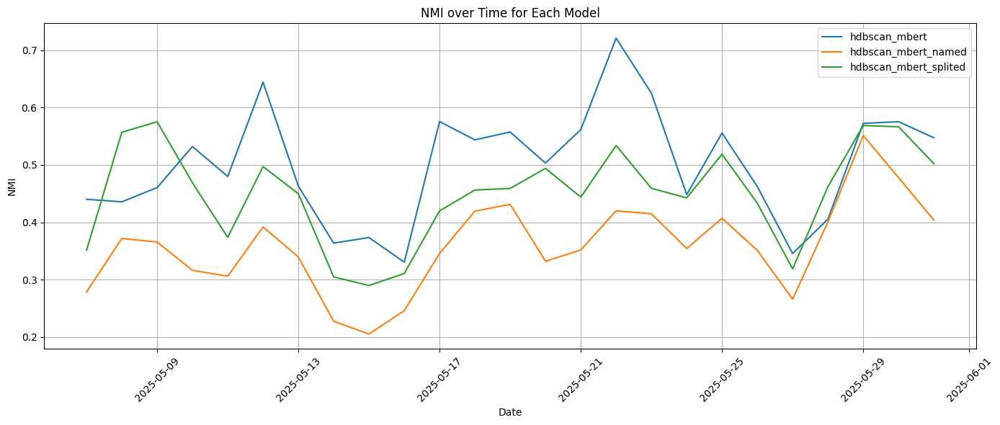

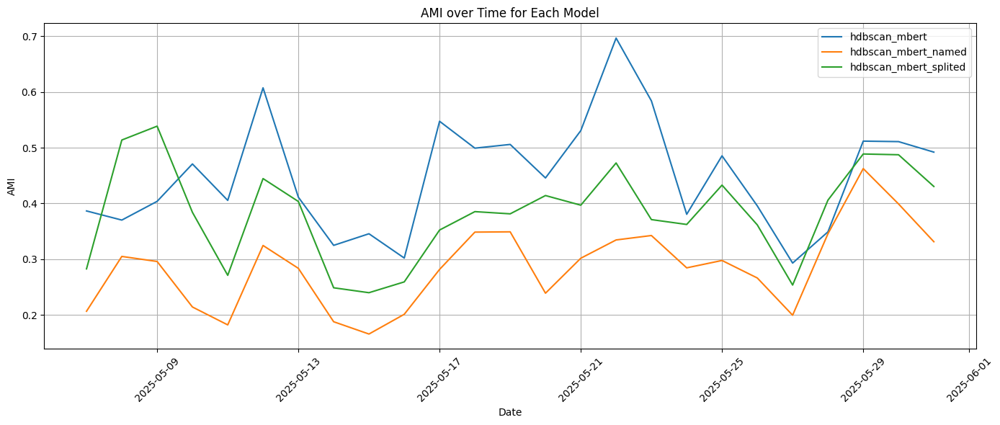

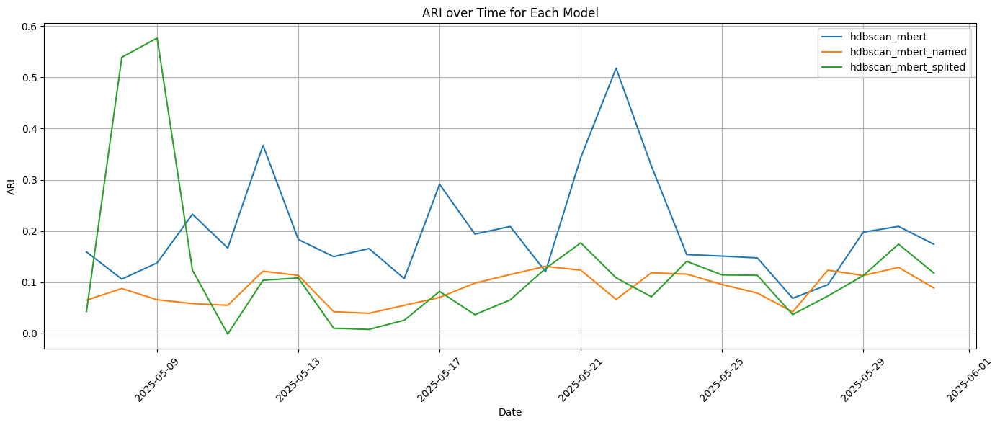

In [ ]:
#@title Plot NMI, AMI, and ARI for Multiple Models for named entities Over Time
import pandas as pd
import matplotlib.pyplot as plt

def load_and_plot_metrics(model_names, metric_names=['nmi', 'ami', 'ari']):
    # Set a color map for consistency
    color_map = {
        'nmi': 'tab:blue',
        'ari': 'tab:green',
        'ami': 'tab:orange'
    }

    # Load and store all model results
    model_dfs = {}
    for model in model_names:
        df = pd.read_csv(f"drive/MyDrive/results/{model}.csv")
        df['date'] = pd.to_datetime(df['date']).dt.date
        model_dfs[model] = df

    # Plot each metric
    for metric in metric_names:
        plt.figure(figsize=(14, 6))
        for model, df in model_dfs.items():
            plt.plot(df['date'], df[metric], label=model)

        plt.title(f"{metric.upper()} over Time for Each Model")
        plt.xlabel("Date")
        plt.ylabel(metric.upper())
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

# Example usage:
model_list = ['hdbscan_mbert', 'hdbscan_mbert_named','hdbscan_mbert_splited']
load_and_plot_metrics(model_list)


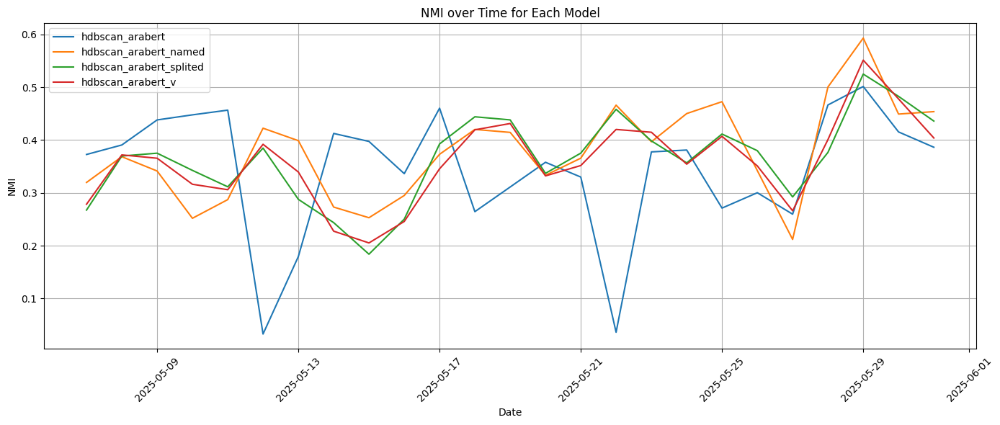

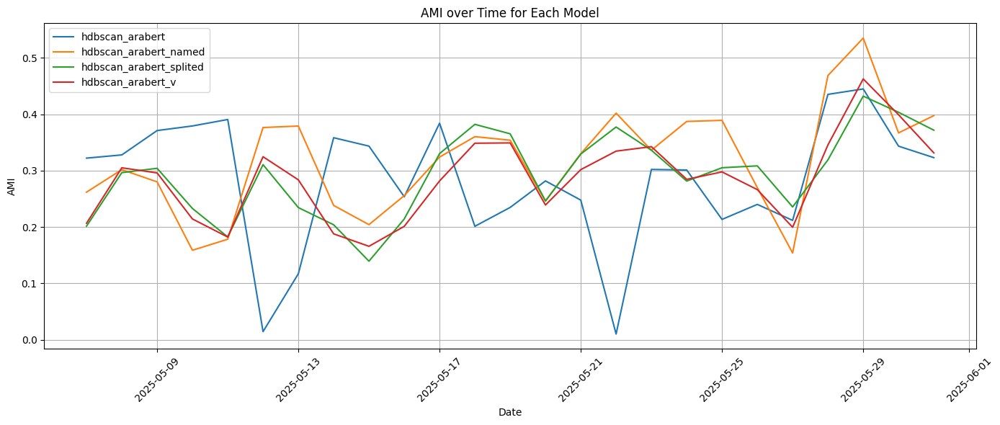

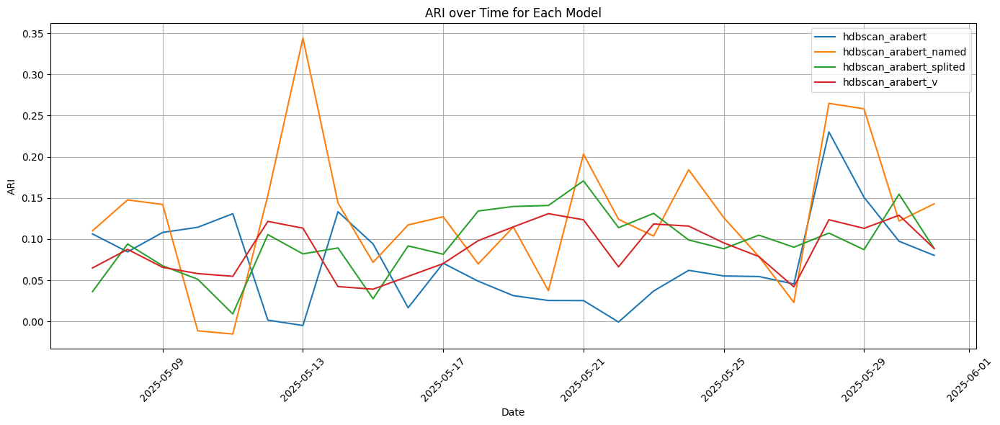

In [ ]:
#@title Plot NMI, AMI, and ARI for Multiple Models for named entities Over Time
import pandas as pd
import matplotlib.pyplot as plt

def load_and_plot_metrics(model_names, metric_names=['nmi', 'ami', 'ari']):
    # Set a color map for consistency
    color_map = {
        'nmi': 'tab:blue',
        'ari': 'tab:green',
        'ami': 'tab:orange'
    }

    # Load and store all model results
    model_dfs = {}
    for model in model_names:
        df = pd.read_csv(f"drive/MyDrive/results/{model}.csv")
        df['date'] = pd.to_datetime(df['date']).dt.date
        model_dfs[model] = df

    # Plot each metric
    for metric in metric_names:
        plt.figure(figsize=(14, 6))
        for model, df in model_dfs.items():
            plt.plot(df['date'], df[metric], label=model)

        plt.title(f"{metric.upper()} over Time for Each Model")
        plt.xlabel("Date")
        plt.ylabel(metric.upper())
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

# Example usage:
model_list = ['hdbscan_arabert', 'hdbscan_arabert_named', 'hdbscan_arabert_splited','hdbscan_arabert_v']
load_and_plot_metrics(model_list)


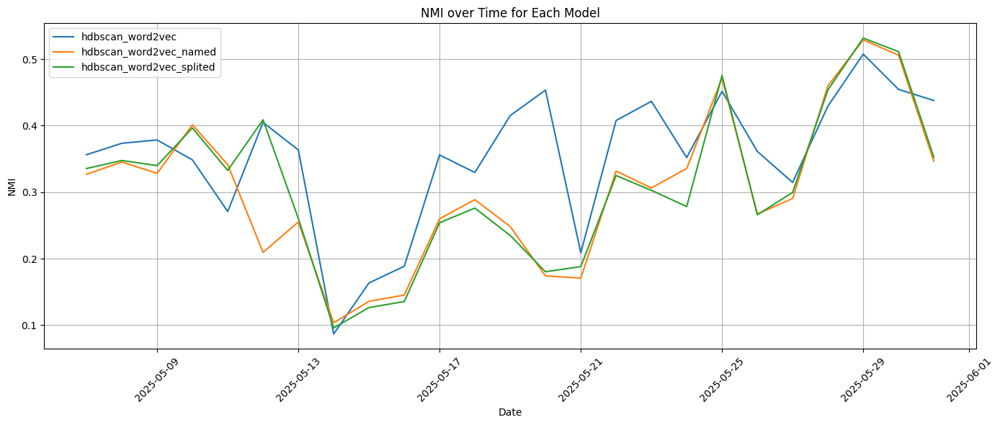

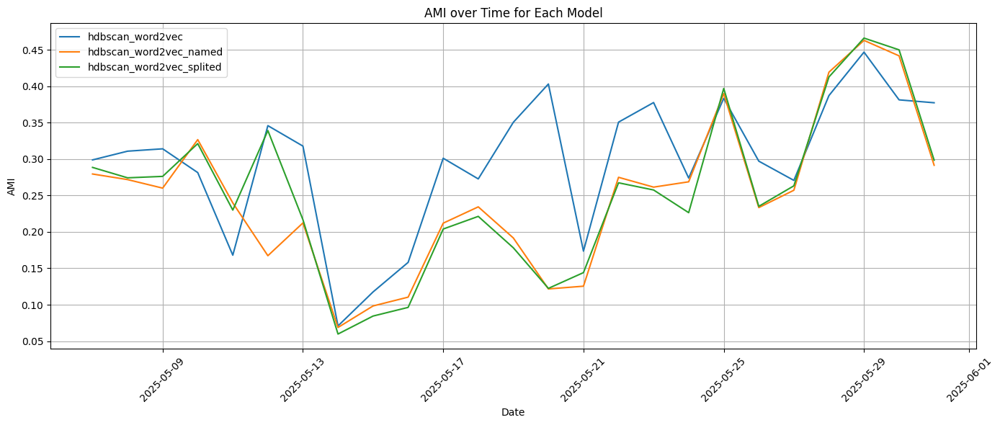

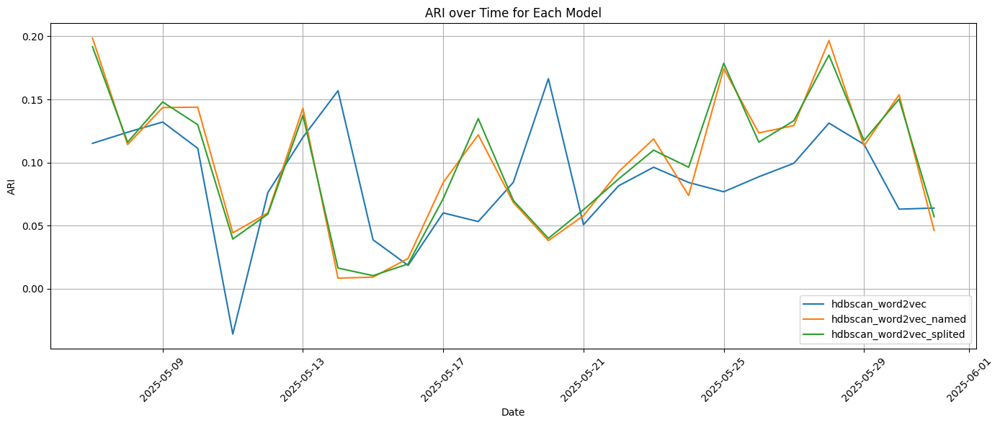

In [255]:
#@title Plot NMI, AMI, and ARI for Multiple Models for named entities Over Time
import pandas as pd
import matplotlib.pyplot as plt

def load_and_plot_metrics(model_names, metric_names=['nmi', 'ami', 'ari']):
    # Set a color map for consistency
    color_map = {
        'nmi': 'tab:blue',
        'ari': 'tab:green',
        'ami': 'tab:orange'
    }

    # Load and store all model results
    model_dfs = {}
    for model in model_names:
        df = pd.read_csv(f"drive/MyDrive/results/{model}.csv")
        df['date'] = pd.to_datetime(df['date']).dt.date
        model_dfs[model] = df

    # Plot each metric
    for metric in metric_names:
        plt.figure(figsize=(14, 6))
        for model, df in model_dfs.items():
            plt.plot(df['date'], df[metric], label=model)

        plt.title(f"{metric.upper()} over Time for Each Model")
        plt.xlabel("Date")
        plt.ylabel(metric.upper())
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

# Example usage:
model_list = ['hdbscan_word2vec', 'hdbscan_word2vec_named','hdbscan_word2vec_splited']
load_and_plot_metrics(model_list)


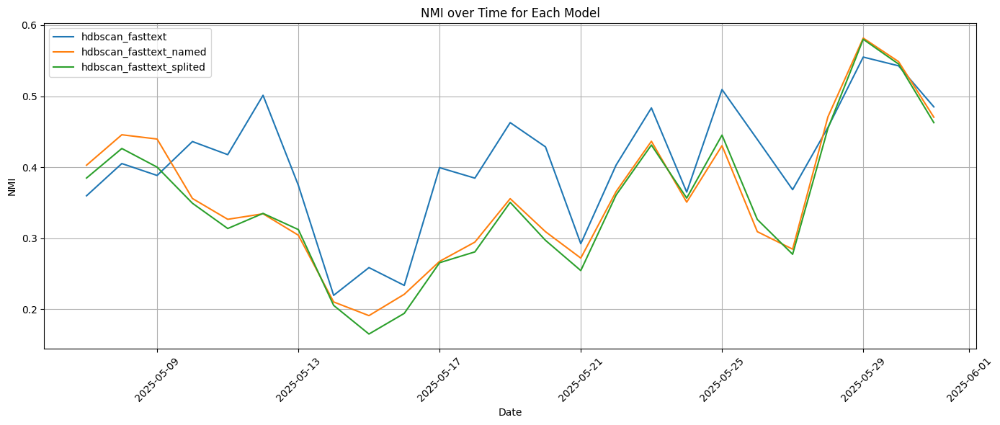

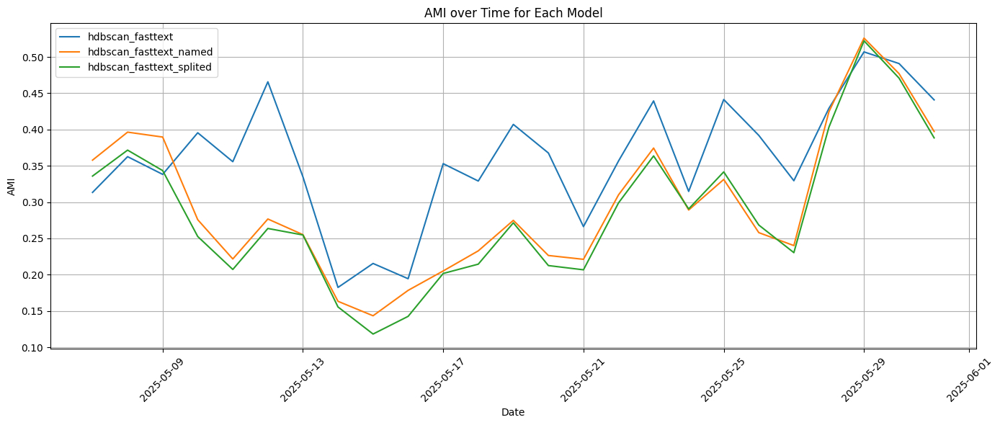

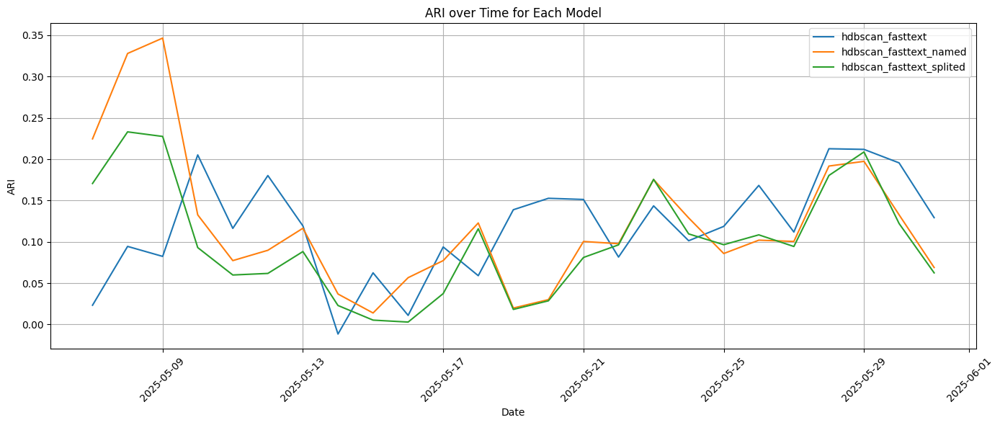

In [ ]:
#@title Plot NMI, AMI, and ARI for Multiple Models for named entities Over Time
import pandas as pd
import matplotlib.pyplot as plt

def load_and_plot_metrics(model_names, metric_names=['nmi', 'ami', 'ari']):
    # Set a color map for consistency
    color_map = {
        'nmi': 'tab:blue',
        'ari': 'tab:green',
        'ami': 'tab:orange'
    }

    # Load and store all model results
    model_dfs = {}
    for model in model_names:
        df = pd.read_csv(f"drive/MyDrive/results/{model}.csv")
        df['date'] = pd.to_datetime(df['date']).dt.date
        model_dfs[model] = df

    # Plot each metric
    for metric in metric_names:
        plt.figure(figsize=(14, 6))
        for model, df in model_dfs.items():
            plt.plot(df['date'], df[metric], label=model)

        plt.title(f"{metric.upper()} over Time for Each Model")
        plt.xlabel("Date")
        plt.ylabel(metric.upper())
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

# Example usage:
model_list = ['hdbscan_fasttext', 'hdbscan_fasttext_named','hdbscan_fasttext_splited']
load_and_plot_metrics(model_list)


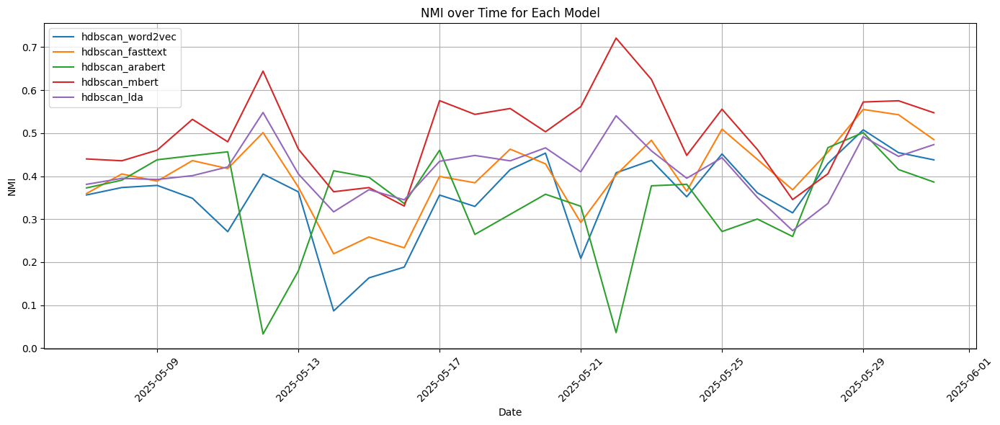

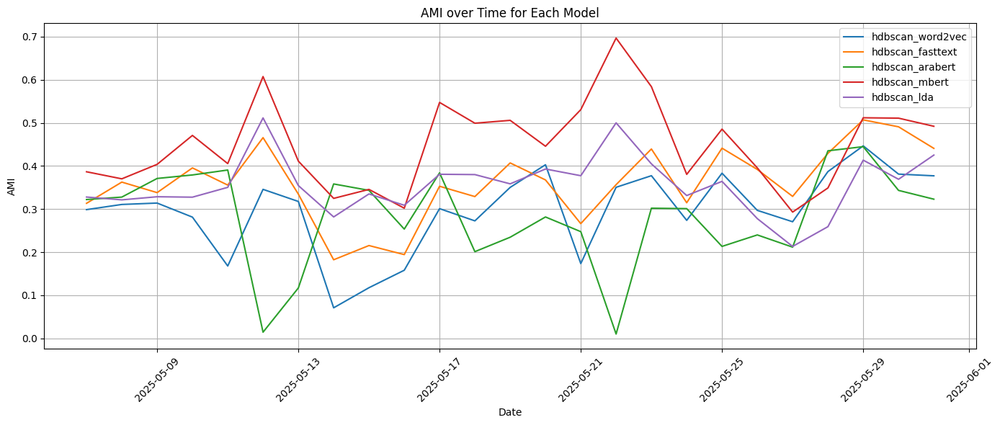

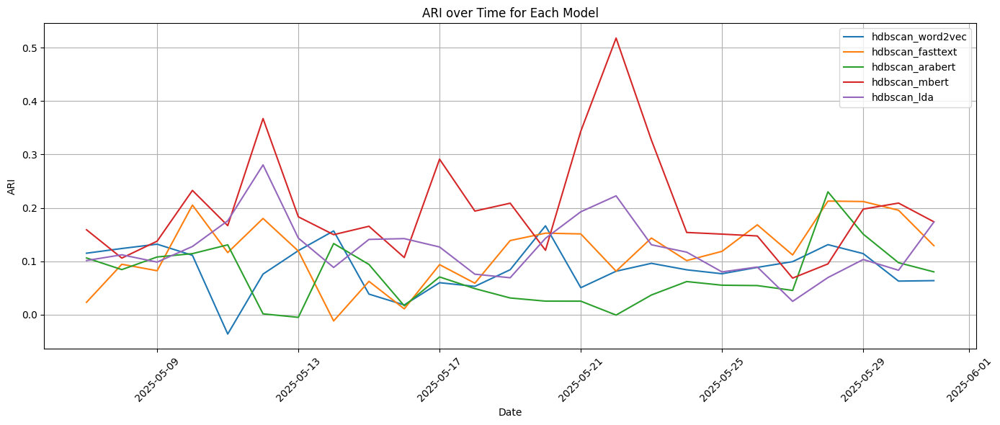

In [256]:
#@title Plot NMI, AMI, and ARI for Multiple Models Over Time
import pandas as pd
import matplotlib.pyplot as plt

def load_and_plot_metrics(model_names, metric_names=['nmi', 'ami', 'ari']):
    # Set a color map for consistency
    color_map = {
        'nmi': 'tab:blue',
        'ari': 'tab:green',
        'ami': 'tab:orange'
    }

    # Load and store all model results
    model_dfs = {}
    for model in model_names:
        df = pd.read_csv(f"drive/MyDrive/results/{model}.csv")
        df['date'] = pd.to_datetime(df['date']).dt.date
        model_dfs[model] = df

    # Plot each metric
    for metric in metric_names:
        plt.figure(figsize=(14, 6))
        for model, df in model_dfs.items():
            plt.plot(df['date'], df[metric], label=model)

        plt.title(f"{metric.upper()} over Time for Each Model")
        plt.xlabel("Date")
        plt.ylabel(metric.upper())
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

# Example usage:
model_list = ['hdbscan_word2vec','hdbscan_fasttext', 'hdbscan_arabert','hdbscan_mbert','hdbscan_lda']
load_and_plot_metrics(model_list)


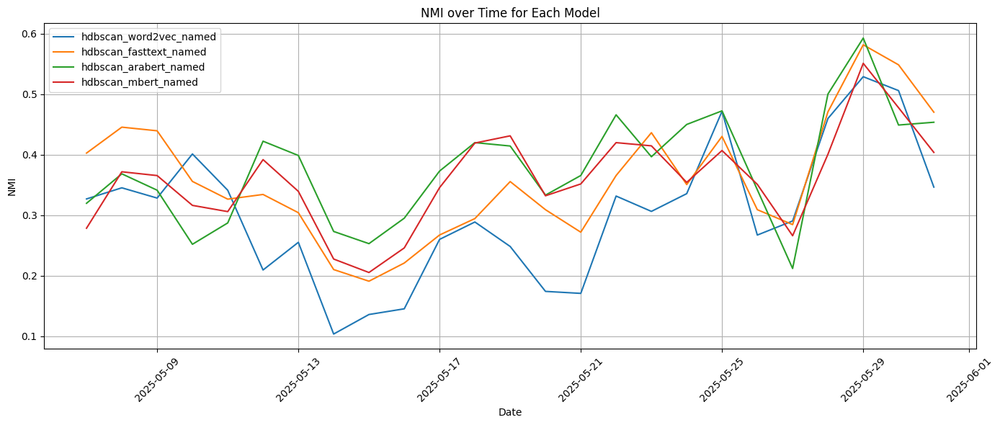

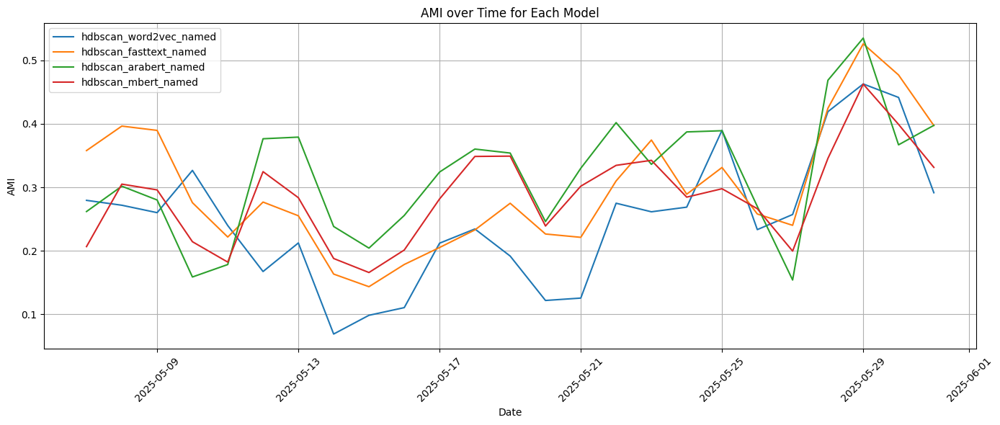

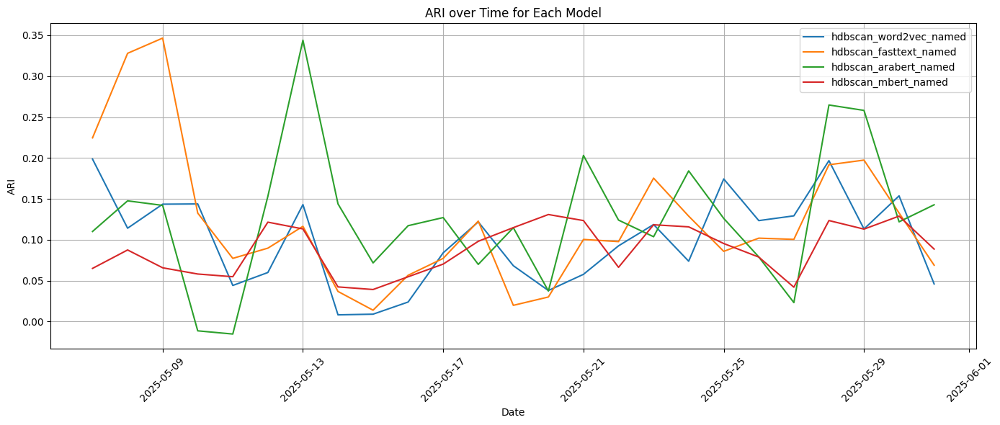

In [225]:
#@title Plot NMI, AMI, and ARI for Multiple Models Over Time
import pandas as pd
import matplotlib.pyplot as plt

def load_and_plot_metrics(model_names, metric_names=['nmi', 'ami', 'ari']):
    # Set a color map for consistency
    color_map = {
        'nmi': 'tab:blue',
        'ari': 'tab:green',
        'ami': 'tab:orange'
    }

    # Load and store all model results
    model_dfs = {}
    for model in model_names:
        df = pd.read_csv(f"drive/MyDrive/results/{model}.csv")
        df['date'] = pd.to_datetime(df['date']).dt.date
        model_dfs[model] = df

    # Plot each metric
    for metric in metric_names:
        plt.figure(figsize=(14, 6))
        for model, df in model_dfs.items():
            plt.plot(df['date'], df[metric], label=model)

        plt.title(f"{metric.upper()} over Time for Each Model")
        plt.xlabel("Date")
        plt.ylabel(metric.upper())
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

# Example usage:
model_list = ['hdbscan_word2vec_named','hdbscan_fasttext_named', 'hdbscan_arabert_named','hdbscan_mbert_named']
load_and_plot_metrics(model_list)


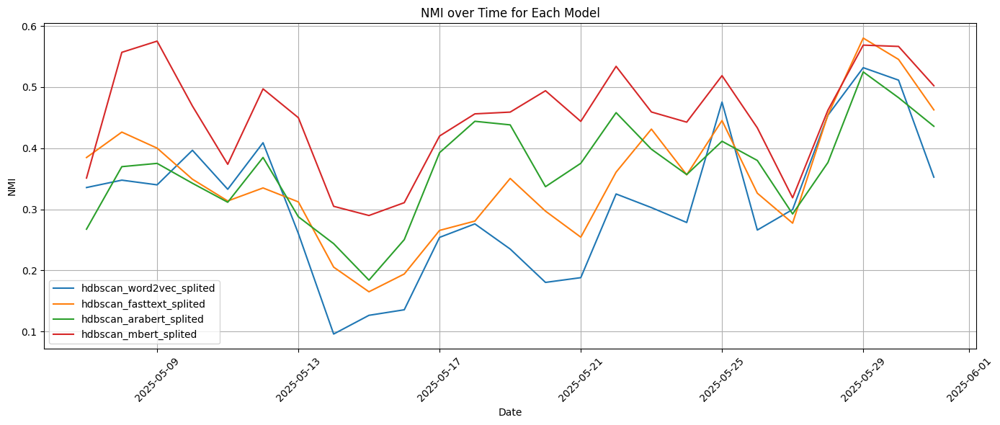

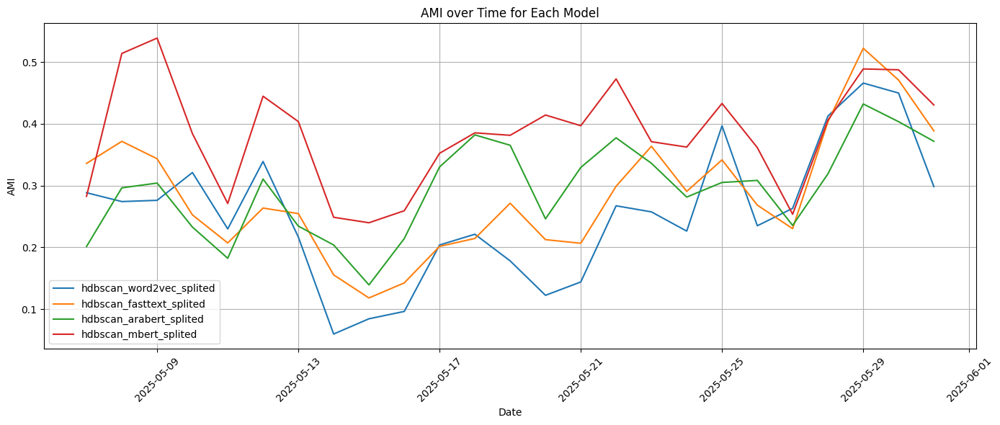

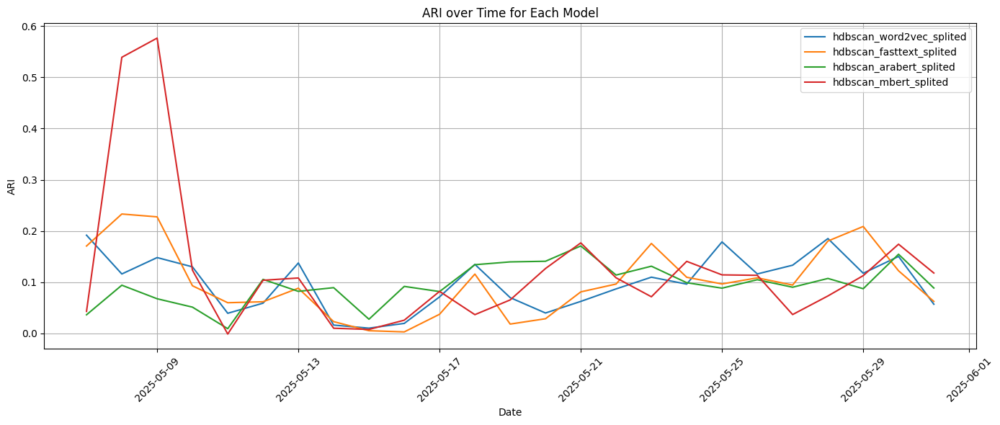

In [226]:
#@title Plot NMI, AMI, and ARI for Multiple Models Over Time
import pandas as pd
import matplotlib.pyplot as plt

def load_and_plot_metrics(model_names, metric_names=['nmi', 'ami', 'ari']):
    # Set a color map for consistency
    color_map = {
        'nmi': 'tab:blue',
        'ari': 'tab:green',
        'ami': 'tab:orange'
    }

    # Load and store all model results
    model_dfs = {}
    for model in model_names:
        df = pd.read_csv(f"drive/MyDrive/results/{model}.csv")
        df['date'] = pd.to_datetime(df['date']).dt.date
        model_dfs[model] = df

    # Plot each metric
    for metric in metric_names:
        plt.figure(figsize=(14, 6))
        for model, df in model_dfs.items():
            plt.plot(df['date'], df[metric], label=model)

        plt.title(f"{metric.upper()} over Time for Each Model")
        plt.xlabel("Date")
        plt.ylabel(metric.upper())
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

# Example usage:
model_list = ['hdbscan_word2vec_splited','hdbscan_fasttext_splited', 'hdbscan_arabert_splited','hdbscan_mbert_splited']
load_and_plot_metrics(model_list)


# LDA

### tune

In [227]:
#@title preprocessing
import nltk
nltk.download('punkt')
nltk.download('stopwords')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [232]:
import re
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')

# Use basic split instead of nltk word_tokenize to avoid punkt dependency
arabic_stopwords = set(stopwords.words('arabic'))

def normalize_arabic(text):
    text = re.sub(r'[\u064B-\u0652]', '', text)  # Remove diacritics
    text = re.sub(r'[إأآا]', 'ا', text)
    text = re.sub(r'ؤ', 'و', text)
    text = re.sub(r'ئ', 'ي', text)
    text = re.sub(r'ة', 'ه', text)
    text = re.sub(r'ى', 'ي', text)
    return text

def remove_non_arabic(text):
    return re.sub(r'[^\u0600-\u06FF\s]', '', text)

def preprocess(text):
    text = normalize_arabic(text)
    text = remove_non_arabic(text)
    tokens = text.split()  # using split instead of word_tokenize
    tokens = [word for word in tokens if word not in arabic_stopwords and len(word) > 2]
    return tokens

# Apply
df['tokens'] = df['Tweet Text'].apply(preprocess)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [237]:
num_topics=60

In [233]:
from gensim.corpora import Dictionary

dictionary = Dictionary(df['tokens'])
dictionary.filter_extremes(no_below=5, no_above=0.5)

corpus = [dictionary.doc2bow(text) for text in df['tokens']]


In [234]:
from gensim.models.ldamodel import LdaModel

lda_model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, passes=10, random_state=42)
lda_model.print_topics(num_words=5)


[(6,
  '0.299*"حلب" + 0.115*"مدينه" + 0.061*"فعاليه" + 0.048*"بسبب" + 0.029*"داخل"'),
 (25,
  '0.080*"الاربعاء" + 0.051*"العمل" + 0.040*"الكبير" + 0.039*"عندما" + 0.037*"مخدرات"'),
 (23,
  '0.090*"فرحان" + 0.074*"ابو" + 0.072*"فرقه" + 0.060*"السلطان" + 0.046*"حسين"'),
 (13,
  '0.066*"قريبا" + 0.058*"الجيش" + 0.053*"قاعده" + 0.046*"الشهداء" + 0.045*"حميميم"'),
 (1,
  '0.132*"الطاقه" + 0.083*"وزاره" + 0.046*"توقيع" + 0.039*"بحضور" + 0.035*"الرييس"'),
 (15,
  '0.099*"القاضي" + 0.071*"احمد" + 0.061*"علي" + 0.048*"العام" + 0.037*"حلب"'),
 (14,
  '0.053*"اكبر" + 0.046*"الدول" + 0.042*"يعني" + 0.039*"وان" + 0.033*"اطار"'),
 (28,
  '0.091*"الجولاني" + 0.047*"بكر" + 0.037*"الارهابيه" + 0.030*"عصابات" + 0.029*"سوريا"'),
 (49,
  '0.243*"فرنسا" + 0.141*"زياره" + 0.047*"الي" + 0.032*"الغربي" + 0.030*"كبيره"'),
 (30,
  '0.107*"النظام" + 0.043*"البايد" + 0.042*"الاستثمار" + 0.036*"علي" + 0.036*"الملك"'),
 (55,
  '0.071*"تنظيم" + 0.065*"قصر" + 0.047*"اثناء" + 0.042*"بالاضافه" + 0.039*"مسلحين"'),
 (17,

In [238]:
# Convert topic distributions to dense vectors
def get_lda_features(corpus, model, num_topics):
    features = []
    for doc in corpus:
        doc_topics = model.get_document_topics(doc, minimum_probability=0)
        dense_vector = [prob for _, prob in doc_topics]
        features.append(dense_vector)
    return np.array(features)

lda_features = get_lda_features(corpus, lda_model, num_topics=num_topics)

# Save to DataFrame
df['lda_embeddings'] = lda_features.tolist()

### online eval

In [248]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df,
    embedding_column='lda_embeddings'
)


Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:01<00:00, 24.29it/s]


In [249]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df_aug,
    embedding_column='lda_embeddings'
)



Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:01<00:00, 22.09it/s]


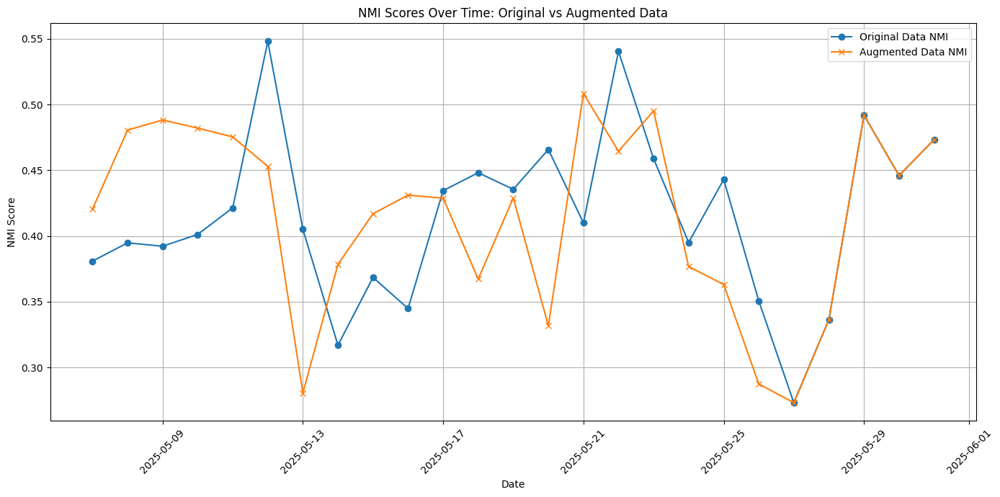

In [250]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


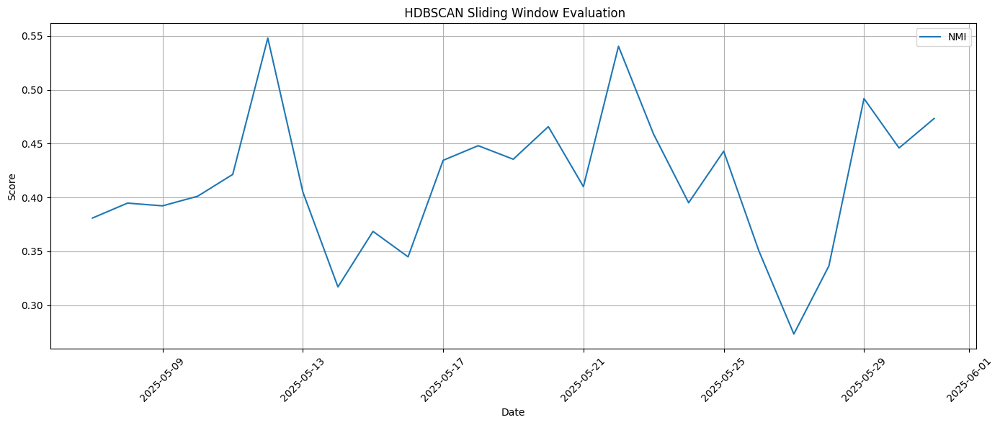

In [251]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title(" HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [252]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_lda")


Results saved to drive/MyDrive/results/hdbscan_lda.csv


In [253]:
#@title Results
models_results = {
    'hdbscan_arabert_splited': sliding_results_original,
    'hdbscan_arabert_splited_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert_splited ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.3809      0.3948      0.3923      0.4012      0.4214      0.5481   
ami       0.3280      0.3215      0.3287      0.3277      0.3505      0.5116   
ari       0.1015      0.1122      0.0985      0.1278      0.1758      0.2804   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.4051      0.3169      0.3685      0.3449  ...      0.5405   
ami       0.3546      0.2818      0.3352      0.3089  ...      0.5001   
ari       0.1434      0.0885      0.1410      0.1425  ...      0.2225   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.4588      0.3951      0.4430      0.3506      0.2732      0.3365   
ami       0.4049      0.3315      0.3643      0.2779      0.2134      0.2593   
ari       0.1310      0.1171      0.0802      0.0893      0.0251      0.0696   

date  2025-05-

In [254]:
#@title 🌀 Interactive t-SNE Plot with Plotly (Hover to Show Tweet)
import plotly.express as px
from sklearn.manifold import TSNE
import numpy as np

def interactive_tsne_plot(daily_blocks, date_key, embedding_column='final_embedding', label_column='event_label'):
    """
    Interactive t-SNE plot using Plotly with hover text as tweet messages.

    Args:
        daily_blocks: dict of daily DataFrames
        date_key: datetime.date
        embedding_column: name of column with embedding vectors
        label_column: name of column with event labels
    """
    block = daily_blocks.get(date_key)
    if block is None or block.empty:
        print(f"❌ No block found for {date_key}")
        return

    # Get embeddings and info
    embeddings = np.vstack(block[embedding_column].apply(np.array).values)
    labels = block[label_column].astype(str).values
    messages = block['Tweet Text'].values  # Update if you named the text column differently

    # Compute t-SNE
    tsne_proj = TSNE(n_components=2, random_state=42, perplexity=30).fit_transform(embeddings)

    # Prepare DataFrame
    tsne_df = pd.DataFrame({
        'x': tsne_proj[:, 0],
        'y': tsne_proj[:, 1],
        'label': labels,
        'message': messages
    })

    # Plot
    fig = px.scatter(tsne_df,
                     x='x', y='y',
                     color='label',
                     hover_data={'message': True, 'x': False, 'y': False},
                     title=f't-SNE Projection with Event Labels for {date_key}',
                     labels={'label': 'Event Label'})

    fig.update_traces(marker=dict(size=8, line=dict(width=0.5, color='DarkSlateGrey')))
    fig.update_layout(legend_title_text='Event Label', width=900, height=700)
    fig.show()

# ✅ Example usage
import datetime
interactive_tsne_plot(daily_blocks, datetime.date(2025, 5, 29))


# mBert

## HDBSCAN + mBert + Named Entities + Verbs

### tune

In [ ]:
# @title Install  mbert
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("sentence-transformers/LaBSE")



modules.json:   0%|          | 0.00/461 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/804 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/397 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

2_Dense/model.safetensors:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

2_Dense/pytorch_model.bin:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

In [ ]:
#@title Embedding the Tweets
# Imports
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from tqdm import tqdm

tweets = df['Tweet Text'].tolist()
embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

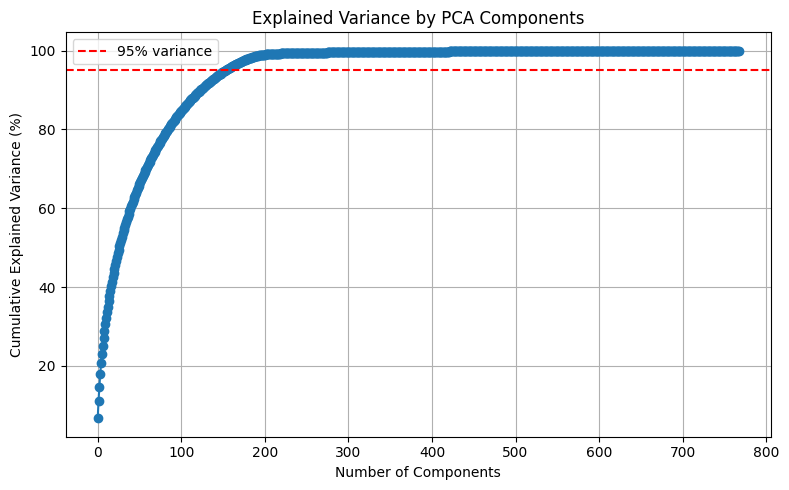


Number of components to retain 95% variance: 154


In [ ]:
#@title explainable variance
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [ ]:
#@title reduce dim
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 154

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 768)
Reduced shape: (6998, 154)


In [ ]:
#@title save tweet embedding
df['mbert_embeddings']=reduced_embeddings.tolist()

In [ ]:
#@title Embedding of Named Entities
from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
from collections import defaultdict

# --- Ensure the columns contain lists ---
columns_to_eval = ['Named Entities', 'PER', 'ORG', 'LOC', 'verbs', 'nouns', 'adjectives']
for col in columns_to_eval:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

def batched_avg_embeddings(token_lists, column_name):
    """
    Efficiently embed a list of token lists using AraBERT and average each.
    """
    print(f"🔄 Embedding column: {column_name}")
    all_tokens = []
    token_indices = []  # Track which tokens belong to which row

    for i, tokens in enumerate(token_lists):
        filtered = [t for t in tokens if t.strip()]
        token_indices.extend([i] * len(filtered))
        all_tokens.extend(filtered)

    if not all_tokens:
        return [np.zeros(embedding_model.get_sentence_embedding_dimension())] * len(token_lists)

    # Embed all tokens in batch
    all_embeddings = embedding_model.encode(all_tokens, batch_size=32, show_progress_bar=True)

    # Group by row index
    grouped = defaultdict(list)
    for idx, emb in zip(token_indices, all_embeddings):
        grouped[idx].append(emb)

    # Average per row
    avg_embeddings = []
    for i in range(len(token_lists)):
        vecs = grouped.get(i)
        if vecs:
            avg_embeddings.append(np.mean(vecs, axis=0))
        else:
            avg_embeddings.append(np.zeros(embedding_model.get_sentence_embedding_dimension()))
    return avg_embeddings

# --- Run on all relevant columns ---
for col in tqdm(columns_to_eval, desc="Batch Embedding Columns"):
    df[col + '_embedding'] = batched_avg_embeddings(df[col], col)

print("✅ Done with fast AraBERT token embeddings.")


Batch Embedding Columns:   0%|          | 0/7 [00:00<?, ?it/s]

🔄 Embedding column: Named Entities


Batches:   0%|          | 0/513 [00:00<?, ?it/s]

🔄 Embedding column: PER


Batches:   0%|          | 0/145 [00:00<?, ?it/s]

🔄 Embedding column: ORG


Batches:   0%|          | 0/63 [00:00<?, ?it/s]

🔄 Embedding column: LOC


Batches:   0%|          | 0/306 [00:00<?, ?it/s]

🔄 Embedding column: verbs


Batches:   0%|          | 0/525 [00:00<?, ?it/s]

🔄 Embedding column: nouns


Batches:   0%|          | 0/2558 [00:00<?, ?it/s]

🔄 Embedding column: adjectives


Batches:   0%|          | 0/709 [00:00<?, ?it/s]

✅ Done with fast AraBERT token embeddings.


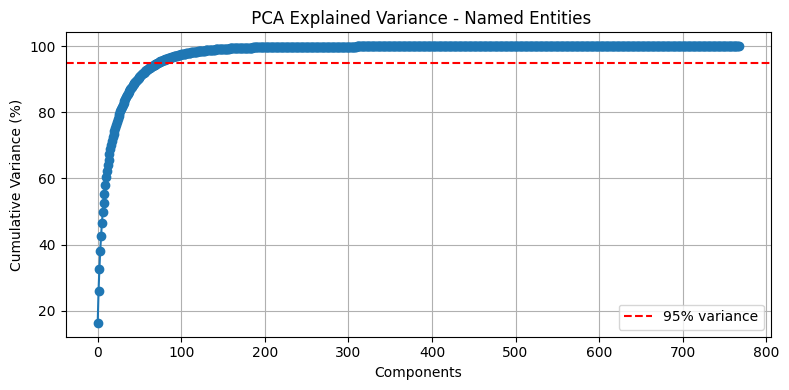

✅ Named Entities: 74 components retain 95% variance


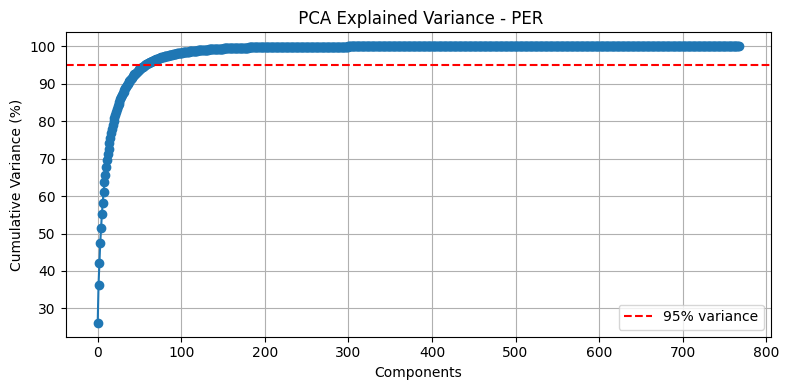

✅ PER: 58 components retain 95% variance


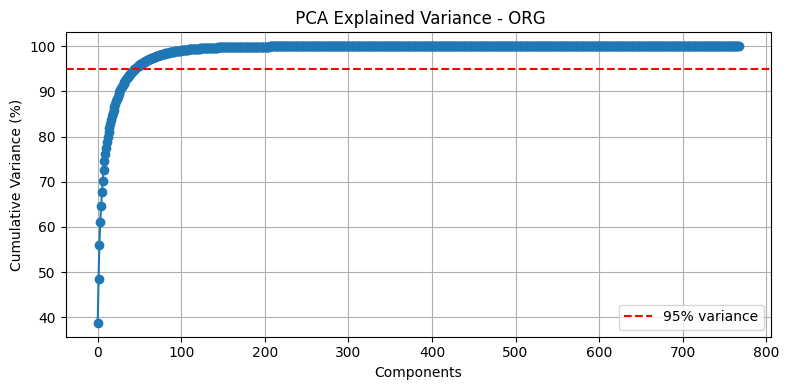

✅ ORG: 46 components retain 95% variance


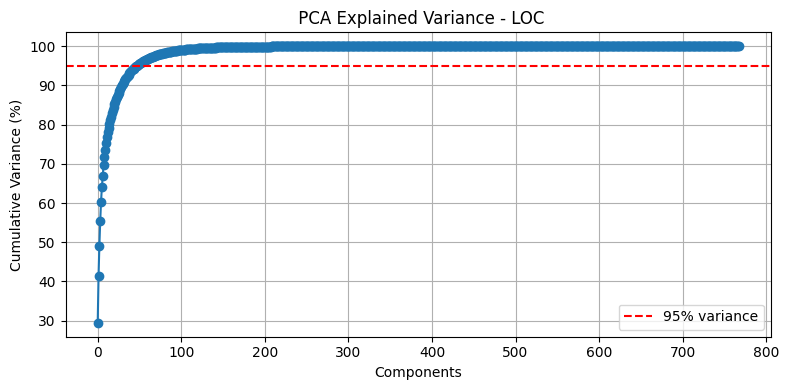

✅ LOC: 48 components retain 95% variance


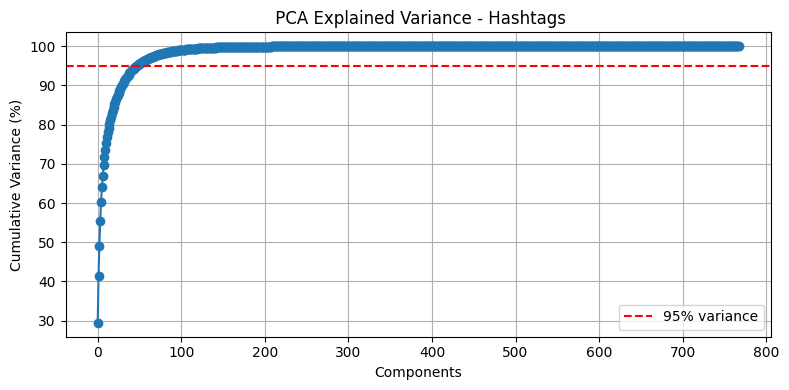

✅ Hashtags: 48 components retain 95% variance


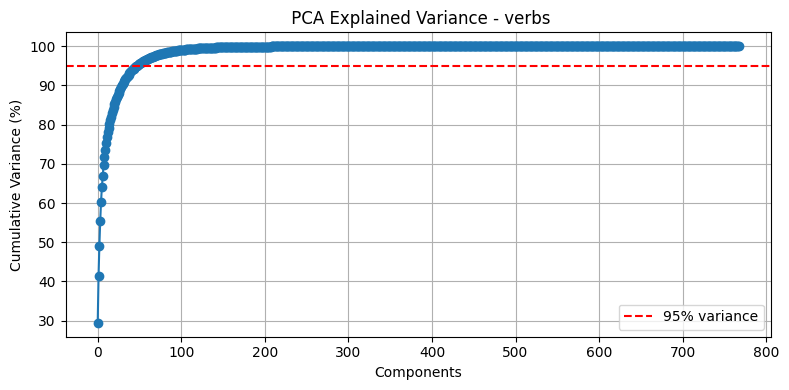

✅ verbs: 48 components retain 95% variance


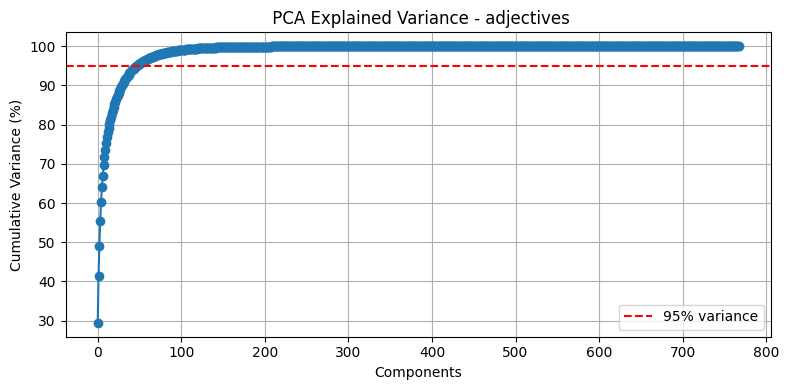

✅ adjectives: 48 components retain 95% variance


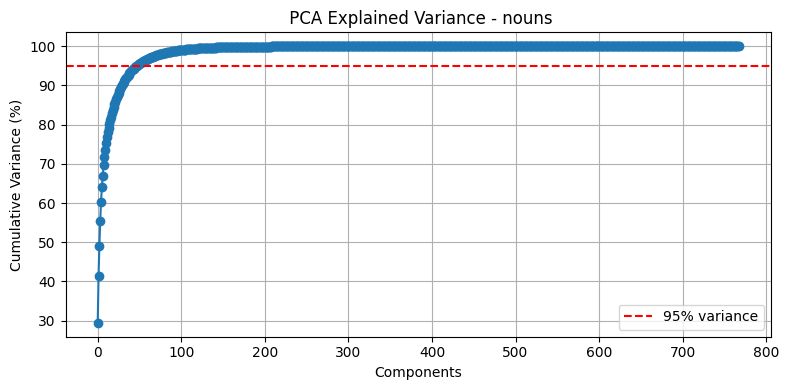

✅ nouns: 48 components retain 95% variance

🧠 PCA-reduced embeddings added to dataframe.


In [ ]:
#@title PCA Reduction on Named Entity Embeddings

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
# --- Save to DataFrame ---
named_entities_embedding= df['Named Entities_embedding']
PER_embedding = df['PER_embedding']
ORG_embedding = df['ORG_embedding']
LOC_embedding = df['LOC_embedding']
VERBS_embedding = df['verbs_embedding']
NOUNS_embedding = df['nouns_embedding']
ADJ_embedding = df['adjectives_embedding']

# Convert Series of vectors to arrays
ne_array = np.vstack(named_entities_embedding.values)
per_array = np.vstack(PER_embedding.values)
org_array = np.vstack(ORG_embedding.values)
loc_array = np.vstack(LOC_embedding.values)

verbs_array = np.vstack(VERBS_embedding.values)
adj_array = np.vstack(ADJ_embedding.values)
nouns_array = np.vstack(NOUNS_embedding.values)

def reduce_with_pca(name, X, threshold=0.95):
    pca = PCA()
    pca.fit(X)

    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_variance >= threshold) + 1

    # Plot explained variance
    plt.figure(figsize=(8, 4))
    plt.plot(cumulative_variance * 100, marker='o')
    plt.axhline(y=threshold * 100, color='red', linestyle='--', label=f'{int(threshold * 100)}% variance')
    plt.title(f' PCA Explained Variance - {name}')
    plt.xlabel('Components')
    plt.ylabel('Cumulative Variance (%)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"✅ {name}: {n_components} components retain {int(threshold*100)}% variance")

    # Final reduction
    reduced = PCA(n_components=n_components).fit_transform(X)
    return reduced

# Apply PCA
named_entities_reduced = reduce_with_pca("Named Entities", ne_array)
per_reduced = reduce_with_pca("PER", per_array)
org_reduced = reduce_with_pca("ORG", org_array)
loc_reduced = reduce_with_pca("LOC", loc_array)
hash_reduced = reduce_with_pca("Hashtags", loc_array)

verb_reduced = reduce_with_pca("verbs", loc_array)
adj_reduced = reduce_with_pca("adjectives", loc_array)
nouns_reduced = reduce_with_pca("nouns", loc_array)


# Save to DataFrame
df['NamedEntities_PCA'] = named_entities_reduced.tolist()
df['PER_PCA'] = per_reduced.tolist()
df['ORG_PCA'] = org_reduced.tolist()
df['LOC_PCA'] = loc_reduced.tolist()
df['Hashtags_PCA'] = hash_reduced.tolist()

df['VERBS_PCA'] = nouns_reduced.tolist()
df['ADJ_PCA'] = adj_reduced.tolist()
df['NOUNS_PCA'] = verb_reduced.tolist()


# Confirm
print("\n🧠 PCA-reduced embeddings added to dataframe.")


In [208]:
# @title Save reduced embeddings
# Convert each PCA column to a NumPy array
named = np.vstack(df['NamedEntities_PCA'].apply(np.array).values)
per   = np.vstack(df['PER_PCA'].apply(np.array).values)
org   = np.vstack(df['ORG_PCA'].apply(np.array).values)
loc   = np.vstack(df['LOC_PCA'].apply(np.array).values)

verbs   = np.vstack(df['VERBS_PCA'].apply(np.array).values)
nouns   = np.vstack(df['NOUNS_PCA'].apply(np.array).values)
adj   = np.vstack(df['ADJ_PCA'].apply(np.array).values)

# Concatenate horizontally
final_embeddings = np.hstack([reduced_embeddings,nouns, per, org])#, per, org, loc

# Store back into df
df['final_embedding'] = list(final_embeddings)

# ✅ Confirm
print("🎯 Final embedding column shape per row:", final_embeddings[0].shape)
print("📦 Final embedding column added to df.")


🎯 Final embedding column shape per row: (306,)
📦 Final embedding column added to df.


### online eval

In [218]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=500,
    time_window_days=3,
    min_cluster_size=3,
    min_samples=3,
    initial_df=tuning_df,
    embedding_column='final_embedding'

)

Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:01<00:00, 22.57it/s]


In [219]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df_aug,
    embedding_column='final_embedding'

)


Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:01<00:00, 20.53it/s]


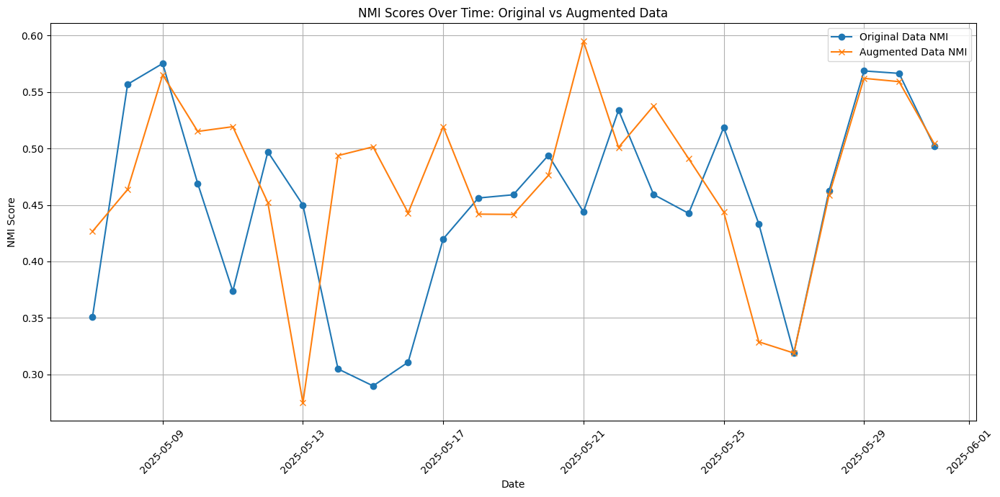

In [220]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


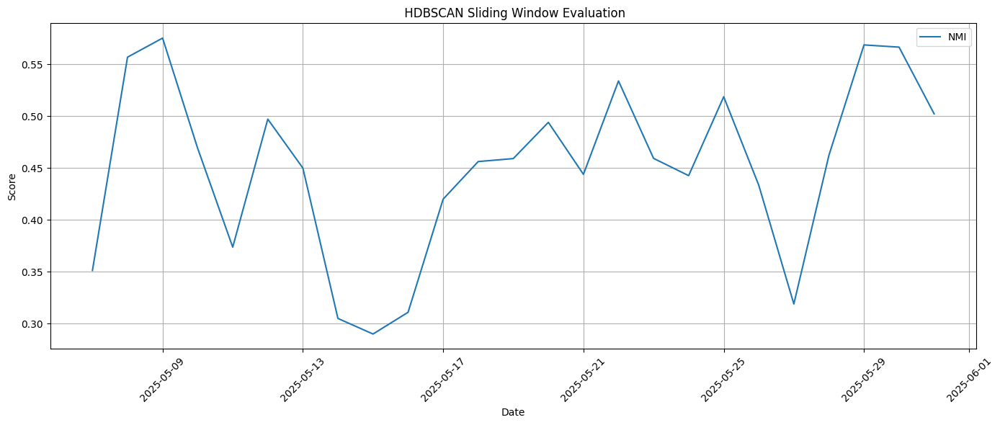

In [221]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title(" HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [222]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_mbert_v")


Results saved to drive/MyDrive/results/hdbscan_mbert_v.csv


In [223]:
#@title Results
models_results = {
    'hdbscan_arabert_splited': sliding_results_original,
    'hdbscan_arabert_splited_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert_splited ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.3511      0.5569      0.5753      0.4690      0.3736      0.4971   
ami       0.2827      0.5139      0.5388      0.3841      0.2711      0.4447   
ari       0.0430      0.5391      0.5766      0.1235     -0.0013      0.1037   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.4499      0.3048      0.2898      0.3108  ...      0.5339   
ami       0.4036      0.2488      0.2399      0.2593  ...      0.4727   
ari       0.1082      0.0101      0.0077      0.0258  ...      0.1085   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.4592      0.4426      0.5187      0.4333      0.3188      0.4622   
ami       0.3711      0.3624      0.4330      0.3615      0.2537      0.4060   
ari       0.0715      0.1406      0.1143      0.1134      0.0368      0.0731   

date  2025-05-

In [224]:
#@title 🌀 Interactive t-SNE Plot with Plotly (Hover to Show Tweet)
import plotly.express as px
from sklearn.manifold import TSNE
import numpy as np

def interactive_tsne_plot(daily_blocks, date_key, embedding_column='final_embedding', label_column='event_label'):
    """
    Interactive t-SNE plot using Plotly with hover text as tweet messages.

    Args:
        daily_blocks: dict of daily DataFrames
        date_key: datetime.date
        embedding_column: name of column with embedding vectors
        label_column: name of column with event labels
    """
    block = daily_blocks.get(date_key)
    if block is None or block.empty:
        print(f"❌ No block found for {date_key}")
        return

    # Get embeddings and info
    embeddings = np.vstack(block[embedding_column].apply(np.array).values)
    labels = block[label_column].astype(str).values
    messages = block['Tweet Text'].values  # Update if you named the text column differently

    # Compute t-SNE
    tsne_proj = TSNE(n_components=2, random_state=42, perplexity=30).fit_transform(embeddings)

    # Prepare DataFrame
    tsne_df = pd.DataFrame({
        'x': tsne_proj[:, 0],
        'y': tsne_proj[:, 1],
        'label': labels,
        'message': messages
    })

    # Plot
    fig = px.scatter(tsne_df,
                     x='x', y='y',
                     color='label',
                     hover_data={'message': True, 'x': False, 'y': False},
                     title=f't-SNE Projection with Event Labels for {date_key}',
                     labels={'label': 'Event Label'})

    fig.update_traces(marker=dict(size=8, line=dict(width=0.5, color='DarkSlateGrey')))
    fig.update_layout(legend_title_text='Event Label', width=900, height=700)
    fig.show()

# ✅ Example usage
import datetime
interactive_tsne_plot(daily_blocks, datetime.date(2025, 5, 29))


## HDBSCAN + mBert + Named Entities Splited

### tune

In [ ]:
# @title Install  mbert
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("sentence-transformers/LaBSE")



modules.json:   0%|          | 0.00/461 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/804 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/397 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

2_Dense/model.safetensors:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

2_Dense/pytorch_model.bin:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

In [ ]:
#@title Embedding the Tweets
# Imports
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from tqdm import tqdm

tweets = df['Tweet Text'].tolist()
embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

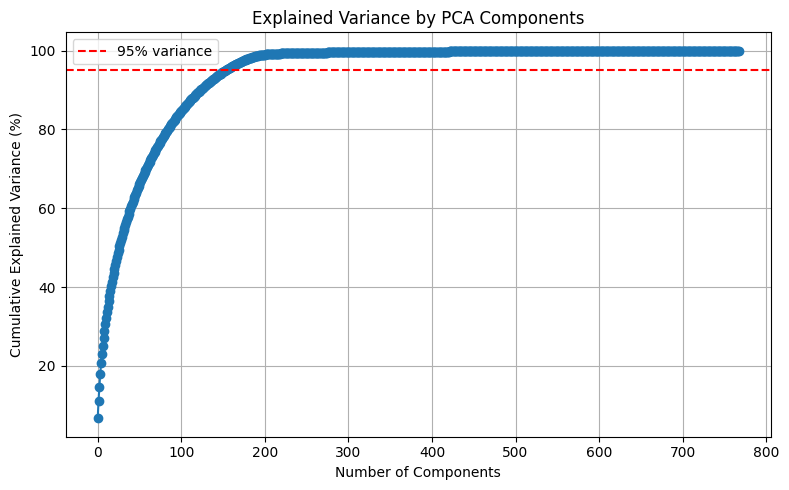


Number of components to retain 95% variance: 154


In [ ]:
#@title explainable variance
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [ ]:
#@title reduce dim
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 154

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 768)
Reduced shape: (6998, 154)


In [ ]:
#@title save tweet embedding
df['mbert_embeddings']=reduced_embeddings.tolist()

In [ ]:
#@title Embedding of Named Entities
from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
from collections import defaultdict

# --- Ensure the columns contain lists ---
columns_to_eval = ['Named Entities', 'PER', 'ORG', 'LOC', 'verbs', 'nouns', 'adjectives']
for col in columns_to_eval:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

def batched_avg_embeddings(token_lists, column_name):
    """
    Efficiently embed a list of token lists using AraBERT and average each.
    """
    print(f"🔄 Embedding column: {column_name}")
    all_tokens = []
    token_indices = []  # Track which tokens belong to which row

    for i, tokens in enumerate(token_lists):
        filtered = [t for t in tokens if t.strip()]
        token_indices.extend([i] * len(filtered))
        all_tokens.extend(filtered)

    if not all_tokens:
        return [np.zeros(embedding_model.get_sentence_embedding_dimension())] * len(token_lists)

    # Embed all tokens in batch
    all_embeddings = embedding_model.encode(all_tokens, batch_size=32, show_progress_bar=True)

    # Group by row index
    grouped = defaultdict(list)
    for idx, emb in zip(token_indices, all_embeddings):
        grouped[idx].append(emb)

    # Average per row
    avg_embeddings = []
    for i in range(len(token_lists)):
        vecs = grouped.get(i)
        if vecs:
            avg_embeddings.append(np.mean(vecs, axis=0))
        else:
            avg_embeddings.append(np.zeros(embedding_model.get_sentence_embedding_dimension()))
    return avg_embeddings

# --- Run on all relevant columns ---
for col in tqdm(columns_to_eval, desc="Batch Embedding Columns"):
    df[col + '_embedding'] = batched_avg_embeddings(df[col], col)

print("✅ Done with fast AraBERT token embeddings.")


Batch Embedding Columns:   0%|          | 0/7 [00:00<?, ?it/s]

🔄 Embedding column: Named Entities


Batches:   0%|          | 0/513 [00:00<?, ?it/s]

🔄 Embedding column: PER


Batches:   0%|          | 0/145 [00:00<?, ?it/s]

🔄 Embedding column: ORG


Batches:   0%|          | 0/63 [00:00<?, ?it/s]

🔄 Embedding column: LOC


Batches:   0%|          | 0/306 [00:00<?, ?it/s]

🔄 Embedding column: verbs


Batches:   0%|          | 0/525 [00:00<?, ?it/s]

🔄 Embedding column: nouns


Batches:   0%|          | 0/2558 [00:00<?, ?it/s]

🔄 Embedding column: adjectives


Batches:   0%|          | 0/709 [00:00<?, ?it/s]

✅ Done with fast AraBERT token embeddings.


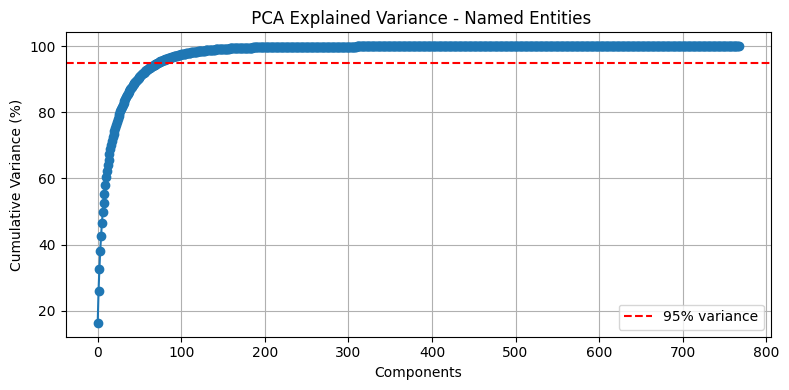

✅ Named Entities: 74 components retain 95% variance


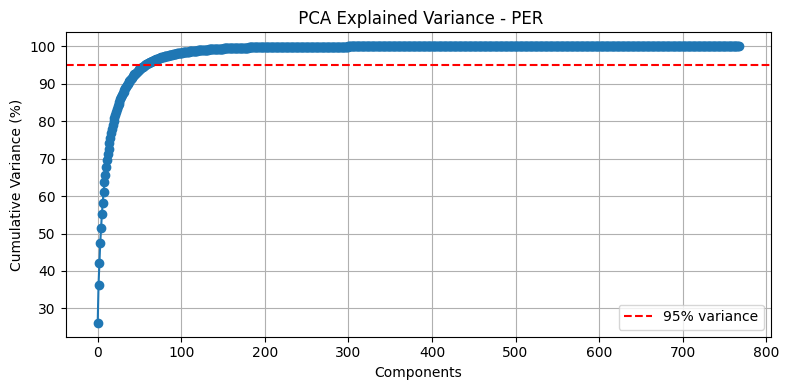

✅ PER: 58 components retain 95% variance


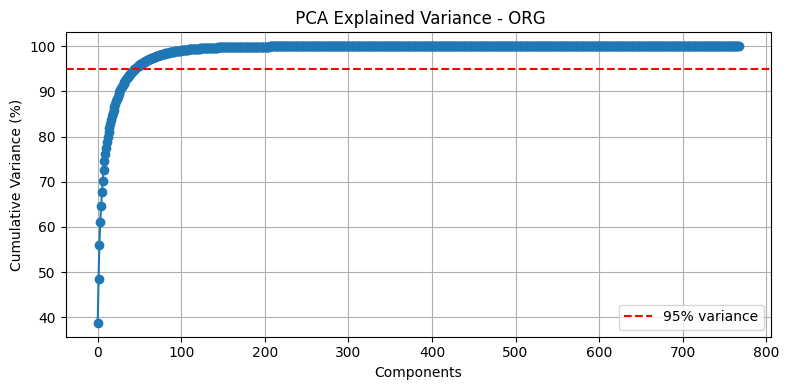

✅ ORG: 46 components retain 95% variance


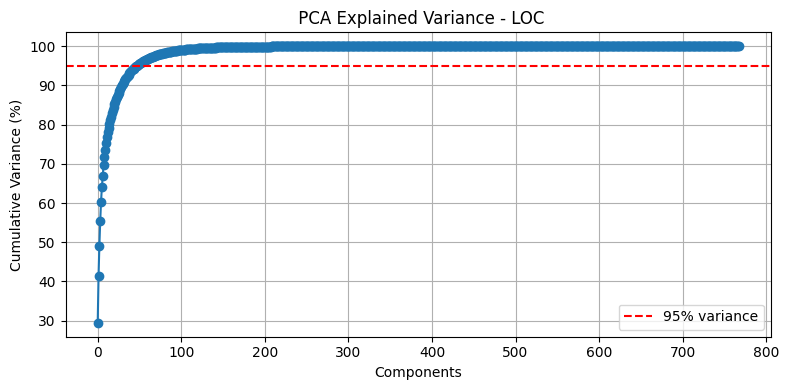

✅ LOC: 48 components retain 95% variance


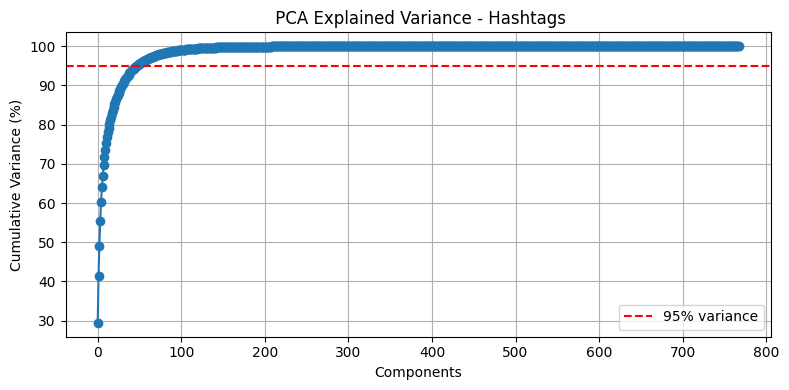

✅ Hashtags: 48 components retain 95% variance


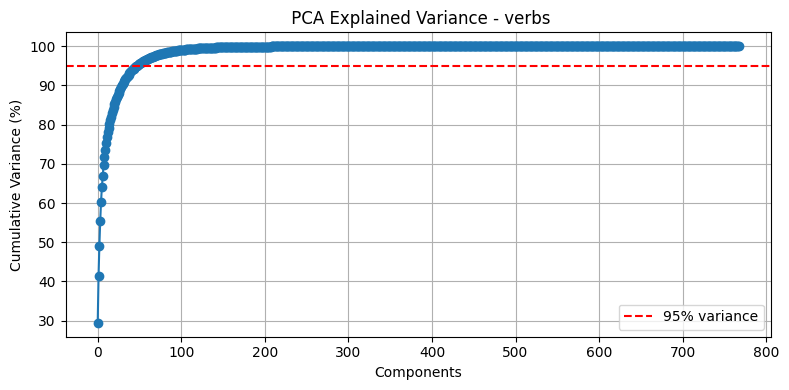

✅ verbs: 48 components retain 95% variance


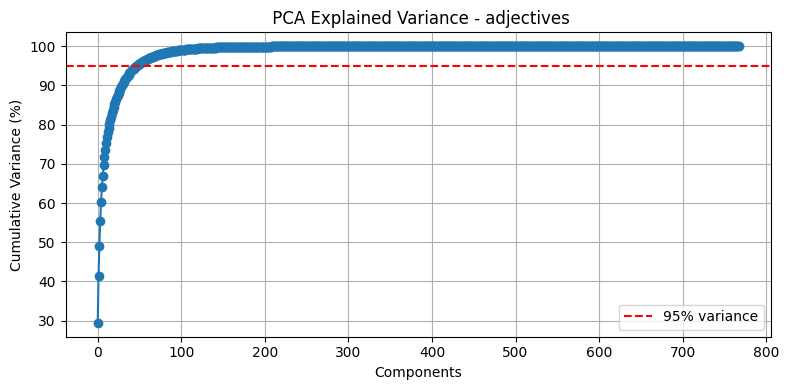

✅ adjectives: 48 components retain 95% variance


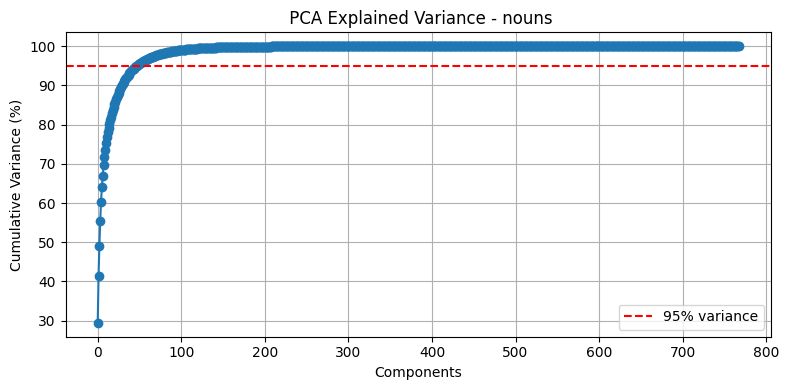

✅ nouns: 48 components retain 95% variance

🧠 PCA-reduced embeddings added to dataframe.


In [ ]:
#@title PCA Reduction on Named Entity Embeddings

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
# --- Save to DataFrame ---
named_entities_embedding= df['Named Entities_embedding']
PER_embedding = df['PER_embedding']
ORG_embedding = df['ORG_embedding']
LOC_embedding = df['LOC_embedding']
VERBS_embedding = df['verbs_embedding']
NOUNS_embedding = df['nouns_embedding']
ADJ_embedding = df['adjectives_embedding']

# Convert Series of vectors to arrays
ne_array = np.vstack(named_entities_embedding.values)
per_array = np.vstack(PER_embedding.values)
org_array = np.vstack(ORG_embedding.values)
loc_array = np.vstack(LOC_embedding.values)

verbs_array = np.vstack(VERBS_embedding.values)
adj_array = np.vstack(ADJ_embedding.values)
nouns_array = np.vstack(NOUNS_embedding.values)

def reduce_with_pca(name, X, threshold=0.95):
    pca = PCA()
    pca.fit(X)

    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_variance >= threshold) + 1

    # Plot explained variance
    plt.figure(figsize=(8, 4))
    plt.plot(cumulative_variance * 100, marker='o')
    plt.axhline(y=threshold * 100, color='red', linestyle='--', label=f'{int(threshold * 100)}% variance')
    plt.title(f' PCA Explained Variance - {name}')
    plt.xlabel('Components')
    plt.ylabel('Cumulative Variance (%)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"✅ {name}: {n_components} components retain {int(threshold*100)}% variance")

    # Final reduction
    reduced = PCA(n_components=n_components).fit_transform(X)
    return reduced

# Apply PCA
named_entities_reduced = reduce_with_pca("Named Entities", ne_array)
per_reduced = reduce_with_pca("PER", per_array)
org_reduced = reduce_with_pca("ORG", org_array)
loc_reduced = reduce_with_pca("LOC", loc_array)
hash_reduced = reduce_with_pca("Hashtags", loc_array)

verb_reduced = reduce_with_pca("verbs", loc_array)
adj_reduced = reduce_with_pca("adjectives", loc_array)
nouns_reduced = reduce_with_pca("nouns", loc_array)


# Save to DataFrame
df['NamedEntities_PCA'] = named_entities_reduced.tolist()
df['PER_PCA'] = per_reduced.tolist()
df['ORG_PCA'] = org_reduced.tolist()
df['LOC_PCA'] = loc_reduced.tolist()
df['Hashtags_PCA'] = hash_reduced.tolist()

df['VERBS_PCA'] = nouns_reduced.tolist()
df['ADJ_PCA'] = adj_reduced.tolist()
df['NOUNS_PCA'] = verb_reduced.tolist()


# Confirm
print("\n🧠 PCA-reduced embeddings added to dataframe.")


In [170]:
# @title Save reduced embeddings back to DataFrame
# Convert each PCA column to a NumPy array
named = np.vstack(df['NamedEntities_PCA'].apply(np.array).values)
per   = np.vstack(df['PER_PCA'].apply(np.array).values)
org   = np.vstack(df['ORG_PCA'].apply(np.array).values)
loc   = np.vstack(df['LOC_PCA'].apply(np.array).values)

verbs   = np.vstack(df['VERBS_PCA'].apply(np.array).values)
nouns   = np.vstack(df['NOUNS_PCA'].apply(np.array).values)
adj   = np.vstack(df['ADJ_PCA'].apply(np.array).values)

# Concatenate horizontally
final_embeddings = np.hstack([reduced_embeddings, per, org, loc])#, per, org, loc

# Store back into df
df['final_embedding'] = list(final_embeddings)

# ✅ Confirm
print("🎯 Final embedding column shape per row:", final_embeddings[0].shape)
print("📦 Final embedding column added to df.")


🎯 Final embedding column shape per row: (306,)
📦 Final embedding column added to df.


### online eval

In [181]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=500,
    time_window_days=3,
    min_cluster_size=3,
    min_samples=3,
    initial_df=tuning_df,
    embedding_column='final_embedding'

)

Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:01<00:00, 14.34it/s]


In [182]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df_aug,
    embedding_column='final_embedding'

)


Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:02<00:00, 11.93it/s]


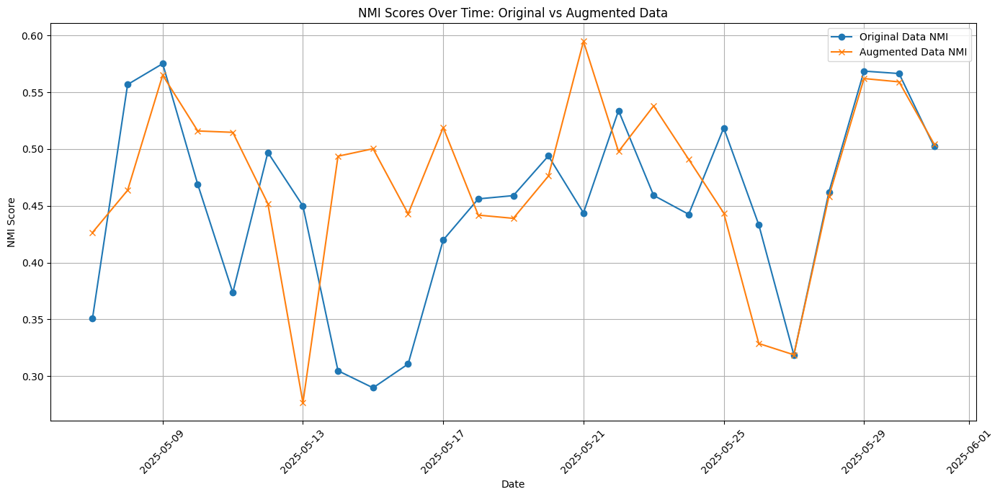

In [183]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


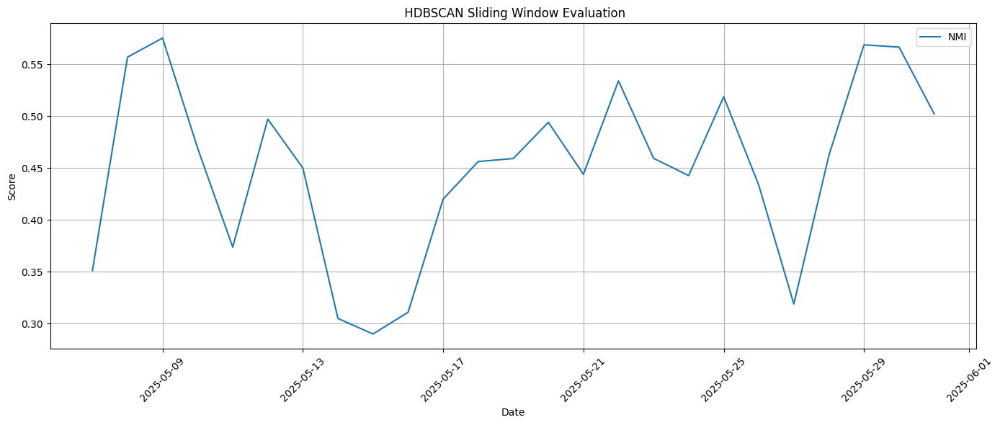

In [184]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title(" HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [185]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_mbert_splited")


Results saved to drive/MyDrive/results/hdbscan_mbert_splited.csv


In [186]:
#@title Results
models_results = {
    'hdbscan_arabert_splited': sliding_results_original,
    'hdbscan_arabert_splited_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert_splited ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.3511      0.5569      0.5752      0.4690      0.3736      0.4971   
ami       0.2827      0.5139      0.5388      0.3841      0.2711      0.4447   
ari       0.0430      0.5391      0.5766      0.1235     -0.0013      0.1037   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.4499      0.3048      0.2898      0.3108  ...      0.5339   
ami       0.4036      0.2488      0.2399      0.2593  ...      0.4727   
ari       0.1082      0.0101      0.0077      0.0258  ...      0.1085   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.4592      0.4426      0.5187      0.4333      0.3188      0.4622   
ami       0.3711      0.3624      0.4330      0.3615      0.2537      0.4060   
ari       0.0715      0.1406      0.1143      0.1134      0.0368      0.0731   

date  2025-05-

In [187]:
#@title 🌀 Interactive t-SNE Plot with Plotly (Hover to Show Tweet)
import plotly.express as px
from sklearn.manifold import TSNE
import numpy as np

def interactive_tsne_plot(daily_blocks, date_key, embedding_column='final_embedding', label_column='event_label'):
    """
    Interactive t-SNE plot using Plotly with hover text as tweet messages.

    Args:
        daily_blocks: dict of daily DataFrames
        date_key: datetime.date
        embedding_column: name of column with embedding vectors
        label_column: name of column with event labels
    """
    block = daily_blocks.get(date_key)
    if block is None or block.empty:
        print(f"❌ No block found for {date_key}")
        return

    # Get embeddings and info
    embeddings = np.vstack(block[embedding_column].apply(np.array).values)
    labels = block[label_column].astype(str).values
    messages = block['Tweet Text'].values  # Update if you named the text column differently

    # Compute t-SNE
    tsne_proj = TSNE(n_components=2, random_state=42, perplexity=30).fit_transform(embeddings)

    # Prepare DataFrame
    tsne_df = pd.DataFrame({
        'x': tsne_proj[:, 0],
        'y': tsne_proj[:, 1],
        'label': labels,
        'message': messages
    })

    # Plot
    fig = px.scatter(tsne_df,
                     x='x', y='y',
                     color='label',
                     hover_data={'message': True, 'x': False, 'y': False},
                     title=f't-SNE Projection with Event Labels for {date_key}',
                     labels={'label': 'Event Label'})

    fig.update_traces(marker=dict(size=8, line=dict(width=0.5, color='DarkSlateGrey')))
    fig.update_layout(legend_title_text='Event Label', width=900, height=700)
    fig.show()

# ✅ Example usage
import datetime
interactive_tsne_plot(daily_blocks, datetime.date(2025, 5, 29))


## HDBSCAN + mBert + Named Entities

### tune

In [ ]:
# @title Install  mbert
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("sentence-transformers/LaBSE")



modules.json:   0%|          | 0.00/461 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/804 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/397 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

2_Dense/model.safetensors:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

2_Dense/pytorch_model.bin:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

In [ ]:
#@title Embedding the Tweets
# Imports
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from tqdm import tqdm

tweets = df['Tweet Text'].tolist()
embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

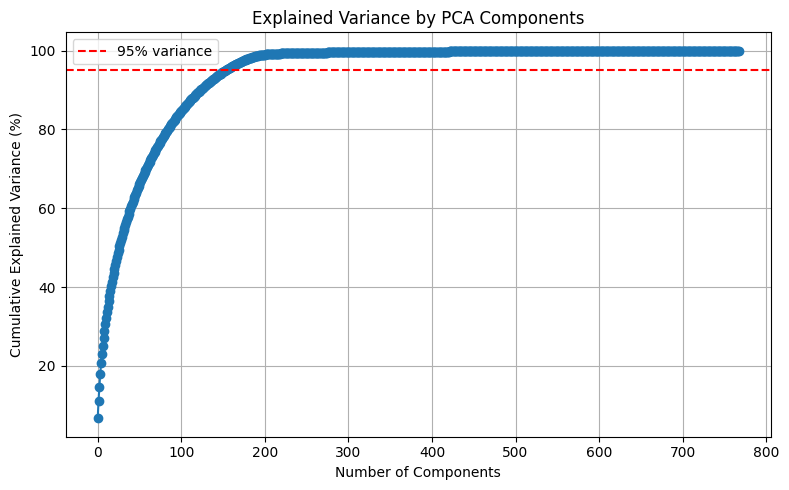


Number of components to retain 95% variance: 154


In [ ]:
#@title explainable variance
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [ ]:
#@title reduce dim
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 154

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 768)
Reduced shape: (6998, 154)


In [ ]:
#@title save tweet embedding
df['mbert_embeddings']=reduced_embeddings.tolist()

In [159]:
#@title Embedding of Named Entities
from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
from collections import defaultdict

# --- Ensure the columns contain lists ---
columns_to_eval = ['Named Entities', 'PER', 'ORG', 'LOC', 'verbs', 'nouns', 'adjectives']
for col in columns_to_eval:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

def batched_avg_embeddings(token_lists, column_name):
    """
    Efficiently embed a list of token lists using AraBERT and average each.
    """
    print(f"🔄 Embedding column: {column_name}")
    all_tokens = []
    token_indices = []  # Track which tokens belong to which row

    for i, tokens in enumerate(token_lists):
        filtered = [t for t in tokens if t.strip()]
        token_indices.extend([i] * len(filtered))
        all_tokens.extend(filtered)

    if not all_tokens:
        return [np.zeros(embedding_model.get_sentence_embedding_dimension())] * len(token_lists)

    # Embed all tokens in batch
    all_embeddings = embedding_model.encode(all_tokens, batch_size=32, show_progress_bar=True)

    # Group by row index
    grouped = defaultdict(list)
    for idx, emb in zip(token_indices, all_embeddings):
        grouped[idx].append(emb)

    # Average per row
    avg_embeddings = []
    for i in range(len(token_lists)):
        vecs = grouped.get(i)
        if vecs:
            avg_embeddings.append(np.mean(vecs, axis=0))
        else:
            avg_embeddings.append(np.zeros(embedding_model.get_sentence_embedding_dimension()))
    return avg_embeddings

# --- Run on all relevant columns ---
for col in tqdm(columns_to_eval, desc="Batch Embedding Columns"):
    df[col + '_embedding'] = batched_avg_embeddings(df[col], col)

print("✅ Done with fast AraBERT token embeddings.")


Batch Embedding Columns:   0%|          | 0/7 [00:00<?, ?it/s]

🔄 Embedding column: Named Entities


Batches:   0%|          | 0/513 [00:00<?, ?it/s]

🔄 Embedding column: PER


Batches:   0%|          | 0/145 [00:00<?, ?it/s]

🔄 Embedding column: ORG


Batches:   0%|          | 0/63 [00:00<?, ?it/s]

🔄 Embedding column: LOC


Batches:   0%|          | 0/306 [00:00<?, ?it/s]

🔄 Embedding column: verbs


Batches:   0%|          | 0/525 [00:00<?, ?it/s]

🔄 Embedding column: nouns


Batches:   0%|          | 0/2558 [00:00<?, ?it/s]

🔄 Embedding column: adjectives


Batches:   0%|          | 0/709 [00:00<?, ?it/s]

✅ Done with fast AraBERT token embeddings.


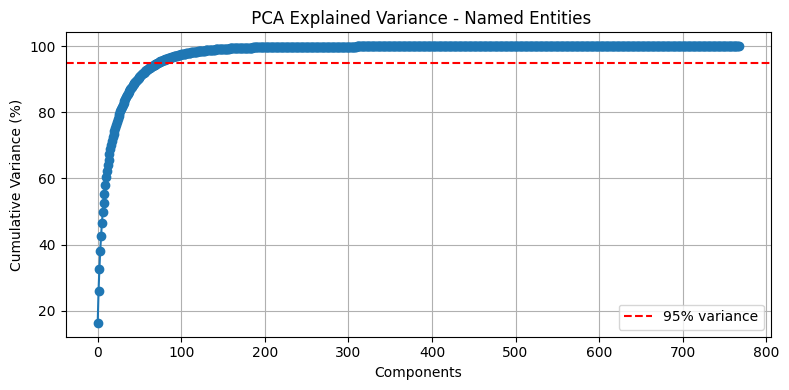

✅ Named Entities: 74 components retain 95% variance


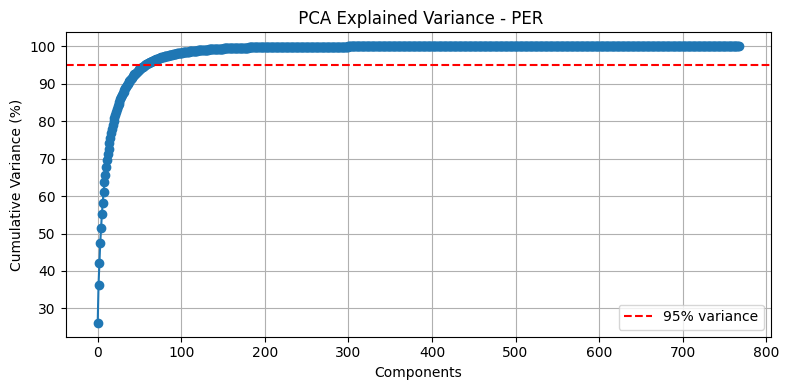

✅ PER: 58 components retain 95% variance


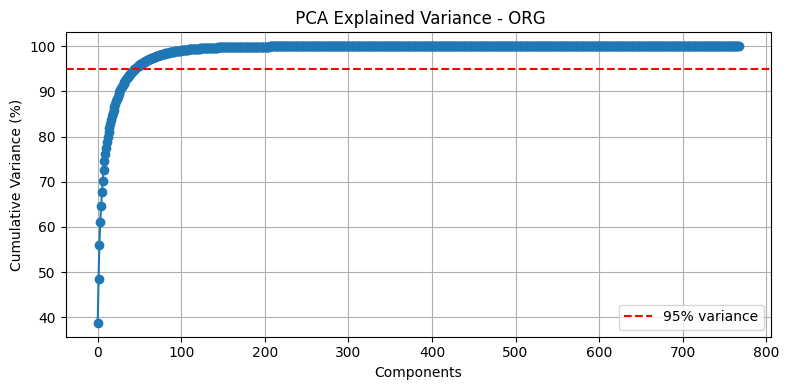

✅ ORG: 46 components retain 95% variance


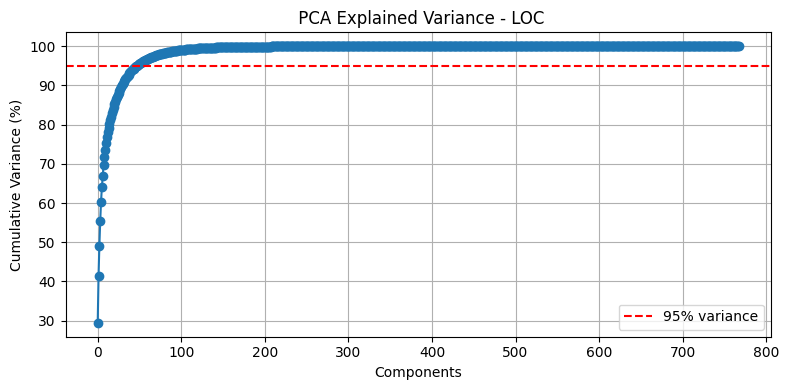

✅ LOC: 48 components retain 95% variance


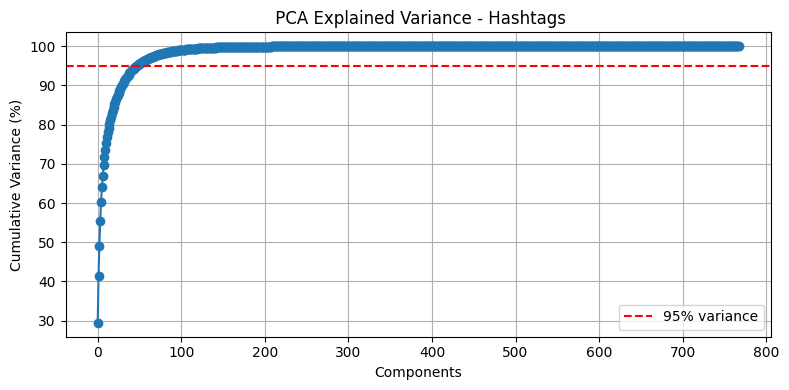

✅ Hashtags: 48 components retain 95% variance


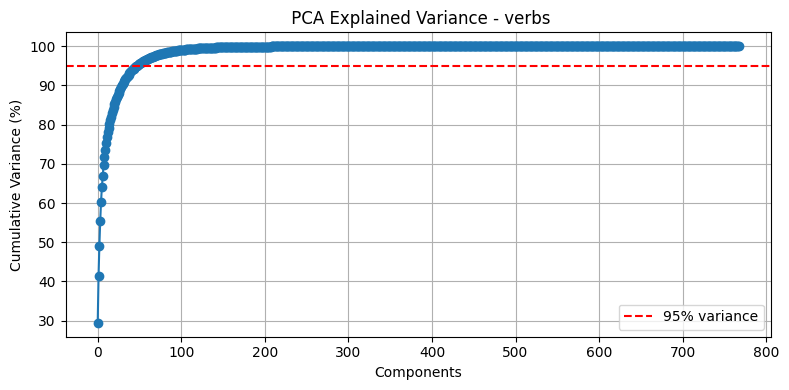

✅ verbs: 48 components retain 95% variance


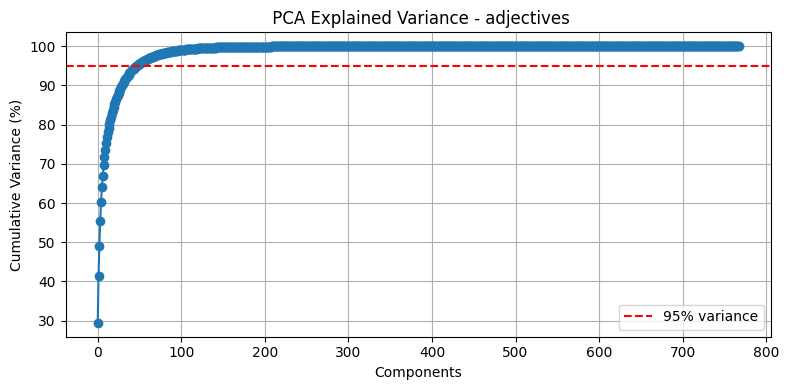

✅ adjectives: 48 components retain 95% variance


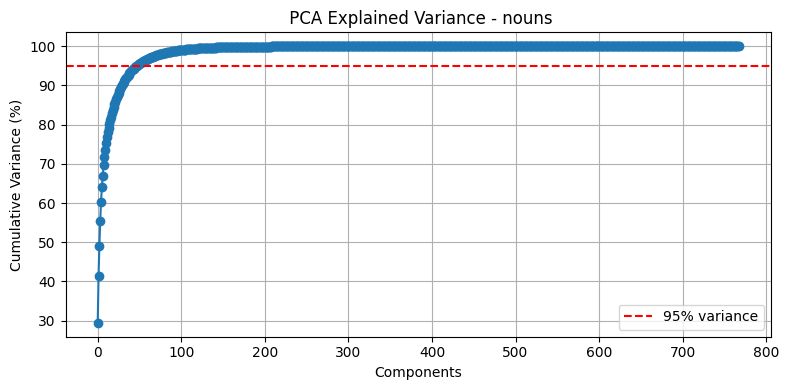

✅ nouns: 48 components retain 95% variance

🧠 PCA-reduced embeddings added to dataframe.


In [160]:
#@title PCA Reduction on Named Entity Embeddings

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
# --- Save to DataFrame ---
named_entities_embedding= df['Named Entities_embedding']
PER_embedding = df['PER_embedding']
ORG_embedding = df['ORG_embedding']
LOC_embedding = df['LOC_embedding']
VERBS_embedding = df['verbs_embedding']
NOUNS_embedding = df['nouns_embedding']
ADJ_embedding = df['adjectives_embedding']

# Convert Series of vectors to arrays
ne_array = np.vstack(named_entities_embedding.values)
per_array = np.vstack(PER_embedding.values)
org_array = np.vstack(ORG_embedding.values)
loc_array = np.vstack(LOC_embedding.values)

verbs_array = np.vstack(VERBS_embedding.values)
adj_array = np.vstack(ADJ_embedding.values)
nouns_array = np.vstack(NOUNS_embedding.values)

def reduce_with_pca(name, X, threshold=0.95):
    pca = PCA()
    pca.fit(X)

    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_variance >= threshold) + 1

    # Plot explained variance
    plt.figure(figsize=(8, 4))
    plt.plot(cumulative_variance * 100, marker='o')
    plt.axhline(y=threshold * 100, color='red', linestyle='--', label=f'{int(threshold * 100)}% variance')
    plt.title(f' PCA Explained Variance - {name}')
    plt.xlabel('Components')
    plt.ylabel('Cumulative Variance (%)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"✅ {name}: {n_components} components retain {int(threshold*100)}% variance")

    # Final reduction
    reduced = PCA(n_components=n_components).fit_transform(X)
    return reduced

# Apply PCA
named_entities_reduced = reduce_with_pca("Named Entities", ne_array)
per_reduced = reduce_with_pca("PER", per_array)
org_reduced = reduce_with_pca("ORG", org_array)
loc_reduced = reduce_with_pca("LOC", loc_array)
hash_reduced = reduce_with_pca("Hashtags", loc_array)

verb_reduced = reduce_with_pca("verbs", loc_array)
adj_reduced = reduce_with_pca("adjectives", loc_array)
nouns_reduced = reduce_with_pca("nouns", loc_array)


# Save to DataFrame
df['NamedEntities_PCA'] = named_entities_reduced.tolist()
df['PER_PCA'] = per_reduced.tolist()
df['ORG_PCA'] = org_reduced.tolist()
df['LOC_PCA'] = loc_reduced.tolist()
df['Hashtags_PCA'] = hash_reduced.tolist()

df['VERBS_PCA'] = nouns_reduced.tolist()
df['ADJ_PCA'] = adj_reduced.tolist()
df['NOUNS_PCA'] = verb_reduced.tolist()


# Confirm
print("\n🧠 PCA-reduced embeddings added to dataframe.")


In [161]:
# @title Save reduced embeddings back to DataFrame
# Convert each PCA column to a NumPy array
named = np.vstack(df['NamedEntities_PCA'].apply(np.array).values)
per   = np.vstack(df['PER_PCA'].apply(np.array).values)
org   = np.vstack(df['ORG_PCA'].apply(np.array).values)
loc   = np.vstack(df['LOC_PCA'].apply(np.array).values)

verbs   = np.vstack(df['VERBS_PCA'].apply(np.array).values)
nouns   = np.vstack(df['NOUNS_PCA'].apply(np.array).values)
adj   = np.vstack(df['ADJ_PCA'].apply(np.array).values)

# Concatenate horizontally
final_embeddings = np.hstack([reduced_embeddings,named])#, per, org, loc

# Store back into df
df['final_embedding'] = list(final_embeddings)

# ✅ Confirm
print("🎯 Final embedding column shape per row:", final_embeddings[0].shape)
print("📦 Final embedding column added to df.")


🎯 Final embedding column shape per row: (228,)
📦 Final embedding column added to df.


### online eval

In [162]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=500,
    time_window_days=3,
    min_cluster_size=3,
    min_samples=3,
    initial_df=tuning_df,
    embedding_column='final_embedding'

)

Running HDBSCAN Sliding Window:   0%|          | 0/25 [00:00<?, ?it/s]

In [163]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df_aug,
    embedding_column='final_embedding'

)


Running HDBSCAN Sliding Window:   0%|          | 0/25 [00:00<?, ?it/s]

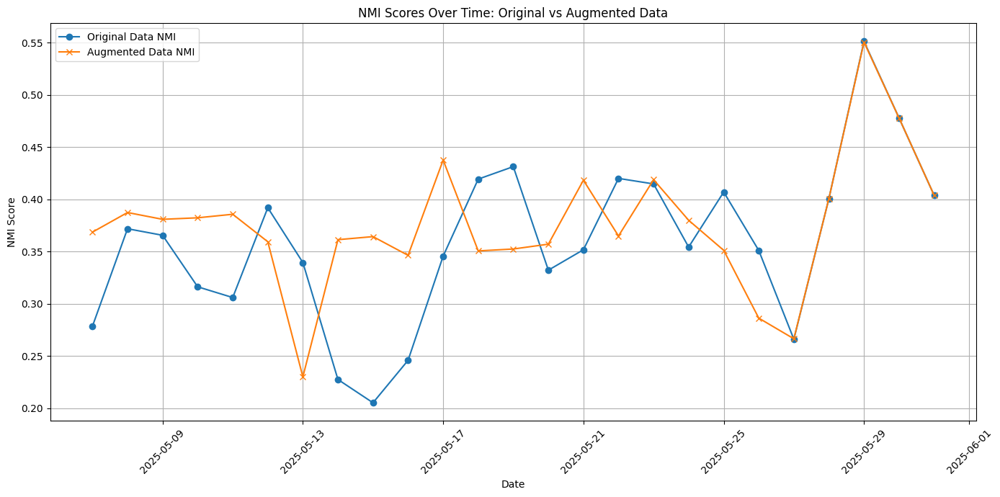

In [164]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


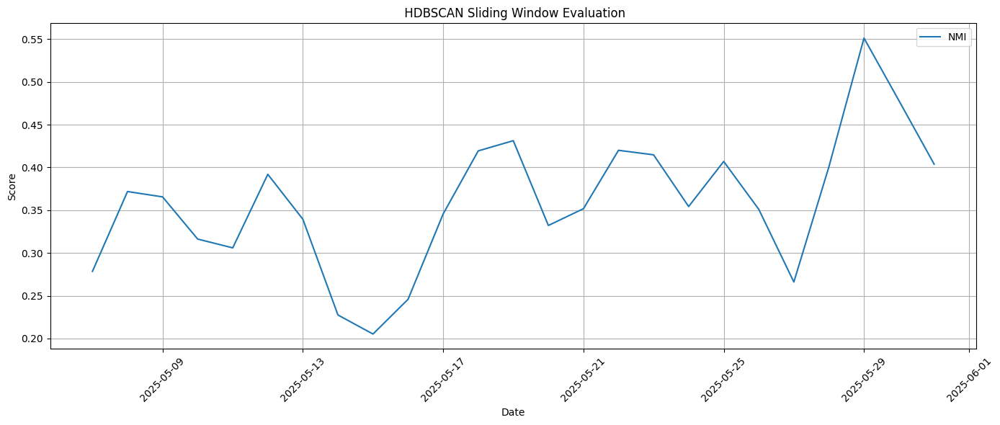

In [165]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title(" HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [166]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_mbert_named")


Results saved to drive/MyDrive/results/hdbscan_mbert_named.csv


In [167]:
#@title Results
models_results = {
    'hdbscan_arabert_splited': sliding_results_original,
    'hdbscan_arabert_splited_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert_splited ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.2785      0.3718      0.3656      0.3163      0.3060      0.3920   
ami       0.2066      0.3050      0.2959      0.2143      0.1822      0.3247   
ari       0.0650      0.0875      0.0658      0.0581      0.0548      0.1215   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.3395      0.2275      0.2053      0.2459  ...      0.4200   
ami       0.2837      0.1878      0.1658      0.2012  ...      0.3346   
ari       0.1133      0.0424      0.0392      0.0548  ...      0.0663   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.4147      0.3543      0.4070      0.3510      0.2661      0.4008   
ami       0.3425      0.2845      0.2977      0.2663      0.1995      0.3456   
ari       0.1184      0.1158      0.0954      0.0788      0.0420      0.1235   

date  2025-05-

In [168]:
#@title 🌀 Interactive t-SNE Plot with Plotly (Hover to Show Tweet)
import plotly.express as px
from sklearn.manifold import TSNE
import numpy as np

def interactive_tsne_plot(daily_blocks, date_key, embedding_column='final_embedding', label_column='event_label'):
    """
    Interactive t-SNE plot using Plotly with hover text as tweet messages.

    Args:
        daily_blocks: dict of daily DataFrames
        date_key: datetime.date
        embedding_column: name of column with embedding vectors
        label_column: name of column with event labels
    """
    block = daily_blocks.get(date_key)
    if block is None or block.empty:
        print(f"❌ No block found for {date_key}")
        return

    # Get embeddings and info
    embeddings = np.vstack(block[embedding_column].apply(np.array).values)
    labels = block[label_column].astype(str).values
    messages = block['Tweet Text'].values  # Update if you named the text column differently

    # Compute t-SNE
    tsne_proj = TSNE(n_components=2, random_state=42, perplexity=30).fit_transform(embeddings)

    # Prepare DataFrame
    tsne_df = pd.DataFrame({
        'x': tsne_proj[:, 0],
        'y': tsne_proj[:, 1],
        'label': labels,
        'message': messages
    })

    # Plot
    fig = px.scatter(tsne_df,
                     x='x', y='y',
                     color='label',
                     hover_data={'message': True, 'x': False, 'y': False},
                     title=f't-SNE Projection with Event Labels for {date_key}',
                     labels={'label': 'Event Label'})

    fig.update_traces(marker=dict(size=8, line=dict(width=0.5, color='DarkSlateGrey')))
    fig.update_layout(legend_title_text='Event Label', width=900, height=700)
    fig.show()

# ✅ Example usage
import datetime
interactive_tsne_plot(daily_blocks, datetime.date(2025, 5, 29))


## HDBSCAN + mBert

### tune

In [124]:
# @title Install  mbert
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("sentence-transformers/LaBSE")



modules.json:   0%|          | 0.00/461 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/804 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/397 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

2_Dense/model.safetensors:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

2_Dense/pytorch_model.bin:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

In [125]:
#@title Embedding the Tweets
# Imports
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from tqdm import tqdm

tweets = df['Tweet Text'].tolist()
embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

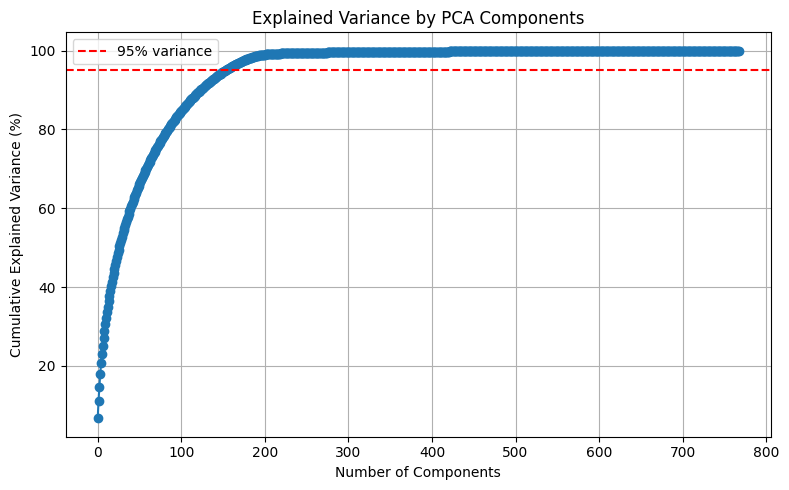


Number of components to retain 95% variance: 154


In [126]:
#@title explainable variance
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [127]:
#@title reduce dim
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 154

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 768)
Reduced shape: (6998, 154)


In [128]:
#@title save tweet embedding
df['mbert_embeddings']=reduced_embeddings.tolist()

### online eval

In [152]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=500,
    time_window_days=3,
    min_cluster_size=3,
    min_samples=3,
    initial_df=tuning_df,
    embedding_column='mbert_embeddings'

)

Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:01<00:00, 12.54it/s]


In [153]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df_aug,
    embedding_column='mbert_embeddings'

)

Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:02<00:00, 11.71it/s]


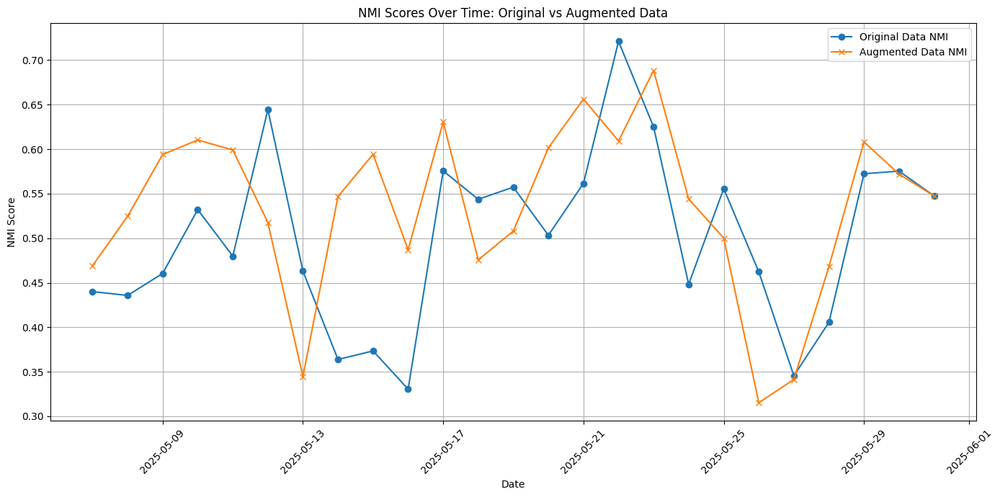

In [154]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


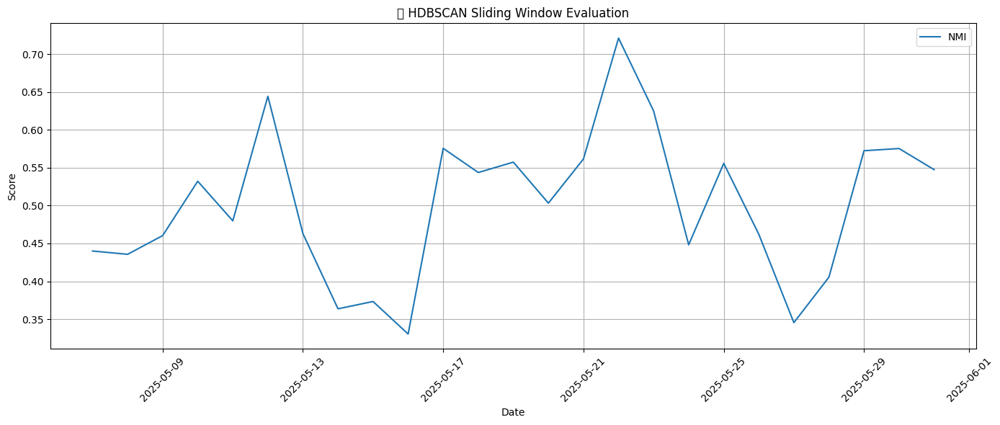

In [155]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title("📊 HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [156]:
#@title 🌀 Interactive t-SNE Plot with Plotly (Hover to Show Tweet)
import plotly.express as px
from sklearn.manifold import TSNE
import numpy as np

def interactive_tsne_plot(daily_blocks, date_key, embedding_column='mbert_embeddings', label_column='event_label'):
    """
    Interactive t-SNE plot using Plotly with hover text as tweet messages.

    Args:
        daily_blocks: dict of daily DataFrames
        date_key: datetime.date
        embedding_column: name of column with embedding vectors
        label_column: name of column with event labels
    """
    block = daily_blocks.get(date_key)
    if block is None or block.empty:
        print(f"❌ No block found for {date_key}")
        return

    # Get embeddings and info
    embeddings = np.vstack(block[embedding_column].apply(np.array).values)
    labels = block[label_column].astype(str).values
    messages = block['Tweet Text'].values  # Update if you named the text column differently

    # Compute t-SNE
    tsne_proj = TSNE(n_components=2, random_state=42, perplexity=30).fit_transform(embeddings)

    # Prepare DataFrame
    tsne_df = pd.DataFrame({
        'x': tsne_proj[:, 0],
        'y': tsne_proj[:, 1],
        'label': labels,
        'message': messages
    })

    # Plot
    fig = px.scatter(tsne_df,
                     x='x', y='y',
                     color='label',
                     hover_data={'message': True, 'x': False, 'y': False},
                     title=f't-SNE Projection with Event Labels for {date_key}',
                     labels={'label': 'Event Label'})

    fig.update_traces(marker=dict(size=8, line=dict(width=0.5, color='DarkSlateGrey')))
    fig.update_layout(legend_title_text='Event Label', width=900, height=700)
    fig.show()

# ✅ Example usage
import datetime
interactive_tsne_plot(daily_blocks, datetime.date(2025, 5, 29))


In [157]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_mbert")


Results saved to drive/MyDrive/results/hdbscan_mbert.csv


In [158]:
#@title Results
models_results = {
    'hdbscan_arabert': sliding_results_original,
    'hdbscan_arabert_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.4400      0.4357      0.4604      0.5321      0.4799      0.6443   
ami       0.3866      0.3702      0.4038      0.4710      0.4056      0.6075   
ari       0.1590      0.1060      0.1377      0.2326      0.1667      0.3672   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.4630      0.3638      0.3734      0.3305  ...      0.7211   
ami       0.4114      0.3249      0.3457      0.3021  ...      0.6968   
ari       0.1832      0.1499      0.1656      0.1071  ...      0.5177   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.6250      0.4483      0.5557      0.4622      0.3455      0.4055   
ami       0.5841      0.3806      0.4856      0.3957      0.2931      0.3491   
ari       0.3268      0.1540      0.1509      0.1474      0.0686      0.0951   

date  2025-05-29  2025

# AraBert


## HDBSCAN + AraBert + Named Entities Splited + Verbs

### tune

In [ ]:
# @title Install  Arabert
# from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("aubmindlab/bert-base-arabertv2")

# Create and fit BERTopic model
# topic_model = BERTopic(embedding_model=embedding_model, language="arabic")



config.json:   0%|          | 0.00/384 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/543M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [ ]:
#@title Embedding the Tweets
# Imports
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from tqdm import tqdm

tweets = df['Tweet Text'].tolist()
embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

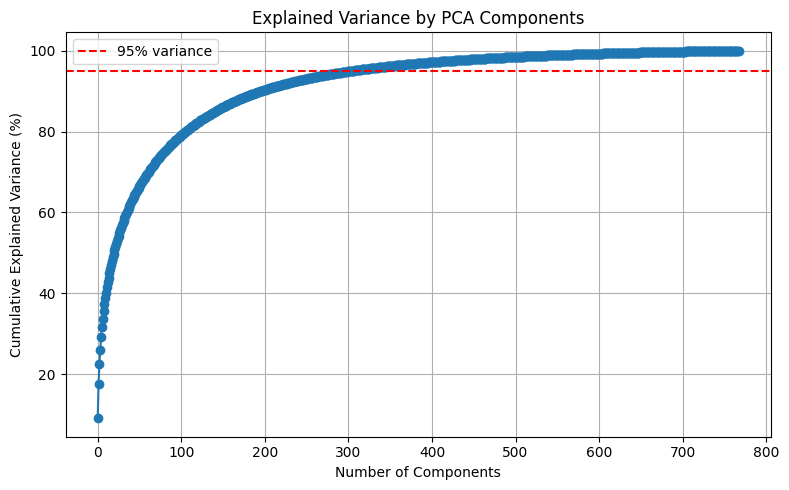


Number of components to retain 95% variance: 305


In [ ]:
#@title Explainable variance
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [ ]:
#@title reduce dim
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 305

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 768)
Reduced shape: (6998, 305)


In [ ]:
#@title save tweet embedding
df['arabert_embeddings']=reduced_embeddings.tolist()

In [ ]:
#@title Embedding of Named Entities
from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
from collections import defaultdict

# --- Ensure the columns contain lists ---
columns_to_eval = ['Named Entities', 'PER', 'ORG', 'LOC', 'verbs', 'nouns', 'adjectives']
for col in columns_to_eval:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

def batched_avg_embeddings(token_lists, column_name):
    """
    Efficiently embed a list of token lists using AraBERT and average each.
    """
    print(f"🔄 Embedding column: {column_name}")
    all_tokens = []
    token_indices = []  # Track which tokens belong to which row

    for i, tokens in enumerate(token_lists):
        filtered = [t for t in tokens if t.strip()]
        token_indices.extend([i] * len(filtered))
        all_tokens.extend(filtered)

    if not all_tokens:
        return [np.zeros(embedding_model.get_sentence_embedding_dimension())] * len(token_lists)

    # Embed all tokens in batch
    all_embeddings = embedding_model.encode(all_tokens, batch_size=32, show_progress_bar=True)

    # Group by row index
    grouped = defaultdict(list)
    for idx, emb in zip(token_indices, all_embeddings):
        grouped[idx].append(emb)

    # Average per row
    avg_embeddings = []
    for i in range(len(token_lists)):
        vecs = grouped.get(i)
        if vecs:
            avg_embeddings.append(np.mean(vecs, axis=0))
        else:
            avg_embeddings.append(np.zeros(embedding_model.get_sentence_embedding_dimension()))
    return avg_embeddings

# --- Run on all relevant columns ---
for col in tqdm(columns_to_eval, desc="Batch Embedding Columns"):
    df[col + '_embedding'] = batched_avg_embeddings(df[col], col)

print("✅ Done with fast AraBERT token embeddings.")


Batch Embedding Columns:   0%|          | 0/7 [00:00<?, ?it/s]

🔄 Embedding column: Named Entities


Batches:   0%|          | 0/513 [00:00<?, ?it/s]

🔄 Embedding column: PER


Batches:   0%|          | 0/145 [00:00<?, ?it/s]

🔄 Embedding column: ORG


Batches:   0%|          | 0/63 [00:00<?, ?it/s]

🔄 Embedding column: LOC


Batches:   0%|          | 0/306 [00:00<?, ?it/s]

🔄 Embedding column: verbs


Batches:   0%|          | 0/525 [00:00<?, ?it/s]

🔄 Embedding column: nouns


Batches:   0%|          | 0/2558 [00:00<?, ?it/s]

🔄 Embedding column: adjectives


Batches:   0%|          | 0/709 [00:00<?, ?it/s]

✅ Done with fast AraBERT token embeddings.


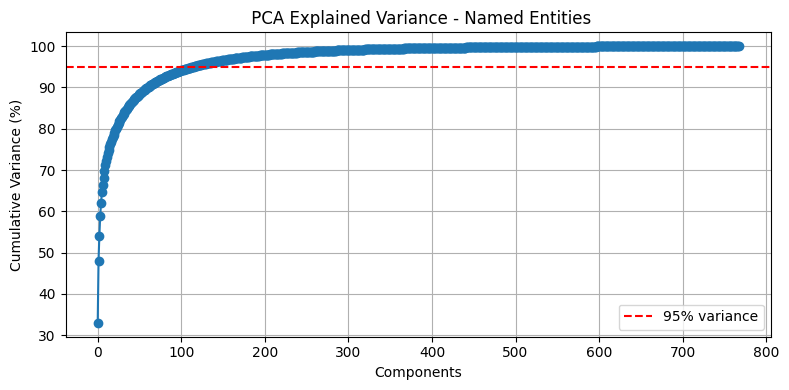

✅ Named Entities: 115 components retain 95% variance


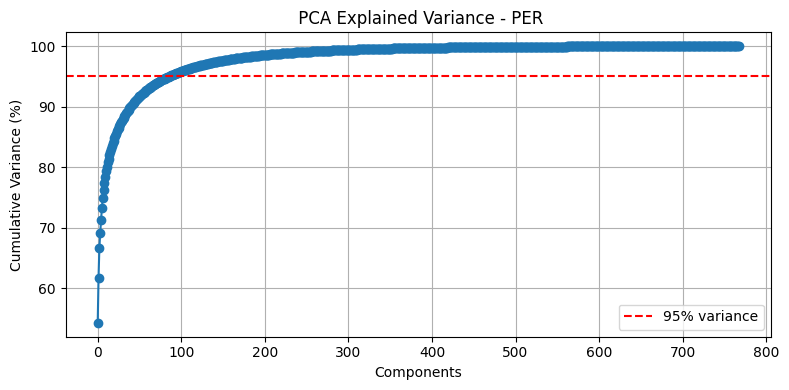

✅ PER: 87 components retain 95% variance


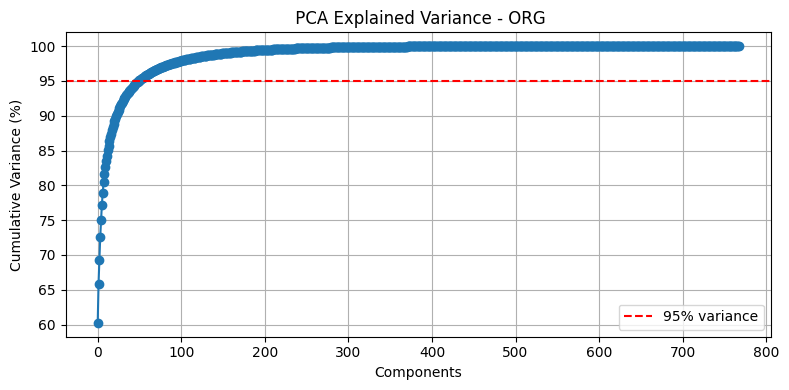

✅ ORG: 50 components retain 95% variance


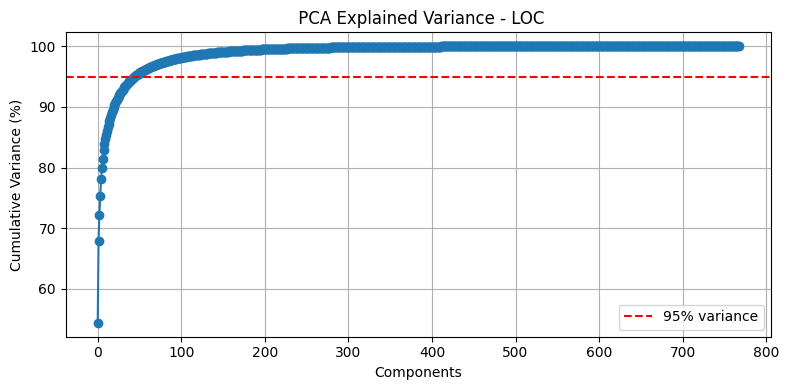

✅ LOC: 46 components retain 95% variance


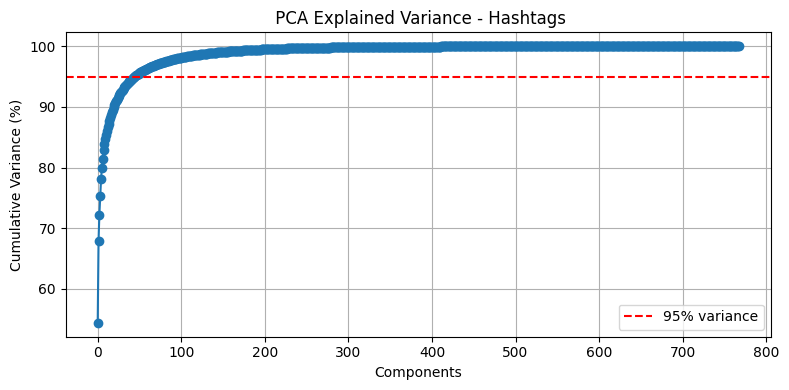

✅ Hashtags: 46 components retain 95% variance


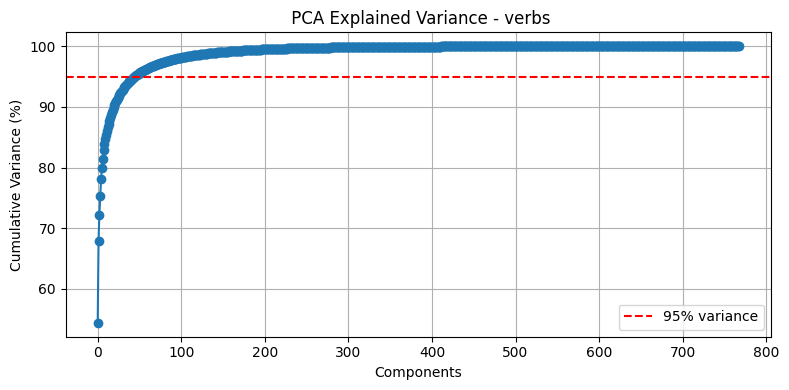

✅ verbs: 46 components retain 95% variance


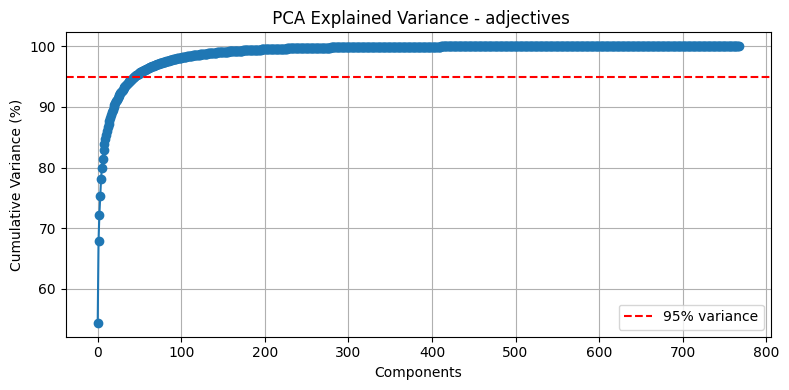

✅ adjectives: 46 components retain 95% variance


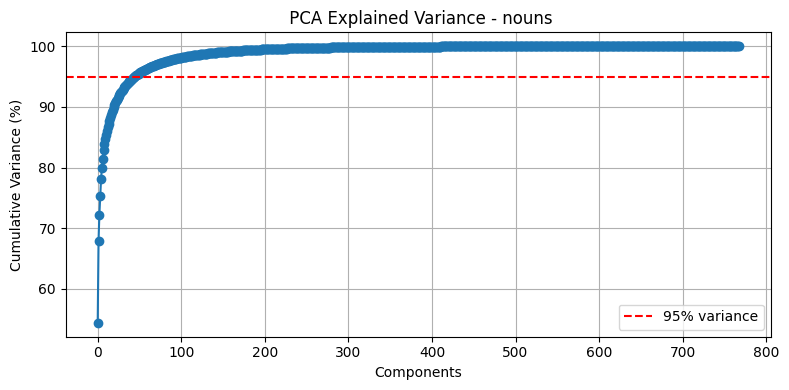

✅ nouns: 46 components retain 95% variance

🧠 PCA-reduced embeddings added to dataframe.


In [ ]:
#@title PCA Reduction on Named Entity Embeddings

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
# --- Save to DataFrame ---
named_entities_embedding= df['Named Entities_embedding']
PER_embedding = df['PER_embedding']
ORG_embedding = df['ORG_embedding']
LOC_embedding = df['LOC_embedding']
VERBS_embedding = df['verbs_embedding']
NOUNS_embedding = df['nouns_embedding']
ADJ_embedding = df['adjectives_embedding']

# Convert Series of vectors to arrays
ne_array = np.vstack(named_entities_embedding.values)
per_array = np.vstack(PER_embedding.values)
org_array = np.vstack(ORG_embedding.values)
loc_array = np.vstack(LOC_embedding.values)

verbs_array = np.vstack(VERBS_embedding.values)
adj_array = np.vstack(ADJ_embedding.values)
nouns_array = np.vstack(NOUNS_embedding.values)

def reduce_with_pca(name, X, threshold=0.95):
    pca = PCA()
    pca.fit(X)

    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_variance >= threshold) + 1

    # Plot explained variance
    plt.figure(figsize=(8, 4))
    plt.plot(cumulative_variance * 100, marker='o')
    plt.axhline(y=threshold * 100, color='red', linestyle='--', label=f'{int(threshold * 100)}% variance')
    plt.title(f' PCA Explained Variance - {name}')
    plt.xlabel('Components')
    plt.ylabel('Cumulative Variance (%)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"✅ {name}: {n_components} components retain {int(threshold*100)}% variance")

    # Final reduction
    reduced = PCA(n_components=n_components).fit_transform(X)
    return reduced

# Apply PCA
named_entities_reduced = reduce_with_pca("Named Entities", ne_array)
per_reduced = reduce_with_pca("PER", per_array)
org_reduced = reduce_with_pca("ORG", org_array)
loc_reduced = reduce_with_pca("LOC", loc_array)
hash_reduced = reduce_with_pca("Hashtags", loc_array)

verb_reduced = reduce_with_pca("verbs", loc_array)
adj_reduced = reduce_with_pca("adjectives", loc_array)
nouns_reduced = reduce_with_pca("nouns", loc_array)


# Save to DataFrame
df['NamedEntities_PCA'] = named_entities_reduced.tolist()
df['PER_PCA'] = per_reduced.tolist()
df['ORG_PCA'] = org_reduced.tolist()
df['LOC_PCA'] = loc_reduced.tolist()
df['Hashtags_PCA'] = hash_reduced.tolist()

df['VERBS_PCA'] = nouns_reduced.tolist()
df['ADJ_PCA'] = adj_reduced.tolist()
df['NOUNS_PCA'] = verb_reduced.tolist()


# Confirm
print("\n🧠 PCA-reduced embeddings added to dataframe.")


In [105]:
# @title Save reduced embeddings back to DataFrame
# Convert each PCA column to a NumPy array
named = np.vstack(df['NamedEntities_PCA'].apply(np.array).values)
per   = np.vstack(df['PER_PCA'].apply(np.array).values)
org   = np.vstack(df['ORG_PCA'].apply(np.array).values)
loc   = np.vstack(df['LOC_PCA'].apply(np.array).values)

verbs   = np.vstack(df['VERBS_PCA'].apply(np.array).values)
nouns   = np.vstack(df['NOUNS_PCA'].apply(np.array).values)
adj   = np.vstack(df['ADJ_PCA'].apply(np.array).values)

# Concatenate horizontally
final_embeddings = np.hstack([reduced_embeddings,nouns,per, org,loc])#, per, org, loc

# Store back into df
df['final_embedding'] = list(final_embeddings)

# ✅ Confirm
print("🎯 Final embedding column shape per row:", final_embeddings[0].shape)
print("📦 Final embedding column added to df.")


🎯 Final embedding column shape per row: (534,)
📦 Final embedding column added to df.


### online eval

In [115]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=500,
    time_window_days=3,
    min_cluster_size=3,
    min_samples=3,
    initial_df=tuning_df,
    embedding_column='final_embedding'

)

Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:02<00:00, 12.15it/s]


In [116]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df_aug,
    embedding_column='final_embedding'

)


Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:02<00:00, 12.12it/s]


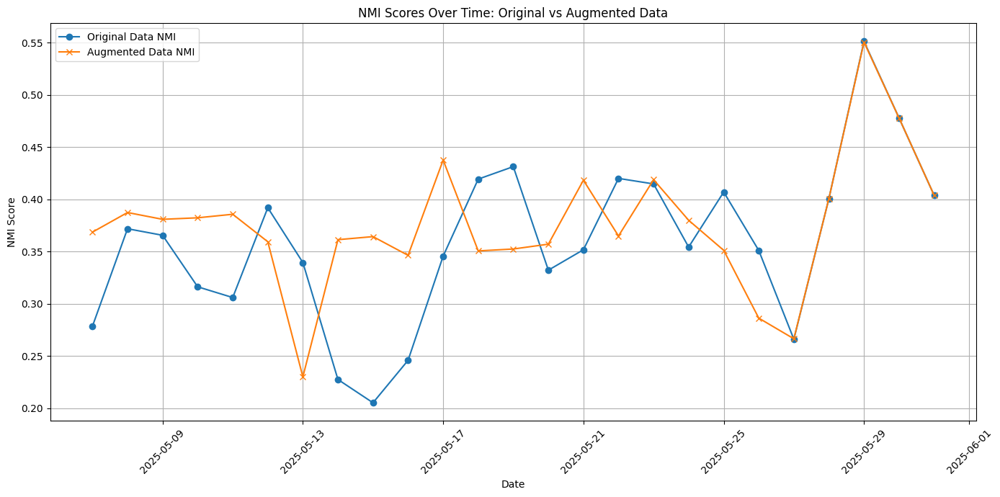

In [117]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


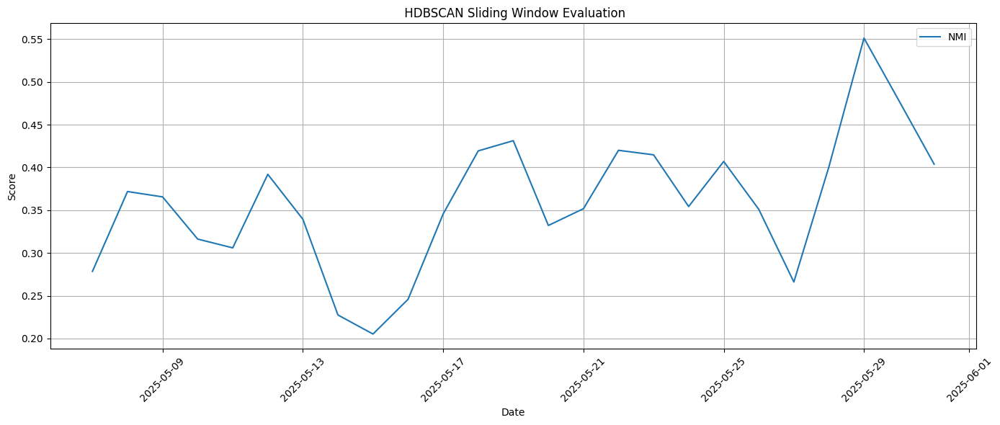

In [118]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title(" HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [119]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_arabert_v")


Results saved to drive/MyDrive/results/hdbscan_arabert_v.csv


In [120]:
#@title Results
models_results = {
    'hdbscan_arabert_splited': sliding_results_original,
    'hdbscan_arabert_splited_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert_splited ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.2785      0.3718      0.3656      0.3163      0.3060      0.3920   
ami       0.2066      0.3050      0.2959      0.2143      0.1822      0.3247   
ari       0.0650      0.0875      0.0658      0.0581      0.0548      0.1215   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.3395      0.2275      0.2053      0.2459  ...      0.4200   
ami       0.2837      0.1878      0.1658      0.2012  ...      0.3346   
ari       0.1133      0.0424      0.0392      0.0548  ...      0.0663   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.4147      0.3543      0.4070      0.3510      0.2661      0.4008   
ami       0.3425      0.2845      0.2977      0.2663      0.1995      0.3456   
ari       0.1184      0.1158      0.0954      0.0788      0.0420      0.1235   

date  2025-05-

In [121]:
#@title 🌀 Interactive t-SNE Plot with Plotly (Hover to Show Tweet)
import plotly.express as px
from sklearn.manifold import TSNE
import numpy as np

def interactive_tsne_plot(daily_blocks, date_key, embedding_column='final_embedding', label_column='event_label'):
    """
    Interactive t-SNE plot using Plotly with hover text as tweet messages.

    Args:
        daily_blocks: dict of daily DataFrames
        date_key: datetime.date
        embedding_column: name of column with embedding vectors
        label_column: name of column with event labels
    """
    block = daily_blocks.get(date_key)
    if block is None or block.empty:
        print(f"❌ No block found for {date_key}")
        return

    # Get embeddings and info
    embeddings = np.vstack(block[embedding_column].apply(np.array).values)
    labels = block[label_column].astype(str).values
    messages = block['Tweet Text'].values  # Update if you named the text column differently

    # Compute t-SNE
    tsne_proj = TSNE(n_components=2, random_state=42, perplexity=30).fit_transform(embeddings)

    # Prepare DataFrame
    tsne_df = pd.DataFrame({
        'x': tsne_proj[:, 0],
        'y': tsne_proj[:, 1],
        'label': labels,
        'message': messages
    })

    # Plot
    fig = px.scatter(tsne_df,
                     x='x', y='y',
                     color='label',
                     hover_data={'message': True, 'x': False, 'y': False},
                     title=f't-SNE Projection with Event Labels for {date_key}',
                     labels={'label': 'Event Label'})

    fig.update_traces(marker=dict(size=8, line=dict(width=0.5, color='DarkSlateGrey')))
    fig.update_layout(legend_title_text='Event Label', width=900, height=700)
    fig.show()

# ✅ Example usage
import datetime
interactive_tsne_plot(daily_blocks, datetime.date(2025, 5, 29))


## HDBSCAN + AraBert + Named Entities Splited

### tune

In [ ]:
# @title Install  Arabert
# from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("aubmindlab/bert-base-arabertv2")

# Create and fit BERTopic model
# topic_model = BERTopic(embedding_model=embedding_model, language="arabic")



config.json:   0%|          | 0.00/384 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/543M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [ ]:
#@title Embedding the Tweets
# Imports
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from tqdm import tqdm

tweets = df['Tweet Text'].tolist()
embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

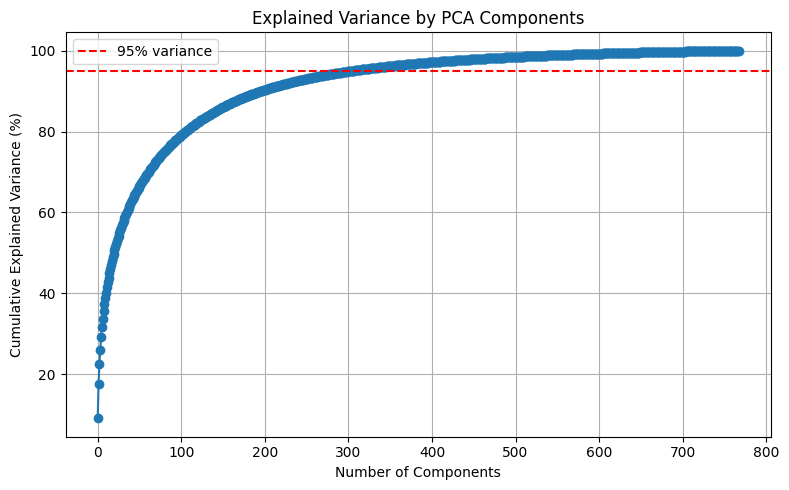


Number of components to retain 95% variance: 305


In [ ]:
#@title Explainable variance
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [ ]:
#@title reduce dim
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 305

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 768)
Reduced shape: (6998, 305)


In [ ]:
#@title save tweet embedding
df['arabert_embeddings']=reduced_embeddings.tolist()

In [ ]:
#@title Embedding of Named Entities
from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
from collections import defaultdict

# --- Ensure the columns contain lists ---
columns_to_eval = ['Named Entities', 'PER', 'ORG', 'LOC', 'verbs', 'nouns', 'adjectives']
for col in columns_to_eval:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

def batched_avg_embeddings(token_lists, column_name):
    """
    Efficiently embed a list of token lists using AraBERT and average each.
    """
    print(f"🔄 Embedding column: {column_name}")
    all_tokens = []
    token_indices = []  # Track which tokens belong to which row

    for i, tokens in enumerate(token_lists):
        filtered = [t for t in tokens if t.strip()]
        token_indices.extend([i] * len(filtered))
        all_tokens.extend(filtered)

    if not all_tokens:
        return [np.zeros(embedding_model.get_sentence_embedding_dimension())] * len(token_lists)

    # Embed all tokens in batch
    all_embeddings = embedding_model.encode(all_tokens, batch_size=32, show_progress_bar=True)

    # Group by row index
    grouped = defaultdict(list)
    for idx, emb in zip(token_indices, all_embeddings):
        grouped[idx].append(emb)

    # Average per row
    avg_embeddings = []
    for i in range(len(token_lists)):
        vecs = grouped.get(i)
        if vecs:
            avg_embeddings.append(np.mean(vecs, axis=0))
        else:
            avg_embeddings.append(np.zeros(embedding_model.get_sentence_embedding_dimension()))
    return avg_embeddings

# --- Run on all relevant columns ---
for col in tqdm(columns_to_eval, desc="Batch Embedding Columns"):
    df[col + '_embedding'] = batched_avg_embeddings(df[col], col)

print("✅ Done with fast AraBERT token embeddings.")


Batch Embedding Columns:   0%|          | 0/7 [00:00<?, ?it/s]

🔄 Embedding column: Named Entities


Batches:   0%|          | 0/513 [00:00<?, ?it/s]

🔄 Embedding column: PER


Batches:   0%|          | 0/145 [00:00<?, ?it/s]

🔄 Embedding column: ORG


Batches:   0%|          | 0/63 [00:00<?, ?it/s]

🔄 Embedding column: LOC


Batches:   0%|          | 0/306 [00:00<?, ?it/s]

🔄 Embedding column: verbs


Batches:   0%|          | 0/525 [00:00<?, ?it/s]

🔄 Embedding column: nouns


Batches:   0%|          | 0/2558 [00:00<?, ?it/s]

🔄 Embedding column: adjectives


Batches:   0%|          | 0/709 [00:00<?, ?it/s]

✅ Done with fast AraBERT token embeddings.


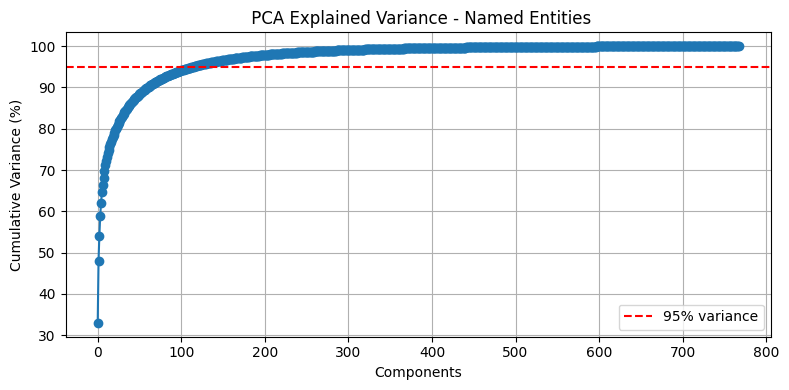

✅ Named Entities: 115 components retain 95% variance


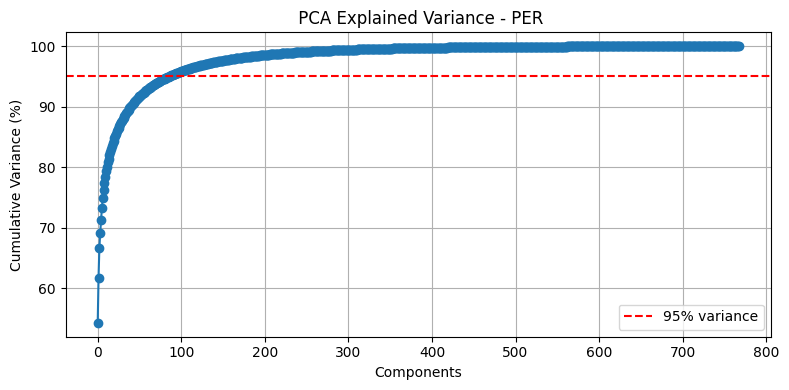

✅ PER: 87 components retain 95% variance


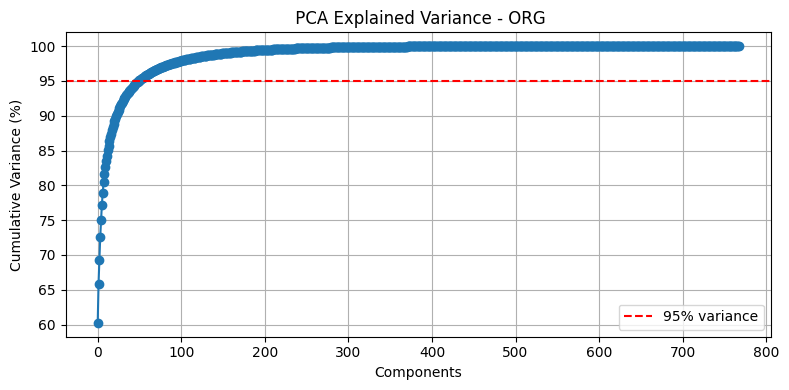

✅ ORG: 50 components retain 95% variance


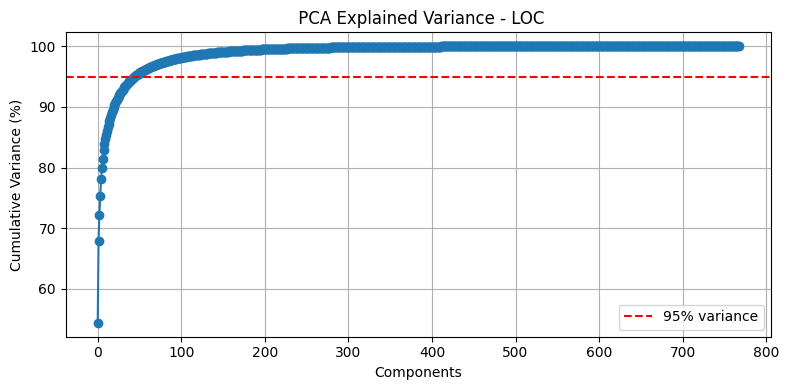

✅ LOC: 46 components retain 95% variance


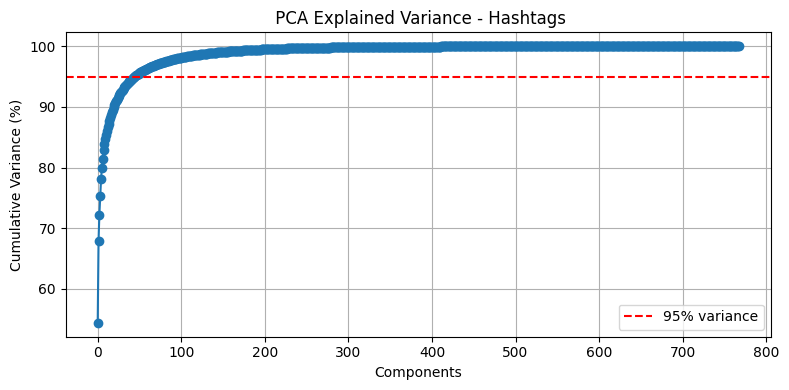

✅ Hashtags: 46 components retain 95% variance


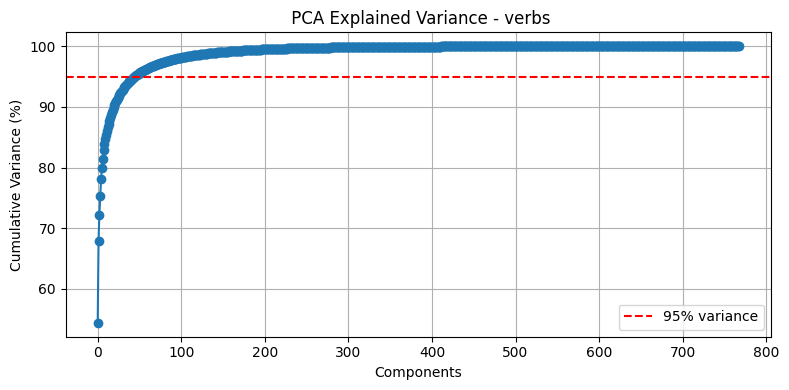

✅ verbs: 46 components retain 95% variance


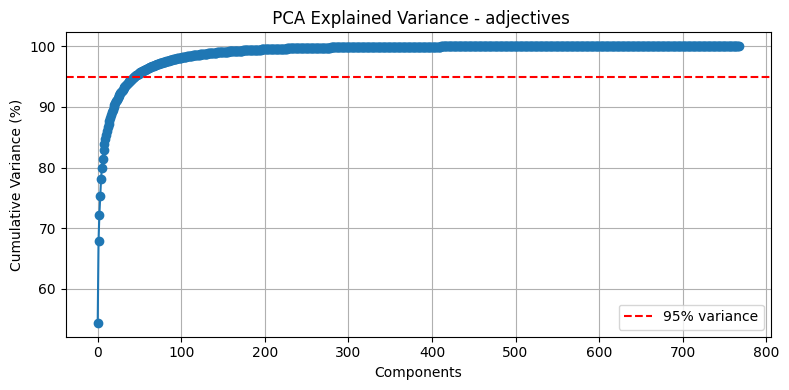

✅ adjectives: 46 components retain 95% variance


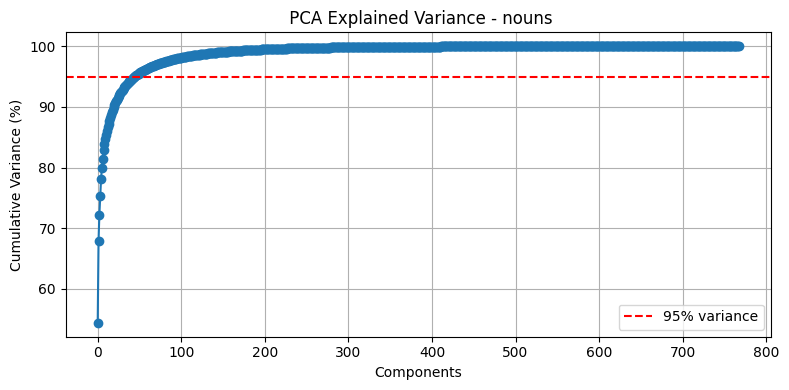

✅ nouns: 46 components retain 95% variance

🧠 PCA-reduced embeddings added to dataframe.


In [ ]:
#@title PCA Reduction on Named Entity Embeddings

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
# --- Save to DataFrame ---
named_entities_embedding= df['Named Entities_embedding']
PER_embedding = df['PER_embedding']
ORG_embedding = df['ORG_embedding']
LOC_embedding = df['LOC_embedding']
VERBS_embedding = df['verbs_embedding']
NOUNS_embedding = df['nouns_embedding']
ADJ_embedding = df['adjectives_embedding']

# Convert Series of vectors to arrays
ne_array = np.vstack(named_entities_embedding.values)
per_array = np.vstack(PER_embedding.values)
org_array = np.vstack(ORG_embedding.values)
loc_array = np.vstack(LOC_embedding.values)

verbs_array = np.vstack(VERBS_embedding.values)
adj_array = np.vstack(ADJ_embedding.values)
nouns_array = np.vstack(NOUNS_embedding.values)

def reduce_with_pca(name, X, threshold=0.95):
    pca = PCA()
    pca.fit(X)

    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_variance >= threshold) + 1

    # Plot explained variance
    plt.figure(figsize=(8, 4))
    plt.plot(cumulative_variance * 100, marker='o')
    plt.axhline(y=threshold * 100, color='red', linestyle='--', label=f'{int(threshold * 100)}% variance')
    plt.title(f' PCA Explained Variance - {name}')
    plt.xlabel('Components')
    plt.ylabel('Cumulative Variance (%)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"✅ {name}: {n_components} components retain {int(threshold*100)}% variance")

    # Final reduction
    reduced = PCA(n_components=n_components).fit_transform(X)
    return reduced

# Apply PCA
named_entities_reduced = reduce_with_pca("Named Entities", ne_array)
per_reduced = reduce_with_pca("PER", per_array)
org_reduced = reduce_with_pca("ORG", org_array)
loc_reduced = reduce_with_pca("LOC", loc_array)
hash_reduced = reduce_with_pca("Hashtags", loc_array)

verb_reduced = reduce_with_pca("verbs", loc_array)
adj_reduced = reduce_with_pca("adjectives", loc_array)
nouns_reduced = reduce_with_pca("nouns", loc_array)


# Save to DataFrame
df['NamedEntities_PCA'] = named_entities_reduced.tolist()
df['PER_PCA'] = per_reduced.tolist()
df['ORG_PCA'] = org_reduced.tolist()
df['LOC_PCA'] = loc_reduced.tolist()
df['Hashtags_PCA'] = hash_reduced.tolist()

df['VERBS_PCA'] = nouns_reduced.tolist()
df['ADJ_PCA'] = adj_reduced.tolist()
df['NOUNS_PCA'] = verb_reduced.tolist()


# Confirm
print("\n🧠 PCA-reduced embeddings added to dataframe.")


In [52]:
# @title Save reduced embeddings back to DataFrame
# Convert each PCA column to a NumPy array
named = np.vstack(df['NamedEntities_PCA'].apply(np.array).values)
per   = np.vstack(df['PER_PCA'].apply(np.array).values)
org   = np.vstack(df['ORG_PCA'].apply(np.array).values)
loc   = np.vstack(df['LOC_PCA'].apply(np.array).values)

verbs   = np.vstack(df['VERBS_PCA'].apply(np.array).values)
nouns   = np.vstack(df['NOUNS_PCA'].apply(np.array).values)
adj   = np.vstack(df['ADJ_PCA'].apply(np.array).values)

# Concatenate horizontally
final_embeddings = np.hstack([reduced_embeddings,per, org, loc])#, per, org, loc

# Store back into df
df['final_embedding'] = list(final_embeddings)

# ✅ Confirm
print("🎯 Final embedding column shape per row:", final_embeddings[0].shape)
print("📦 Final embedding column added to df.")


🎯 Final embedding column shape per row: (488,)
📦 Final embedding column added to df.


### online eval

In [62]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=500,
    time_window_days=3,
    min_cluster_size=3,
    min_samples=3,
    initial_df=tuning_df,
    embedding_column='final_embedding'

)

Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:01<00:00, 17.69it/s]


In [63]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df_aug,
    embedding_column='final_embedding'

)


Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:01<00:00, 19.92it/s]


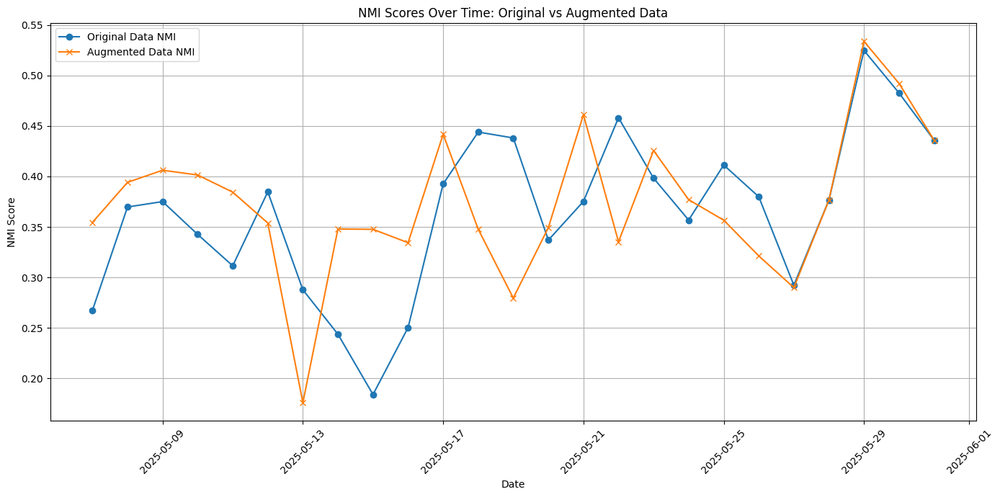

In [64]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


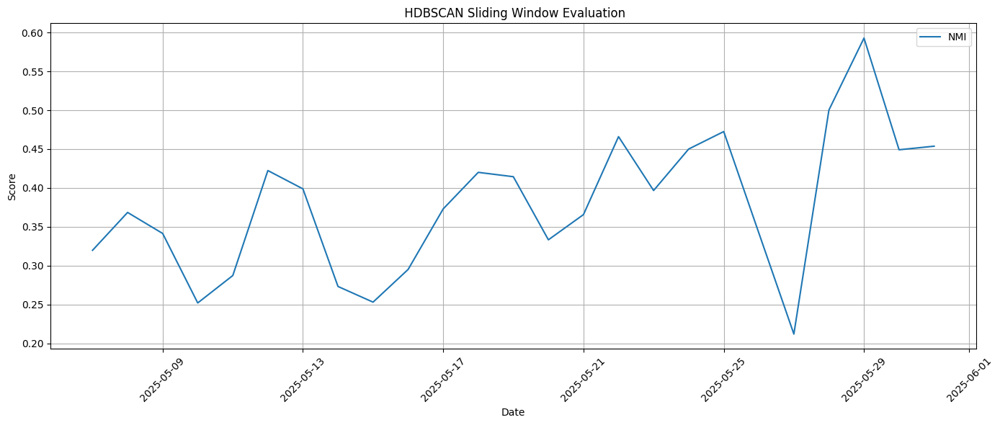

In [ ]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title(" HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [65]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_arabert_splited")


Results saved to drive/MyDrive/results/hdbscan_arabert_splited.csv


In [66]:
#@title Results
models_results = {
    'hdbscan_arabert_splited': sliding_results_original,
    'hdbscan_arabert_splited_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert_splited ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.2674      0.3697      0.3751      0.3426      0.3115      0.3848   
ami       0.2015      0.2964      0.3041      0.2329      0.1824      0.3106   
ari       0.0363      0.0941      0.0676      0.0513      0.0092      0.1055   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.2877      0.2437      0.1840      0.2503  ...      0.4581   
ami       0.2344      0.2039      0.1393      0.2143  ...      0.3774   
ari       0.0821      0.0893      0.0276      0.0918  ...      0.1139   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.3983      0.3568      0.4113      0.3799      0.2923      0.3766   
ami       0.3362      0.2815      0.3051      0.3084      0.2356      0.3190   
ari       0.1312      0.0989      0.0883      0.1048      0.0902      0.1073   

date  2025-05-

In [67]:
#@title 🌀 Interactive t-SNE Plot with Plotly (Hover to Show Tweet)
import plotly.express as px
from sklearn.manifold import TSNE
import numpy as np

def interactive_tsne_plot(daily_blocks, date_key, embedding_column='final_embedding', label_column='event_label'):
    """
    Interactive t-SNE plot using Plotly with hover text as tweet messages.

    Args:
        daily_blocks: dict of daily DataFrames
        date_key: datetime.date
        embedding_column: name of column with embedding vectors
        label_column: name of column with event labels
    """
    block = daily_blocks.get(date_key)
    if block is None or block.empty:
        print(f"❌ No block found for {date_key}")
        return

    # Get embeddings and info
    embeddings = np.vstack(block[embedding_column].apply(np.array).values)
    labels = block[label_column].astype(str).values
    messages = block['Tweet Text'].values  # Update if you named the text column differently

    # Compute t-SNE
    tsne_proj = TSNE(n_components=2, random_state=42, perplexity=30).fit_transform(embeddings)

    # Prepare DataFrame
    tsne_df = pd.DataFrame({
        'x': tsne_proj[:, 0],
        'y': tsne_proj[:, 1],
        'label': labels,
        'message': messages
    })

    # Plot
    fig = px.scatter(tsne_df,
                     x='x', y='y',
                     color='label',
                     hover_data={'message': True, 'x': False, 'y': False},
                     title=f't-SNE Projection with Event Labels for {date_key}',
                     labels={'label': 'Event Label'})

    fig.update_traces(marker=dict(size=8, line=dict(width=0.5, color='DarkSlateGrey')))
    fig.update_layout(legend_title_text='Event Label', width=900, height=700)
    fig.show()

# ✅ Example usage
import datetime
interactive_tsne_plot(daily_blocks, datetime.date(2025, 5, 29))


## HDBSCAN + AraBert + Named Entities

### tune

In [ ]:
# @title Install  Arabert
# from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("aubmindlab/bert-base-arabertv2")

# Create and fit BERTopic model
# topic_model = BERTopic(embedding_model=embedding_model, language="arabic")



config.json:   0%|          | 0.00/384 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/543M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [24]:
#@title Embedding the Tweets
# Imports
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from tqdm import tqdm

tweets = df['Tweet Text'].tolist()
embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

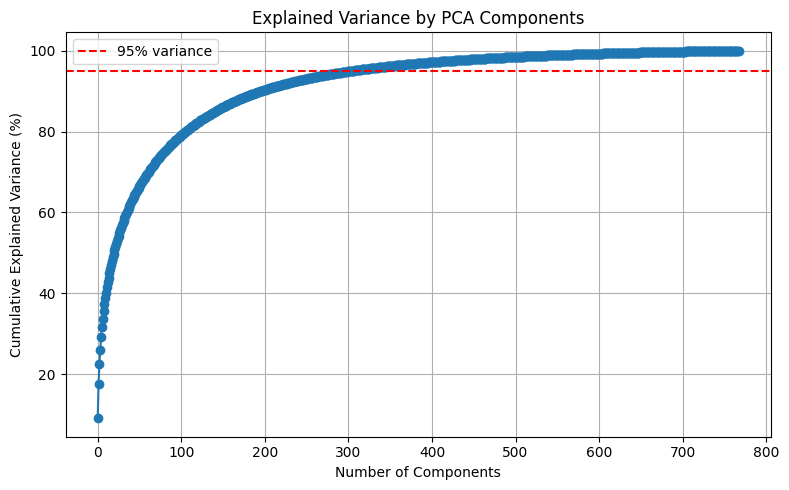


Number of components to retain 95% variance: 305


In [25]:
#@title Explainable variance
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [26]:
#@title reduce dim
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 305

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 768)
Reduced shape: (6998, 305)


In [27]:
#@title save tweet embedding
df['arabert_embeddings']=reduced_embeddings.tolist()

In [28]:
#@title Embedding of Named Entities
from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
from collections import defaultdict

# --- Ensure the columns contain lists ---
columns_to_eval = ['Named Entities', 'PER', 'ORG', 'LOC', 'verbs', 'nouns', 'adjectives']
for col in columns_to_eval:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

def batched_avg_embeddings(token_lists, column_name):
    """
    Efficiently embed a list of token lists using AraBERT and average each.
    """
    print(f"🔄 Embedding column: {column_name}")
    all_tokens = []
    token_indices = []  # Track which tokens belong to which row

    for i, tokens in enumerate(token_lists):
        filtered = [t for t in tokens if t.strip()]
        token_indices.extend([i] * len(filtered))
        all_tokens.extend(filtered)

    if not all_tokens:
        return [np.zeros(embedding_model.get_sentence_embedding_dimension())] * len(token_lists)

    # Embed all tokens in batch
    all_embeddings = embedding_model.encode(all_tokens, batch_size=32, show_progress_bar=True)

    # Group by row index
    grouped = defaultdict(list)
    for idx, emb in zip(token_indices, all_embeddings):
        grouped[idx].append(emb)

    # Average per row
    avg_embeddings = []
    for i in range(len(token_lists)):
        vecs = grouped.get(i)
        if vecs:
            avg_embeddings.append(np.mean(vecs, axis=0))
        else:
            avg_embeddings.append(np.zeros(embedding_model.get_sentence_embedding_dimension()))
    return avg_embeddings

# --- Run on all relevant columns ---
for col in tqdm(columns_to_eval, desc="Batch Embedding Columns"):
    df[col + '_embedding'] = batched_avg_embeddings(df[col], col)

print("✅ Done with fast AraBERT token embeddings.")


Batch Embedding Columns:   0%|          | 0/7 [00:00<?, ?it/s]

🔄 Embedding column: Named Entities


Batches:   0%|          | 0/513 [00:00<?, ?it/s]

🔄 Embedding column: PER


Batches:   0%|          | 0/145 [00:00<?, ?it/s]

🔄 Embedding column: ORG


Batches:   0%|          | 0/63 [00:00<?, ?it/s]

🔄 Embedding column: LOC


Batches:   0%|          | 0/306 [00:00<?, ?it/s]

🔄 Embedding column: verbs


Batches:   0%|          | 0/525 [00:00<?, ?it/s]

🔄 Embedding column: nouns


Batches:   0%|          | 0/2558 [00:00<?, ?it/s]

🔄 Embedding column: adjectives


Batches:   0%|          | 0/709 [00:00<?, ?it/s]

✅ Done with fast AraBERT token embeddings.


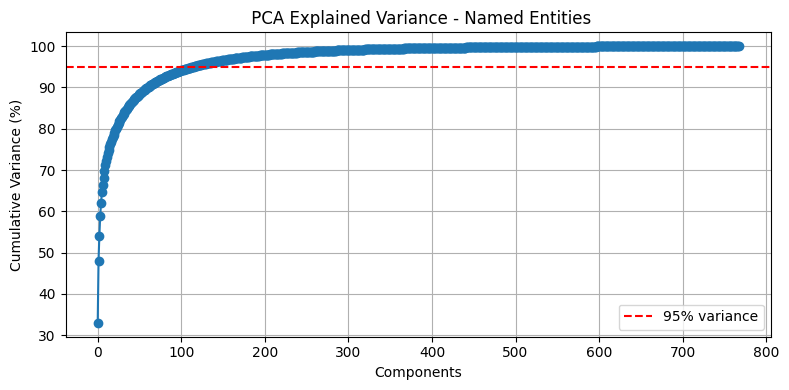

✅ Named Entities: 115 components retain 95% variance


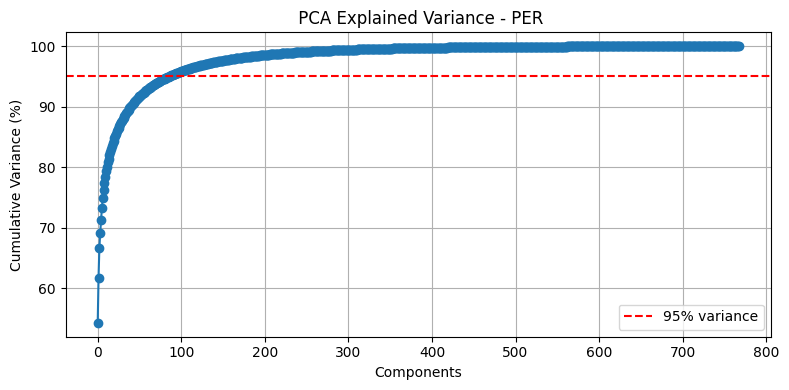

✅ PER: 87 components retain 95% variance


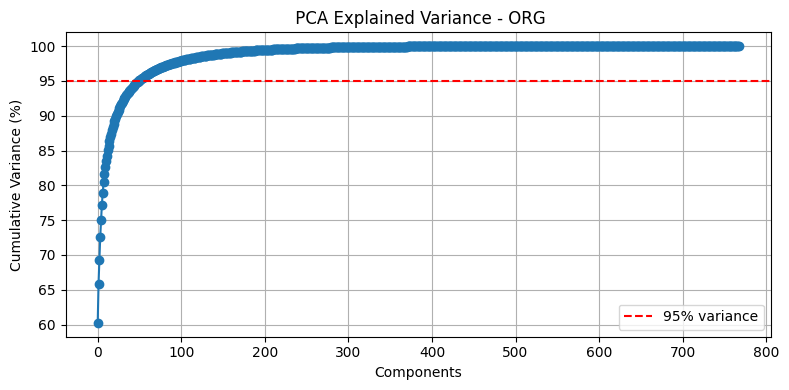

✅ ORG: 50 components retain 95% variance


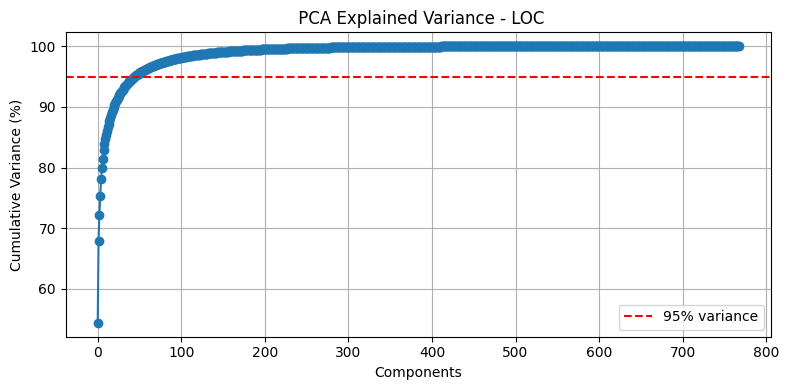

✅ LOC: 46 components retain 95% variance


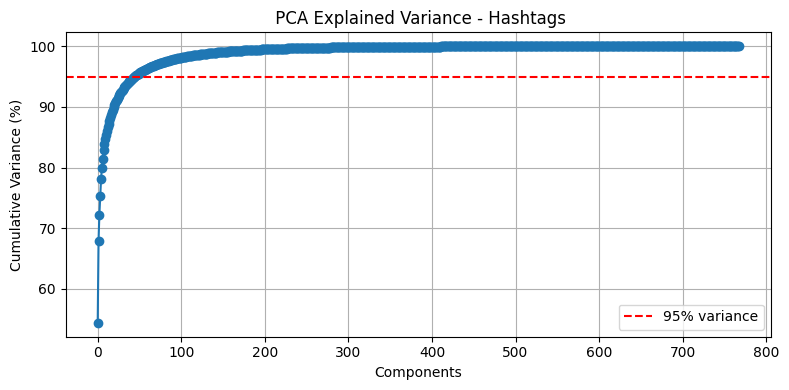

✅ Hashtags: 46 components retain 95% variance


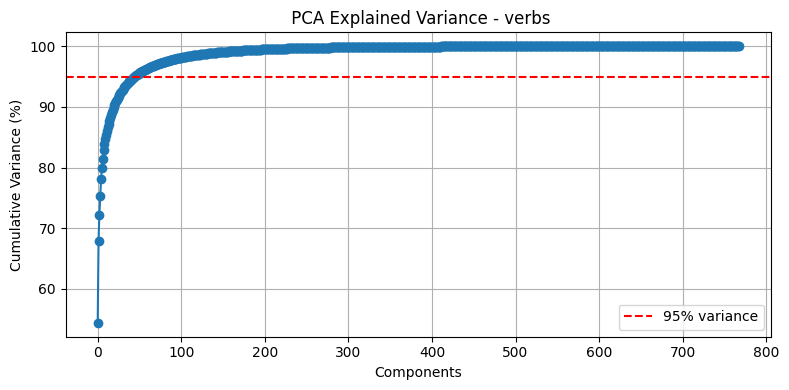

✅ verbs: 46 components retain 95% variance


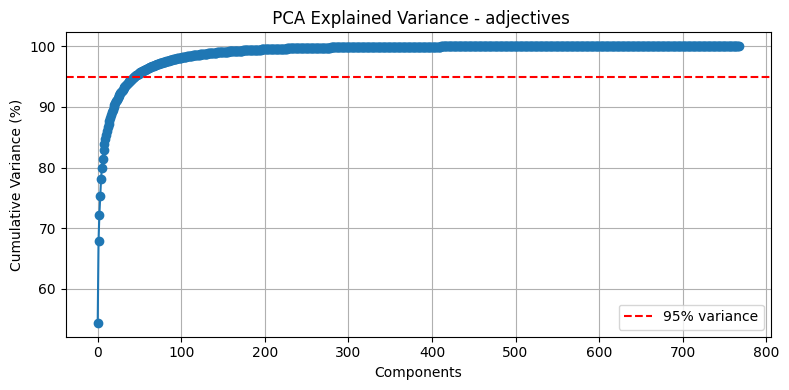

✅ adjectives: 46 components retain 95% variance


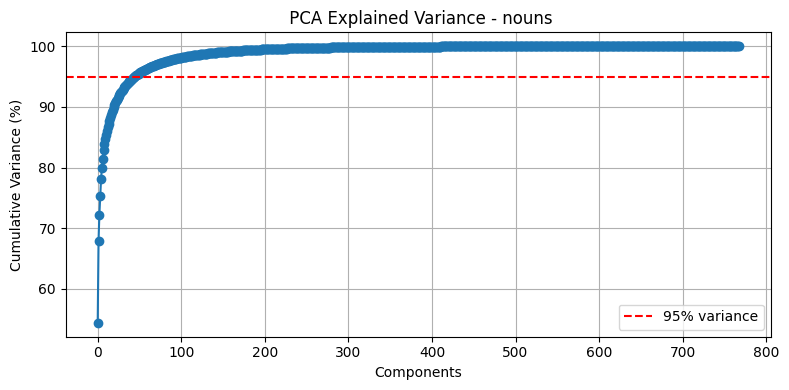

✅ nouns: 46 components retain 95% variance

🧠 PCA-reduced embeddings added to dataframe.


In [32]:
#@title PCA Reduction on Named Entity Embeddings

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
# --- Save to DataFrame ---
named_entities_embedding= df['Named Entities_embedding']
PER_embedding = df['PER_embedding']
ORG_embedding = df['ORG_embedding']
LOC_embedding = df['LOC_embedding']
VERBS_embedding = df['verbs_embedding']
NOUNS_embedding = df['nouns_embedding']
ADJ_embedding = df['adjectives_embedding']

# Convert Series of vectors to arrays
ne_array = np.vstack(named_entities_embedding.values)
per_array = np.vstack(PER_embedding.values)
org_array = np.vstack(ORG_embedding.values)
loc_array = np.vstack(LOC_embedding.values)

verbs_array = np.vstack(VERBS_embedding.values)
adj_array = np.vstack(ADJ_embedding.values)
nouns_array = np.vstack(NOUNS_embedding.values)

def reduce_with_pca(name, X, threshold=0.95):
    pca = PCA()
    pca.fit(X)

    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_variance >= threshold) + 1

    # Plot explained variance
    plt.figure(figsize=(8, 4))
    plt.plot(cumulative_variance * 100, marker='o')
    plt.axhline(y=threshold * 100, color='red', linestyle='--', label=f'{int(threshold * 100)}% variance')
    plt.title(f' PCA Explained Variance - {name}')
    plt.xlabel('Components')
    plt.ylabel('Cumulative Variance (%)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"✅ {name}: {n_components} components retain {int(threshold*100)}% variance")

    # Final reduction
    reduced = PCA(n_components=n_components).fit_transform(X)
    return reduced

# Apply PCA
named_entities_reduced = reduce_with_pca("Named Entities", ne_array)
per_reduced = reduce_with_pca("PER", per_array)
org_reduced = reduce_with_pca("ORG", org_array)
loc_reduced = reduce_with_pca("LOC", loc_array)
hash_reduced = reduce_with_pca("Hashtags", loc_array)

verb_reduced = reduce_with_pca("verbs", loc_array)
adj_reduced = reduce_with_pca("adjectives", loc_array)
nouns_reduced = reduce_with_pca("nouns", loc_array)


# Save to DataFrame
df['NamedEntities_PCA'] = named_entities_reduced.tolist()
df['PER_PCA'] = per_reduced.tolist()
df['ORG_PCA'] = org_reduced.tolist()
df['LOC_PCA'] = loc_reduced.tolist()
df['Hashtags_PCA'] = hash_reduced.tolist()

df['VERBS_PCA'] = nouns_reduced.tolist()
df['ADJ_PCA'] = adj_reduced.tolist()
df['NOUNS_PCA'] = verb_reduced.tolist()


# Confirm
print("\n🧠 PCA-reduced embeddings added to dataframe.")


In [33]:
# @title Save reduced embeddings back to DataFrame
# Convert each PCA column to a NumPy array
named = np.vstack(df['NamedEntities_PCA'].apply(np.array).values)
per   = np.vstack(df['PER_PCA'].apply(np.array).values)
org   = np.vstack(df['ORG_PCA'].apply(np.array).values)
loc   = np.vstack(df['LOC_PCA'].apply(np.array).values)

verbs   = np.vstack(df['VERBS_PCA'].apply(np.array).values)
nouns   = np.vstack(df['NOUNS_PCA'].apply(np.array).values)
adj   = np.vstack(df['ADJ_PCA'].apply(np.array).values)

# Concatenate horizontally
final_embeddings = np.hstack([reduced_embeddings,named])#, per, org, loc

# Store back into df
df['final_embedding'] = list(final_embeddings)

# ✅ Confirm
print("🎯 Final embedding column shape per row:", final_embeddings[0].shape)
print("📦 Final embedding column added to df.")


🎯 Final embedding column shape per row: (420,)
📦 Final embedding column added to df.


### online eval

In [43]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=500,
    time_window_days=3,
    min_cluster_size=3,
    min_samples=3,
    initial_df=tuning_df,
    embedding_column='final_embedding'

)

Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:04<00:00,  5.19it/s]


In [44]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df_aug,
    embedding_column='final_embedding'

)


Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:02<00:00, 12.19it/s]


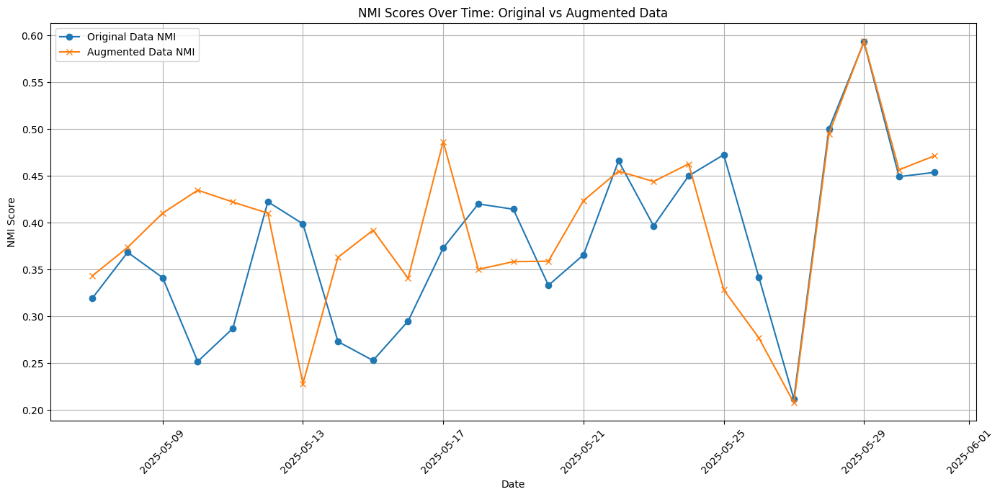

In [45]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


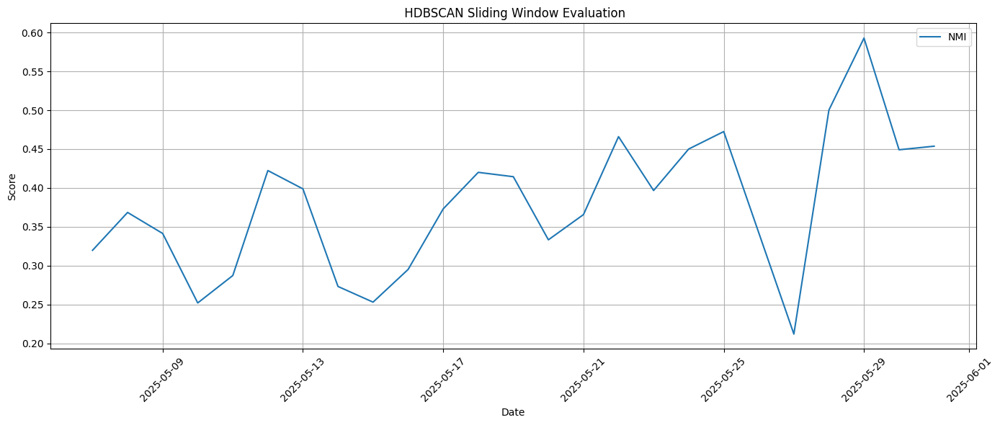

In [46]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title(" HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [47]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_arabert_named")


Results saved to drive/MyDrive/results/hdbscan_arabert_named.csv


In [48]:
#@title Results
models_results = {
    'hdbscan_arabert_splited': sliding_results_original,
    'hdbscan_arabert_splited_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert_splited ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.3197      0.3685      0.3414      0.2519      0.2872      0.4224   
ami       0.2618      0.3018      0.2800      0.1587      0.1783      0.3765   
ari       0.1102      0.1476      0.1420     -0.0113     -0.0152      0.1531   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.3988      0.2731      0.2530      0.2951  ...      0.4660   
ami       0.3791      0.2383      0.2042      0.2557  ...      0.4019   
ari       0.3440      0.1438      0.0717      0.1172  ...      0.1240   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.3967      0.4501      0.4726      0.3422      0.2119      0.5004   
ami       0.3362      0.3873      0.3892      0.2698      0.1539      0.4687   
ari       0.1037      0.1842      0.1261      0.0790      0.0232      0.2648   

date  2025-05-

In [51]:
#@title 🌀 Interactive t-SNE Plot with Plotly (Hover to Show Tweet)
import plotly.express as px
from sklearn.manifold import TSNE
import numpy as np

def interactive_tsne_plot(daily_blocks, date_key, embedding_column='final_embedding', label_column='event_label'):
    """
    Interactive t-SNE plot using Plotly with hover text as tweet messages.

    Args:
        daily_blocks: dict of daily DataFrames
        date_key: datetime.date
        embedding_column: name of column with embedding vectors
        label_column: name of column with event labels
    """
    block = daily_blocks.get(date_key)
    if block is None or block.empty:
        print(f"❌ No block found for {date_key}")
        return

    # Get embeddings and info
    embeddings = np.vstack(block[embedding_column].apply(np.array).values)
    labels = block[label_column].astype(str).values
    messages = block['Tweet Text'].values  # Update if you named the text column differently

    # Compute t-SNE
    tsne_proj = TSNE(n_components=2, random_state=42, perplexity=30).fit_transform(embeddings)

    # Prepare DataFrame
    tsne_df = pd.DataFrame({
        'x': tsne_proj[:, 0],
        'y': tsne_proj[:, 1],
        'label': labels,
        'message': messages
    })

    # Plot
    fig = px.scatter(tsne_df,
                     x='x', y='y',
                     color='label',
                     hover_data={'message': True, 'x': False, 'y': False},
                     title=f't-SNE Projection with Event Labels for {date_key}',
                     labels={'label': 'Event Label'})

    fig.update_traces(marker=dict(size=8, line=dict(width=0.5, color='DarkSlateGrey')))
    fig.update_layout(legend_title_text='Event Label', width=900, height=700)
    fig.show()

# ✅ Example usage
import datetime
interactive_tsne_plot(daily_blocks, datetime.date(2025, 5, 29))


## HDBSCAN + AraBert

### tune

In [ ]:
# @title Install  Arabert
# from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("aubmindlab/bert-base-arabertv2")

# Create and fit BERTopic model
# topic_model = BERTopic(embedding_model=embedding_model, language="arabic")



config.json:   0%|          | 0.00/384 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/543M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [ ]:
#@title Embedding the Tweets
# Imports
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from tqdm import tqdm

tweets = df['Tweet Text'].tolist()
embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

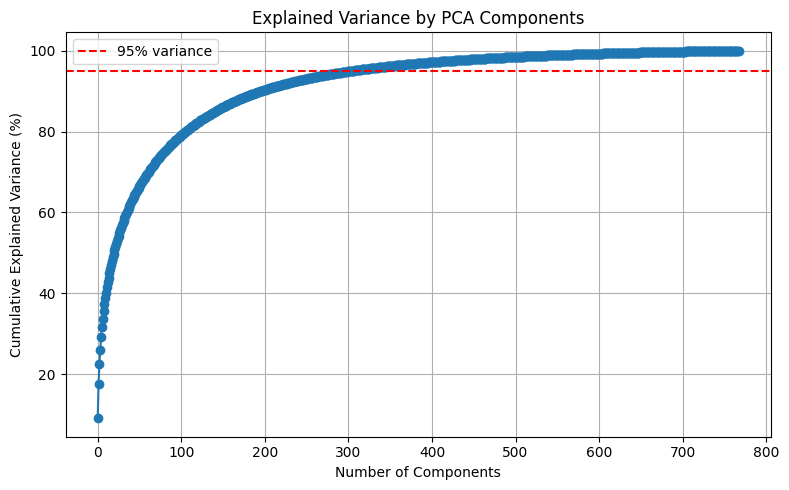


Number of components to retain 95% variance: 305


In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [ ]:
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 305

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 768)
Reduced shape: (6998, 305)


In [ ]:
# save tweet embedding
df['arabert_embeddings']=reduced_embeddings.tolist()

### online eval

In [ ]:
#  @title Load the embedding for the tuning and evaluation df
import numpy as np

# Convert and concatenate for tuning set
tuning_tweet_emb = np.vstack(tuning_df['arabert_embeddings'].apply(np.array).values)
tuning_ne_emb = np.vstack(tuning_df['named_entities_embedding_32d'].apply(np.array).values)
tuning_hs_emb = np.vstack(tuning_df['hashtags_embedding_32d'].apply(np.array).values)

# Final concatenated embedding: 768 + 32 + 32 = 832 dimensions
tuning_embeddings = np.hstack([tuning_tweet_emb,tuning_ne_emb])

# Convert and concatenate for evaluation set
evaluation_tweet_emb = np.vstack(evaluation_df['arabert_embeddings'].apply(np.array).values)
evaluation_ne_emb = np.vstack(evaluation_df['named_entities_embedding_32d'].apply(np.array).values)
evaluation_hs_emb = np.vstack(evaluation_df['hashtags_embedding_32d'].apply(np.array).values)

evaluation_embeddings = np.hstack([evaluation_tweet_emb,evaluation_ne_emb])

# Check shapes
print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (1122, 306)
Evaluation embeddings shape: (9309, 306)


In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=500,
    time_window_days=3,
    min_cluster_size=3,
    min_samples=3
)

# print("Original data sliding HDBSCAN results:")
# print(sliding_results_original.head())


Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:04<00:00,  5.58it/s]


In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3
)

# print("Augmented data sliding HDBSCAN results:")
# print(sliding_results_augmented.head())


Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:05<00:00,  4.70it/s]


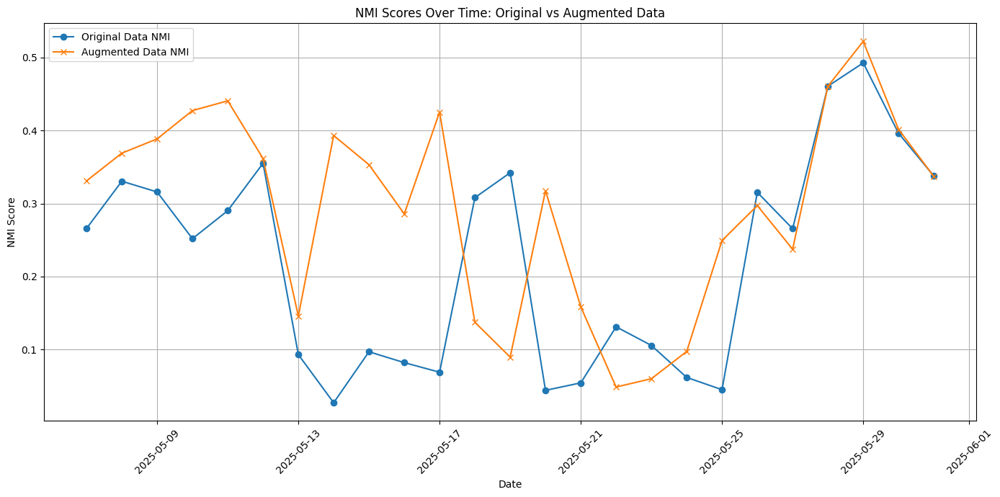

In [ ]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


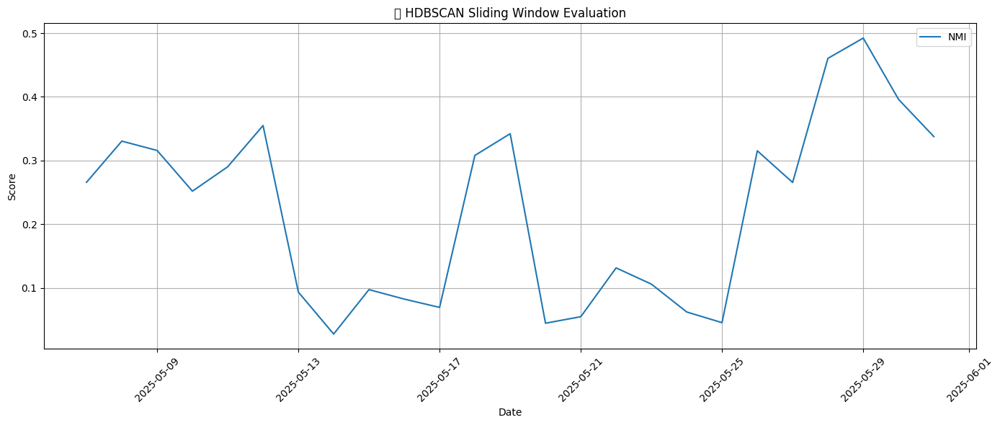

In [ ]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title("📊 HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_arabert")


Results saved to drive/MyDrive/results/hdbscan_word2vec.csv


In [ ]:
#@title Results
models_results = {
    'hdbscan_arabert': sliding_results_original,
    'hdbscan_arabert_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.2658      0.3305      0.3158      0.2518      0.2902      0.3550   
ami       0.2102      0.2800      0.2590      0.1822      0.2035      0.2881   
ari       0.0220      0.0615      0.0470     -0.0182     -0.0407      0.0251   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.0933      0.0273      0.0971      0.0822  ...      0.1313   
ami       0.0766      0.0111      0.0736      0.0583  ...      0.1056   
ari       0.0260     -0.0178      0.0039     -0.0020  ...      0.0339   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.1058      0.0620      0.0452      0.3153      0.2655      0.4605   
ami       0.0815      0.0434      0.0251      0.2441      0.2322      0.4327   
ari       0.0209      0.0072     -0.0010      0.0567      0.0601      0.2355   

date  2025-05-29  2025

# Word2Vec

## DBSCAN + Word2Vec

### tune

In [ ]:

#@title Install & Load Word2Vec Model
!wget https://archive.org/download/AraVec/Twt-CBOW.zip
!unzip Twt-CBOW.zip
from gensim.models import KeyedVectors, Word2Vec


# model = Word2Vec.load('model_full_grams_cbow_300_twitter.mdl')


--2025-07-06 05:37:04--  https://archive.org/download/AraVec/Twt-CBOW.zip
Resolving archive.org (archive.org)... 207.241.224.2
Connecting to archive.org (archive.org)|207.241.224.2|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://ia803205.us.archive.org/28/items/AraVec/Twt-CBOW.zip [following]
--2025-07-06 05:37:04--  https://ia803205.us.archive.org/28/items/AraVec/Twt-CBOW.zip
Resolving ia803205.us.archive.org (ia803205.us.archive.org)... 207.241.234.125
Connecting to ia803205.us.archive.org (ia803205.us.archive.org)|207.241.234.125|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 369123021 (352M) [application/zip]
Saving to: ‘Twt-CBOW.zip’

Twt-CBOW.zip        100%[===================>] 352.02M  52.9MB/s    in 7.2s    

2025-07-06 05:37:12 (49.2 MB/s) - ‘Twt-CBOW.zip’ saved [369123021/369123021]

Archive:  Twt-CBOW.zip
  inflating: Twt-CBOW                
  inflating: Twt-CBOW.syn1neg.npy    
  inflating: Twt-CBOW.wv.syn

In [ ]:
#@title install stanza
# !pip install stanza

In [ ]:
#@title Initialize Stanza Pipeline
# !pip install stanza
import numpy as np
import nltk
import stanza
from gensim.models import KeyedVectors
from nltk.corpus import stopwords

# Download necessary resources (only run once)
nltk.download('stopwords')
stanza.download('ar')

# Load Arabic stopwords from NLTK
ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Initialize Stanza Arabic pipeline for tokenization
nlp = stanza.Pipeline(lang='ar', processors='tokenize,pos,lemma', tokenize_no_ssplit=True)

# Tokenization function
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]

# Tweet embedding function using FastText + Stanza + NLTK stopwords
def embed_tweet(text, model):
    tokens = stanza_tokenize(text)
    # Remove stopwords
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    # Embed
    vectors = [model[token] for token in filtered_tokens if token in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Downloading default packages for language: ar (Arabic) ...


INFO:stanza:Downloaded file to /root/stanza_resources/ar/default.zip
INFO:stanza:Finished downloading models and saved to /root/stanza_resources
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package |
-----------------------
| tokenize  | padt    |
| mwt       | padt    |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Done loading processors!


In [ ]:
#@title Load the model

from gensim.models import KeyedVectors

# model = KeyedVectors.load_word2vec_format('Twitter-CBOW.bin', binary=True)
model = KeyedVectors.load('Twt-CBOW') # word2vec_model



In [ ]:
#@title Embeddding the Tweets
from tqdm.notebook import tqdm
import numpy as np

def embed_tweet(text, word_vectors):
    tokens = stanza_tokenize(text)
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    vectors = [word_vectors[token] for token in filtered_tokens if token in word_vectors]
    if not vectors:
        return np.zeros(word_vectors.vector_size)
    return np.mean(vectors, axis=0)

# Use model.wv, not model
word_vectors = model.wv

tweets = df['Tweet Text'].tolist()
embeddings = np.array([
    embed_tweet(text, word_vectors) for text in tqdm(tweets)
])


  0%|          | 0/6998 [00:00<?, ?it/s]

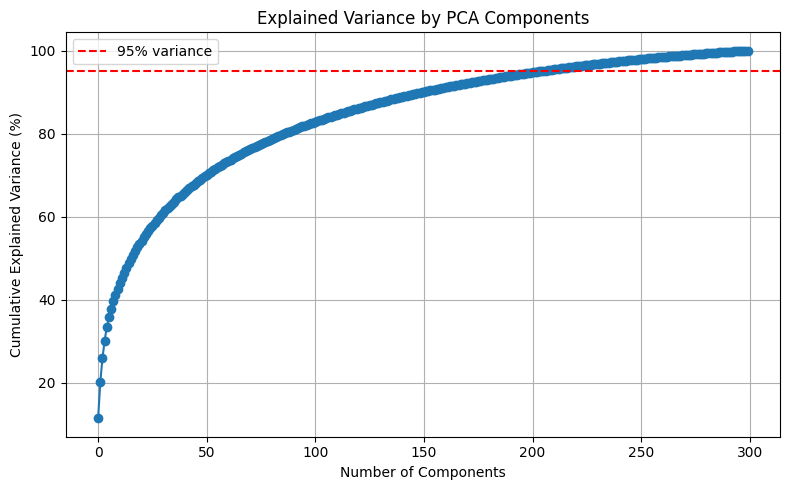


Number of components to retain 95% variance: 204


In [ ]:
#@title best dim
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [ ]:
#@title reduce dim
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 204

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 300)
Reduced shape: (6998, 204)


In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
df['word2vec_embeddings'] = reduced_embeddings.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


In [ ]:
#  @title Load the embedding for the tuning and evaluation df
import ast

# Ensure each value is a string before parsing
def safe_literal_eval(val):
    if isinstance(val, str):
        return ast.literal_eval(val)
    return val  # Already a list or array

# tuning_df['word2vec_embeddings'] = tuning_df['word2vec_embeddings'].apply(safe_literal_eval)
# evaluation_df['word2vec_embeddings'] = evaluation_df['word2vec_embeddings'].apply(safe_literal_eval)

# Convert to NumPy arrays
tuning_embeddings = np.vstack(tuning_df['word2vec_embeddings'].apply(np.array).values)
evaluation_embeddings = np.vstack(evaluation_df['word2vec_embeddings'].apply(np.array).values)

print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (1122, 204)
Evaluation embeddings shape: (9309, 204)


In [ ]:

#@title Define range of DBSCAN parameters to tune
# eps_values = np.arange(0.02, 0.66, 0.02)        # Distance threshold
eps_values = np.arange(0.08, 0.68, 0.01)        # Distance threshold
min_samples_values = np.arange(3,10,1)         # Minimum samples in neighborhood
dim_values = [32, 64, 96, 128, 160, 192, 256, 300]
best_score = -1
best_params = None


In [ ]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.36, NMI = 0.3776


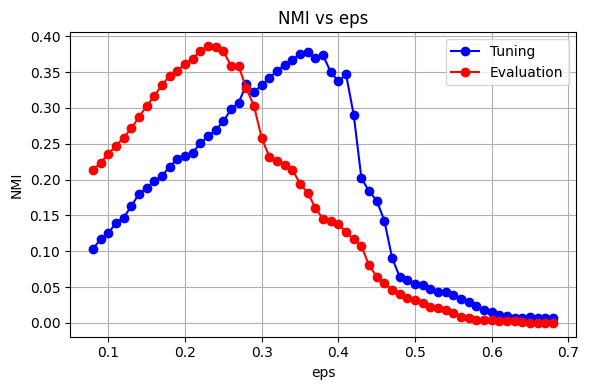

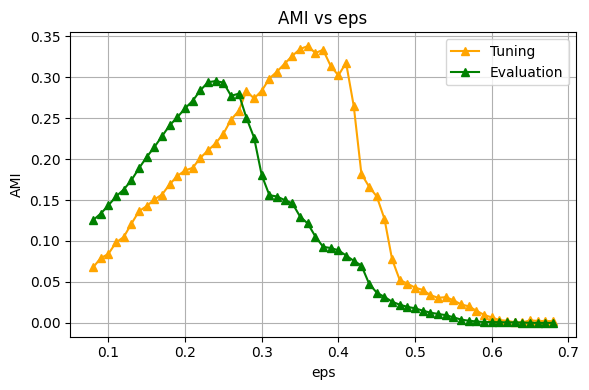

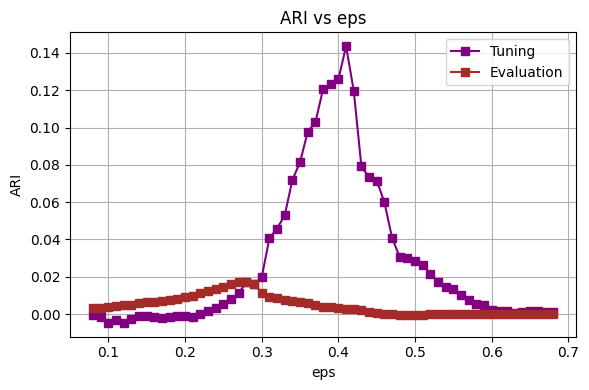

In [ ]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of DBSCAN's eps Parameter

from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.model_selection import KFold

kf = KFold(n_splits=3, shuffle=True, random_state=42)
results_cv = []

for eps in eps_values:
    for min_samples in min_samples_values:
        nmi_scores = []
        ari_scores = []
        ami_scores = []

        for train_idx, val_idx in kf.split(tuning_embeddings):
            X_val = tuning_embeddings[val_idx]
            y_true = true_labels_tuning[val_idx]

            dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
            cluster_labels = dbscan.fit_predict(X_val)

            if len(set(cluster_labels)) > 1 and (cluster_labels != -1).any():
                nmi = normalized_mutual_info_score(y_true, cluster_labels)
                ari = adjusted_rand_score(y_true, cluster_labels)
                ami = adjusted_mutual_info_score(y_true, cluster_labels)
            else:
                nmi = ari = ami = 0

            nmi_scores.append(nmi)
            ari_scores.append(ari)
            ami_scores.append(ami)

        results_cv.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi_mean': np.mean(nmi_scores),
            'nmi_std': np.std(nmi_scores),
            'ari_mean': np.mean(ari_scores),
            'ari_std': np.std(ari_scores),
            'ami_mean': np.mean(ami_scores),
            'ami_std': np.std(ami_scores),
        })

df_cv = pd.DataFrame(results_cv)


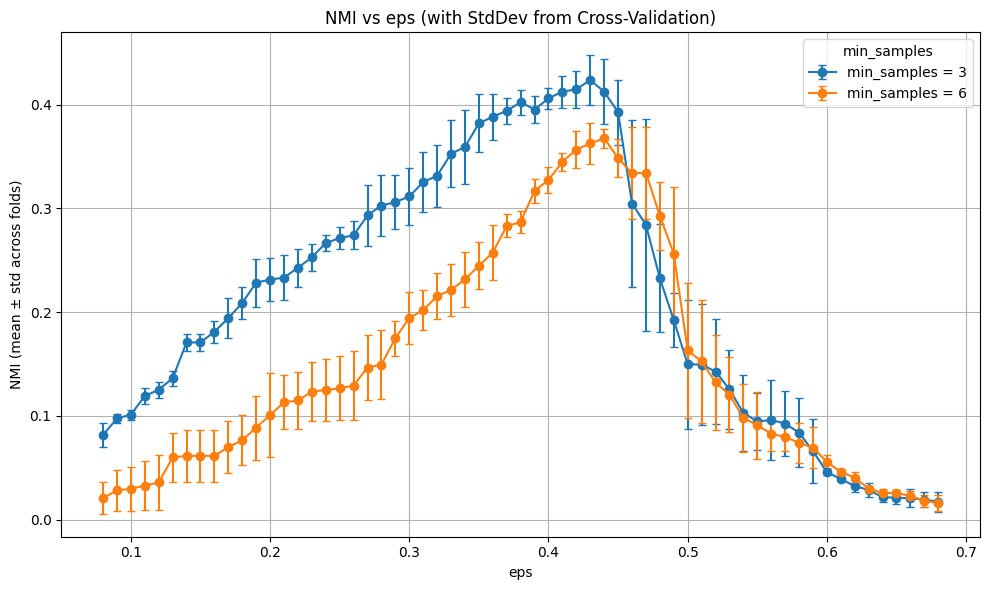

In [ ]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Results
plt.figure(figsize=(10, 6))

# Choose the two min_samples
selected_min_samples = [3, 6]

for min_samples in selected_min_samples:
    subset = df_cv[df_cv['min_samples'] == min_samples]
    plt.errorbar(
        subset['eps'],
        subset['nmi_mean'],
        yerr=subset['nmi_std'],
        marker='o',
        capsize=3,
        label=f'min_samples = {min_samples}'
    )

plt.title('NMI vs eps (with StdDev from Cross-Validation)')
plt.xlabel('eps')
plt.ylabel('NMI (mean ± std across folds)')
plt.legend(title='min_samples')
plt.grid(True)
plt.tight_layout()
plt.show()


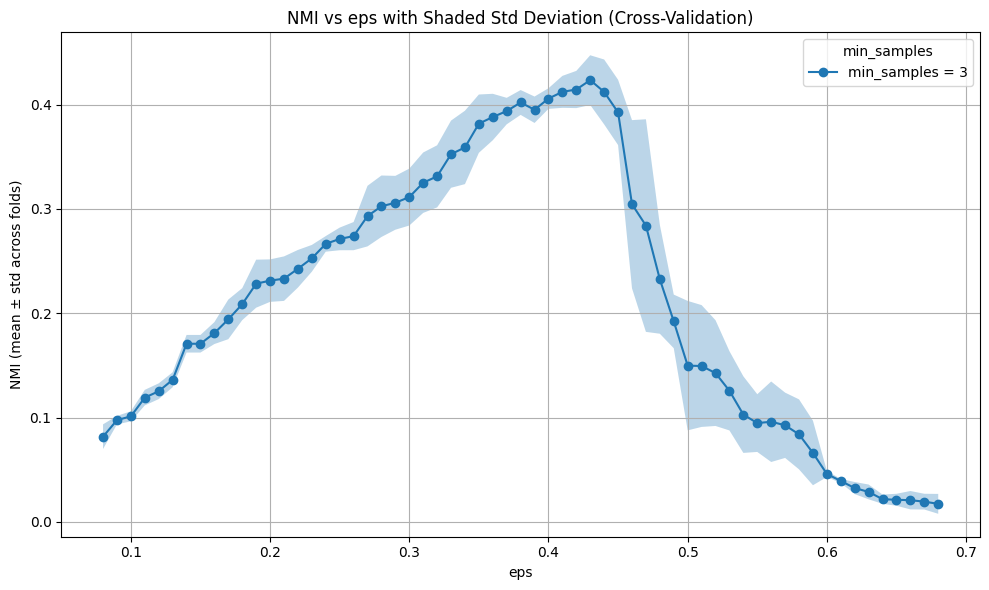

In [ ]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Results
plt.figure(figsize=(10, 6))

selected_min_samples = [3]

for min_samples in selected_min_samples:
    subset = df_cv[df_cv['min_samples'] == min_samples]
    eps = subset['eps']
    mean = subset['nmi_mean']
    std = subset['nmi_std']

    # Plot mean line
    plt.plot(eps, mean, marker='o', label=f'min_samples = {min_samples}')

    # Plot shaded std deviation area
    plt.fill_between(eps, mean - std, mean + std, alpha=0.3)

plt.title('NMI vs eps with Shaded Std Deviation (Cross-Validation)')
plt.xlabel('eps')
plt.ylabel('NMI (mean ± std across folds)')
plt.legend(title='min_samples')
plt.grid(True)
plt.tight_layout()
plt.show()


### online

In [ ]:
#@title Run DBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_dbscan = run_dbscan_sliding(
    daily_blocks_augmented,
    window_size=20000,
    time_window_days=43,
    eps=0.25,
    min_samples=3,
    initial_df=tuning_df
)

Running DBSCAN Sliding Window: 100%|██████████| 25/25 [00:59<00:00,  2.37s/it]


In [ ]:
#@title Run DBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_dbscan_augmented = run_dbscan_sliding(
    daily_blocks_augmented,
    window_size=20000,
    time_window_days=43,
    eps=0.25,
    min_samples=4,
    initial_df=tuning_df
)

Running DBSCAN Sliding Window: 100%|██████████| 25/25 [00:54<00:00,  2.18s/it]


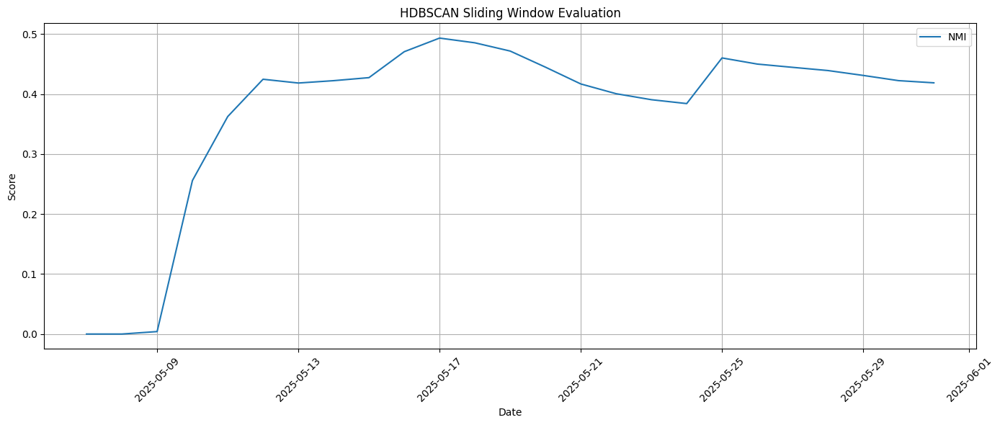

In [ ]:
#@title 📈 Plot DBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_dbscan['date'], sliding_results_dbscan['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title("HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


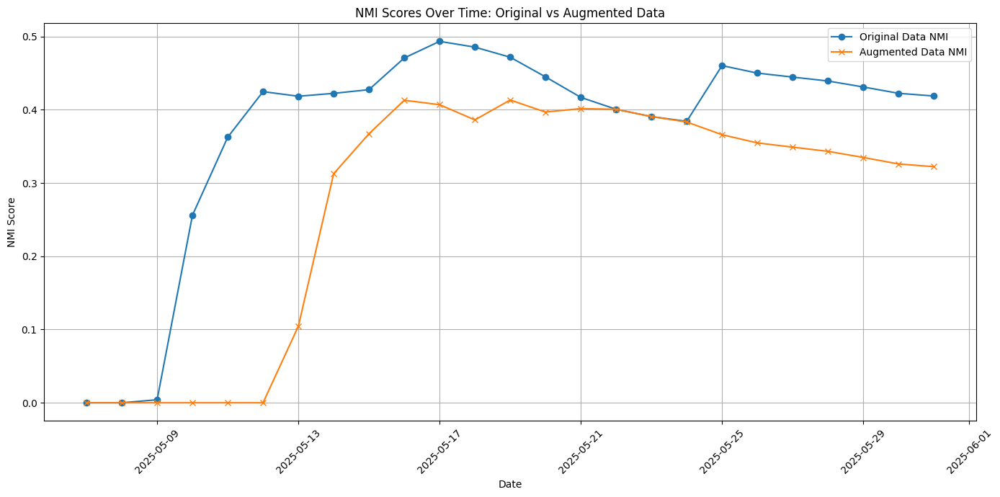

In [ ]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_dbscan['date'], sliding_results_dbscan['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_dbscan_augmented['date'], sliding_results_dbscan_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/dbscan_word2vec")


Results saved to drive/MyDrive/results/dbscan_word2vec.csv


In [ ]:
#@title Results
models_results = {
    'hdbscan_arabert': sliding_results_original,
    'hdbscan_arabert_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.2658      0.3305      0.3158      0.2518      0.2902      0.3550   
ami       0.2102      0.2800      0.2590      0.1822      0.2035      0.2881   
ari       0.0220      0.0615      0.0470     -0.0182     -0.0407      0.0251   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.0933      0.0273      0.0971      0.0822  ...      0.1313   
ami       0.0766      0.0111      0.0736      0.0583  ...      0.1056   
ari       0.0260     -0.0178      0.0039     -0.0020  ...      0.0339   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.1058      0.0620      0.0452      0.3153      0.2655      0.4605   
ami       0.0815      0.0434      0.0251      0.2441      0.2322      0.4327   
ari       0.0209      0.0072     -0.0010      0.0567      0.0601      0.2355   

date  2025-05-29  2025

## HDBSCAN + Word2Vec + Named Entities

### tune

In [ ]:

#@title Install & Load Word2Vec Model
!wget https://archive.org/download/AraVec/Twt-CBOW.zip
!unzip Twt-CBOW.zip
from gensim.models import KeyedVectors, Word2Vec


# model = Word2Vec.load('model_full_grams_cbow_300_twitter.mdl')


--2025-07-06 05:37:04--  https://archive.org/download/AraVec/Twt-CBOW.zip
Resolving archive.org (archive.org)... 207.241.224.2
Connecting to archive.org (archive.org)|207.241.224.2|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://ia803205.us.archive.org/28/items/AraVec/Twt-CBOW.zip [following]
--2025-07-06 05:37:04--  https://ia803205.us.archive.org/28/items/AraVec/Twt-CBOW.zip
Resolving ia803205.us.archive.org (ia803205.us.archive.org)... 207.241.234.125
Connecting to ia803205.us.archive.org (ia803205.us.archive.org)|207.241.234.125|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 369123021 (352M) [application/zip]
Saving to: ‘Twt-CBOW.zip’

Twt-CBOW.zip        100%[===================>] 352.02M  52.9MB/s    in 7.2s    

2025-07-06 05:37:12 (49.2 MB/s) - ‘Twt-CBOW.zip’ saved [369123021/369123021]

Archive:  Twt-CBOW.zip
  inflating: Twt-CBOW                
  inflating: Twt-CBOW.syn1neg.npy    
  inflating: Twt-CBOW.wv.syn

In [ ]:
#@title install stanza
# !pip install stanza

In [ ]:
#@title Initialize Stanza Pipeline
# !pip install stanza
import numpy as np
import nltk
import stanza
from gensim.models import KeyedVectors
from nltk.corpus import stopwords

# Download necessary resources (only run once)
nltk.download('stopwords')
stanza.download('ar')

# Load Arabic stopwords from NLTK
ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Initialize Stanza Arabic pipeline for tokenization
nlp = stanza.Pipeline(lang='ar', processors='tokenize,pos,lemma', tokenize_no_ssplit=True)

# Tokenization function
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]

# Tweet embedding function using FastText + Stanza + NLTK stopwords
def embed_tweet(text, model):
    tokens = stanza_tokenize(text)
    # Remove stopwords
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    # Embed
    vectors = [model[token] for token in filtered_tokens if token in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Downloading default packages for language: ar (Arabic) ...


INFO:stanza:Downloaded file to /root/stanza_resources/ar/default.zip
INFO:stanza:Finished downloading models and saved to /root/stanza_resources
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package |
-----------------------
| tokenize  | padt    |
| mwt       | padt    |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Done loading processors!


In [ ]:
#@title Load the model

from gensim.models import KeyedVectors

# model = KeyedVectors.load_word2vec_format('Twitter-CBOW.bin', binary=True)
model = KeyedVectors.load('Twt-CBOW') # word2vec_model



In [ ]:
#@title Embeddding the Tweets
from tqdm.notebook import tqdm
import numpy as np

def embed_tweet(text, word_vectors):
    tokens = stanza_tokenize(text)
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    vectors = [word_vectors[token] for token in filtered_tokens if token in word_vectors]
    if not vectors:
        return np.zeros(word_vectors.vector_size)
    return np.mean(vectors, axis=0)

# Use model.wv, not model
word_vectors = model.wv

tweets = df['Tweet Text'].tolist()
embeddings = np.array([
    embed_tweet(text, word_vectors) for text in tqdm(tweets)
])


  0%|          | 0/6998 [00:00<?, ?it/s]

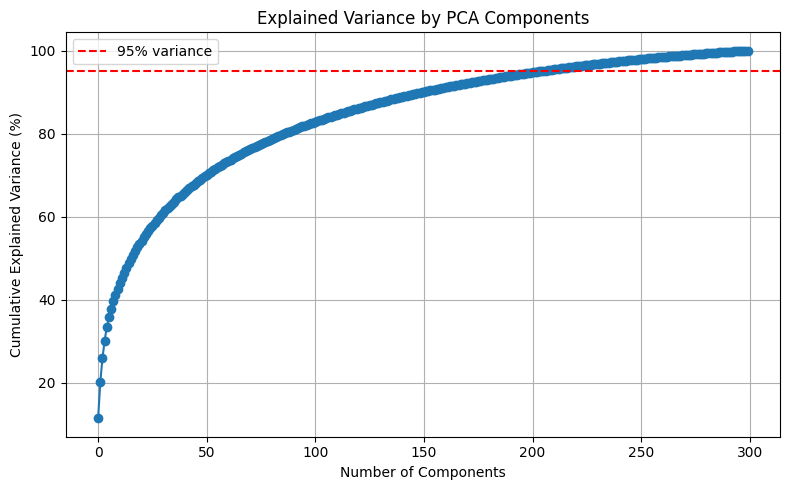


Number of components to retain 95% variance: 204


In [ ]:
#@title best dim
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [ ]:
#@title reduce dim
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 204

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 300)
Reduced shape: (6998, 204)


In [ ]:
#@title Embedding the Named Entities

if isinstance(df['Named Entities'].iloc[0], str):
    df['Named Entities'] = df['Named Entities'].apply(eval)

if isinstance(df['Hashtags'].iloc[0], str):
    df['Hashtags'] = df['Hashtags'].apply(eval)

if isinstance(df['PER'].iloc[0], str):
    df['PER'] = df['PER'].apply(eval)

if isinstance(df['ORG'].iloc[0], str):
    df['ORG'] = df['ORG'].apply(eval)

if isinstance(df['LOC'].iloc[0], str):
    df['LOC'] = df['LOC'].apply(eval)

#@title 🧠 Embedding Named Entities Using Word2Vec

from tqdm.notebook import tqdm
import numpy as np

# --- Step 1: Ensure lists are parsed correctly ---
columns_to_eval = ['Named Entities', 'PER', 'ORG', 'LOC']
for col in columns_to_eval:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

# --- Step 2: Define embed function using Word2Vec ---
def embed_tokens(tokens, word_vectors):
    filtered = [token for token in tokens if token not in ARABIC_STOPWORDS]
    vectors = [word_vectors[token] for token in filtered if token in word_vectors]
    if not vectors:
        return np.zeros(word_vectors.vector_size)
    return np.mean(vectors, axis=0)

named_entities_embedding = df['Named Entities'].apply(lambda x: embed_tokens(x, word_vectors))
PER_embedding = df['PER'].apply(lambda x: embed_tokens(x, word_vectors))
ORG_embedding = df['ORG'].apply(lambda x: embed_tokens(x, word_vectors))
LOC_embedding = df['LOC'].apply(lambda x: embed_tokens(x, word_vectors))


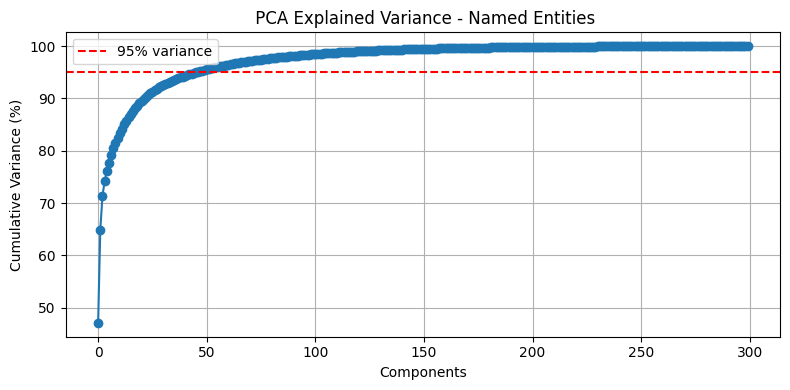

✅ Named Entities: 47 components retain 95% variance


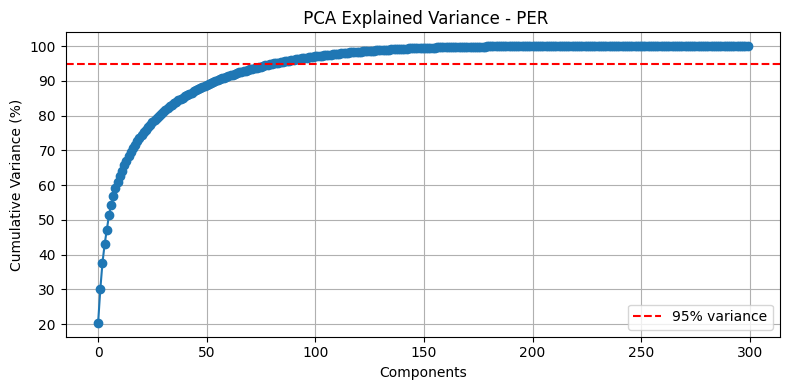

✅ PER: 82 components retain 95% variance


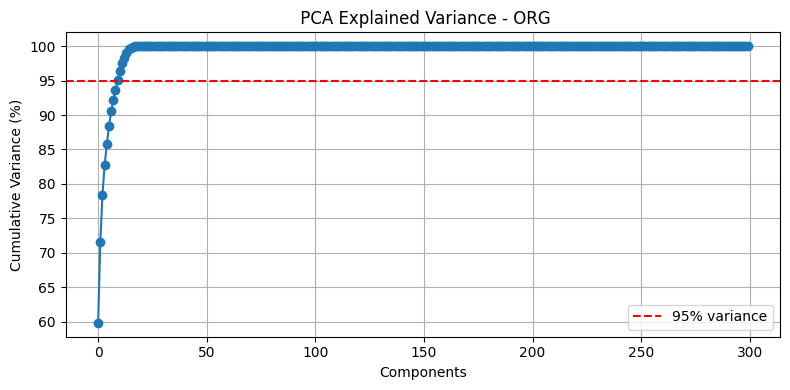

✅ ORG: 10 components retain 95% variance


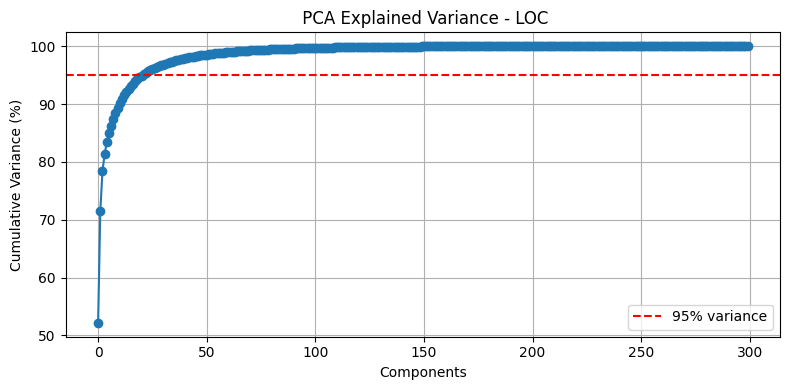

✅ LOC: 22 components retain 95% variance

🧠 PCA-reduced embeddings added to dataframe.


In [ ]:
#@title PCA Reduction on Named Entity Embeddings

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Convert Series of vectors to arrays
ne_array = np.vstack(named_entities_embedding.values)
per_array = np.vstack(PER_embedding.values)
org_array = np.vstack(ORG_embedding.values)
loc_array = np.vstack(LOC_embedding.values)

def reduce_with_pca(name, X, threshold=0.95):
    pca = PCA()
    pca.fit(X)

    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_variance >= threshold) + 1

    # Plot explained variance
    plt.figure(figsize=(8, 4))
    plt.plot(cumulative_variance * 100, marker='o')
    plt.axhline(y=threshold * 100, color='red', linestyle='--', label=f'{int(threshold * 100)}% variance')
    plt.title(f' PCA Explained Variance - {name}')
    plt.xlabel('Components')
    plt.ylabel('Cumulative Variance (%)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"✅ {name}: {n_components} components retain {int(threshold*100)}% variance")

    # Final reduction
    reduced = PCA(n_components=n_components).fit_transform(X)
    return reduced

# Apply PCA
named_entities_reduced = reduce_with_pca("Named Entities", ne_array)
per_reduced = reduce_with_pca("PER", per_array)
org_reduced = reduce_with_pca("ORG", org_array)
loc_reduced = reduce_with_pca("LOC", loc_array)

# Save to DataFrame
df['NamedEntities_PCA'] = named_entities_reduced.tolist()
df['PER_PCA'] = per_reduced.tolist()
df['ORG_PCA'] = org_reduced.tolist()
df['LOC_PCA'] = loc_reduced.tolist()

# Confirm
print("\n🧠 PCA-reduced embeddings added to dataframe.")


In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
df['word2vec_embeddings'] = reduced_embeddings.tolist()

# Convert each PCA column to a NumPy array
named = np.vstack(df['NamedEntities_PCA'].apply(np.array).values)
per   = np.vstack(df['PER_PCA'].apply(np.array).values)
org   = np.vstack(df['ORG_PCA'].apply(np.array).values)
loc   = np.vstack(df['LOC_PCA'].apply(np.array).values)

# Concatenate horizontally
final_embeddings = np.hstack([reduced_embeddings,named])#, per, org, loc

# Store back into df
df['final_embedding'] = list(final_embeddings)

# ✅ Confirm
print("🎯 Final embedding column shape per row:", final_embeddings[0].shape)
print("📦 Final embedding column added to df.")

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


🎯 Final embedding column shape per row: (251,)
📦 Final embedding column added to df.


### online

In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=400,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df,
    embedding_column='final_embedding'
)


Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:02<00:00,  8.82it/s]


In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df_aug,
    embedding_column='final_embedding'

)

Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:04<00:00,  5.68it/s]


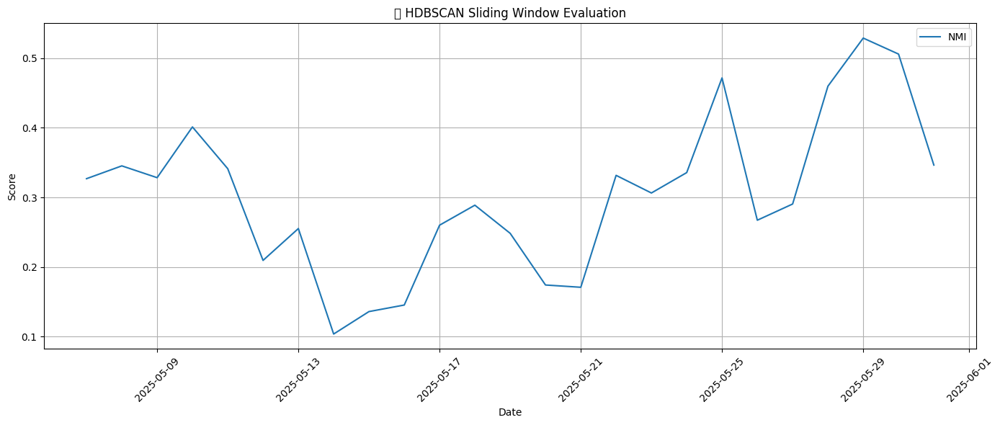

In [ ]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title("📊 HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


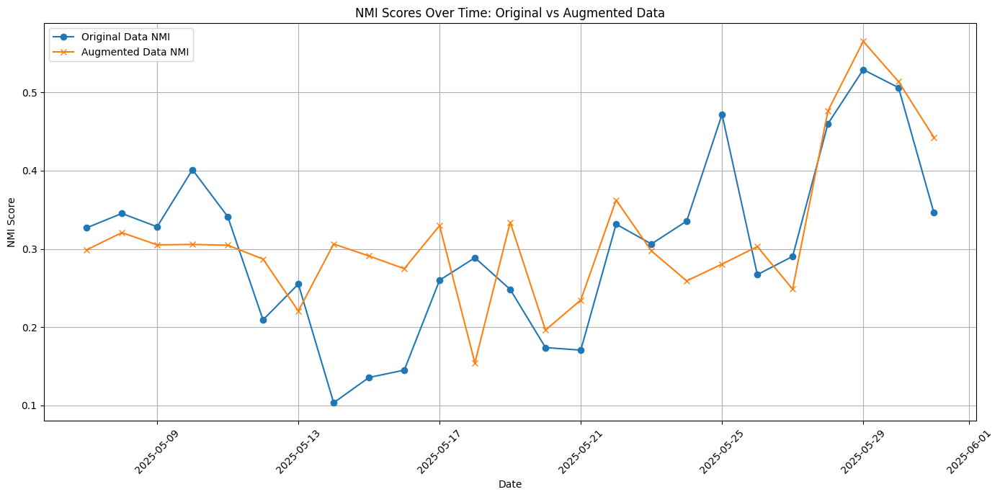

In [ ]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_word2vec_named")


Results saved to drive/MyDrive/results/hdbscan_word2vec_named.csv


In [ ]:
#@title Results
models_results = {
    'hdbscan_arabert': sliding_results_original,
    'hdbscan_arabert_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.3269      0.3453      0.3284      0.4013      0.3413      0.2094   
ami       0.2795      0.2718      0.2601      0.3266      0.2398      0.1673   
ari       0.1986      0.1141      0.1435      0.1438      0.0442      0.0600   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.2552      0.1035      0.1358      0.1452  ...      0.3317   
ami       0.2123      0.0688      0.0984      0.1104  ...      0.2749   
ari       0.1431      0.0082      0.0090      0.0239  ...      0.0926   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.3063      0.3357      0.4718      0.2672      0.2905      0.4599   
ami       0.2614      0.2687      0.3898      0.2334      0.2572      0.4192   
ari       0.1186      0.0738      0.1744      0.1234      0.1293      0.1967   

date  2025-05-29  2025

## HDBSCAN + Word2Vec + Named Entities Splited

### tune

In [ ]:

#@title Install & Load Word2Vec Model
!wget https://archive.org/download/AraVec/Twt-CBOW.zip
!unzip Twt-CBOW.zip
from gensim.models import KeyedVectors, Word2Vec


# model = Word2Vec.load('model_full_grams_cbow_300_twitter.mdl')


--2025-07-06 05:37:04--  https://archive.org/download/AraVec/Twt-CBOW.zip
Resolving archive.org (archive.org)... 207.241.224.2
Connecting to archive.org (archive.org)|207.241.224.2|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://ia803205.us.archive.org/28/items/AraVec/Twt-CBOW.zip [following]
--2025-07-06 05:37:04--  https://ia803205.us.archive.org/28/items/AraVec/Twt-CBOW.zip
Resolving ia803205.us.archive.org (ia803205.us.archive.org)... 207.241.234.125
Connecting to ia803205.us.archive.org (ia803205.us.archive.org)|207.241.234.125|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 369123021 (352M) [application/zip]
Saving to: ‘Twt-CBOW.zip’

Twt-CBOW.zip        100%[===================>] 352.02M  52.9MB/s    in 7.2s    

2025-07-06 05:37:12 (49.2 MB/s) - ‘Twt-CBOW.zip’ saved [369123021/369123021]

Archive:  Twt-CBOW.zip
  inflating: Twt-CBOW                
  inflating: Twt-CBOW.syn1neg.npy    
  inflating: Twt-CBOW.wv.syn

In [ ]:
#@title install stanza
# !pip install stanza

In [ ]:
#@title Initialize Stanza Pipeline
# !pip install stanza
import numpy as np
import nltk
import stanza
from gensim.models import KeyedVectors
from nltk.corpus import stopwords

# Download necessary resources (only run once)
nltk.download('stopwords')
stanza.download('ar')

# Load Arabic stopwords from NLTK
ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Initialize Stanza Arabic pipeline for tokenization
nlp = stanza.Pipeline(lang='ar', processors='tokenize,pos,lemma', tokenize_no_ssplit=True)

# Tokenization function
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]

# Tweet embedding function using FastText + Stanza + NLTK stopwords
def embed_tweet(text, model):
    tokens = stanza_tokenize(text)
    # Remove stopwords
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    # Embed
    vectors = [model[token] for token in filtered_tokens if token in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Downloading default packages for language: ar (Arabic) ...


INFO:stanza:Downloaded file to /root/stanza_resources/ar/default.zip
INFO:stanza:Finished downloading models and saved to /root/stanza_resources
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package |
-----------------------
| tokenize  | padt    |
| mwt       | padt    |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Done loading processors!


In [ ]:
#@title Load the model

from gensim.models import KeyedVectors

# model = KeyedVectors.load_word2vec_format('Twitter-CBOW.bin', binary=True)
model = KeyedVectors.load('Twt-CBOW') # word2vec_model



In [ ]:
#@title Embeddding the Tweets
from tqdm.notebook import tqdm
import numpy as np

def embed_tweet(text, word_vectors):
    tokens = stanza_tokenize(text)
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    vectors = [word_vectors[token] for token in filtered_tokens if token in word_vectors]
    if not vectors:
        return np.zeros(word_vectors.vector_size)
    return np.mean(vectors, axis=0)

# Use model.wv, not model
word_vectors = model.wv

tweets = df['Tweet Text'].tolist()
embeddings = np.array([
    embed_tweet(text, word_vectors) for text in tqdm(tweets)
])


  0%|          | 0/6998 [00:00<?, ?it/s]

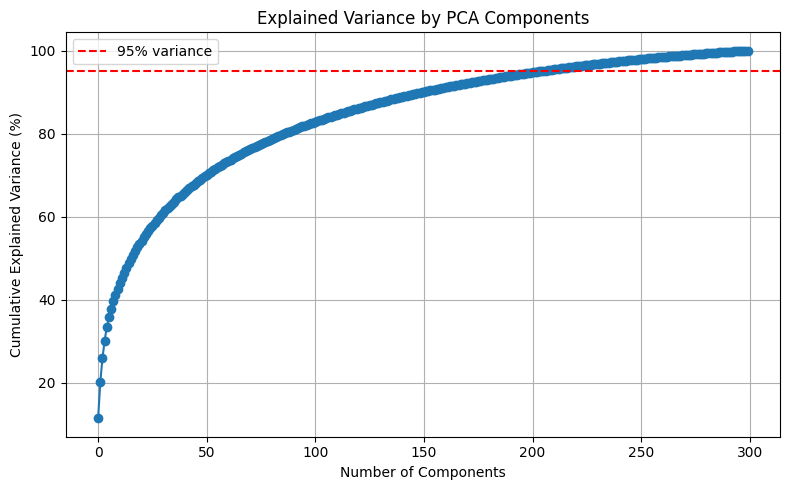


Number of components to retain 95% variance: 204


In [ ]:
#@title best dim
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [ ]:
#@title reduce dim
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 204

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 300)
Reduced shape: (6998, 204)


In [ ]:
#@title Embedding the Named Entities

if isinstance(df['Named Entities'].iloc[0], str):
    df['Named Entities'] = df['Named Entities'].apply(eval)

if isinstance(df['Hashtags'].iloc[0], str):
    df['Hashtags'] = df['Hashtags'].apply(eval)

if isinstance(df['PER'].iloc[0], str):
    df['PER'] = df['PER'].apply(eval)

if isinstance(df['ORG'].iloc[0], str):
    df['ORG'] = df['ORG'].apply(eval)

if isinstance(df['LOC'].iloc[0], str):
    df['LOC'] = df['LOC'].apply(eval)

#@title 🧠 Embedding Named Entities Using Word2Vec

from tqdm.notebook import tqdm
import numpy as np

# --- Step 1: Ensure lists are parsed correctly ---
columns_to_eval = ['Named Entities', 'PER', 'ORG', 'LOC']
for col in columns_to_eval:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

# --- Step 2: Define embed function using Word2Vec ---
def embed_tokens(tokens, word_vectors):
    filtered = [token for token in tokens if token not in ARABIC_STOPWORDS]
    vectors = [word_vectors[token] for token in filtered if token in word_vectors]
    if not vectors:
        return np.zeros(word_vectors.vector_size)
    return np.mean(vectors, axis=0)

named_entities_embedding = df['Named Entities'].apply(lambda x: embed_tokens(x, word_vectors))
PER_embedding = df['PER'].apply(lambda x: embed_tokens(x, word_vectors))
ORG_embedding = df['ORG'].apply(lambda x: embed_tokens(x, word_vectors))
LOC_embedding = df['LOC'].apply(lambda x: embed_tokens(x, word_vectors))


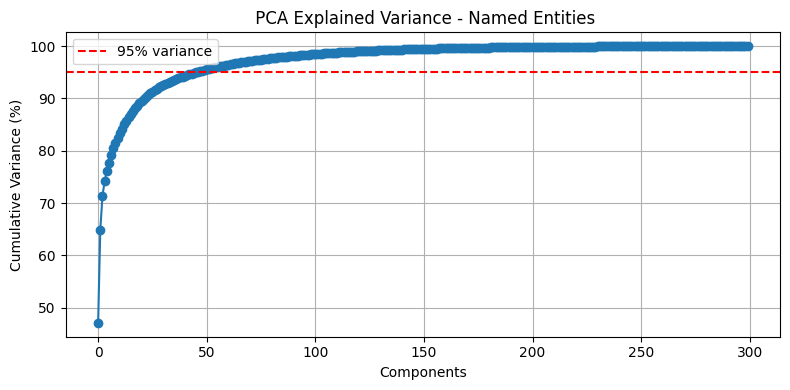

✅ Named Entities: 47 components retain 95% variance


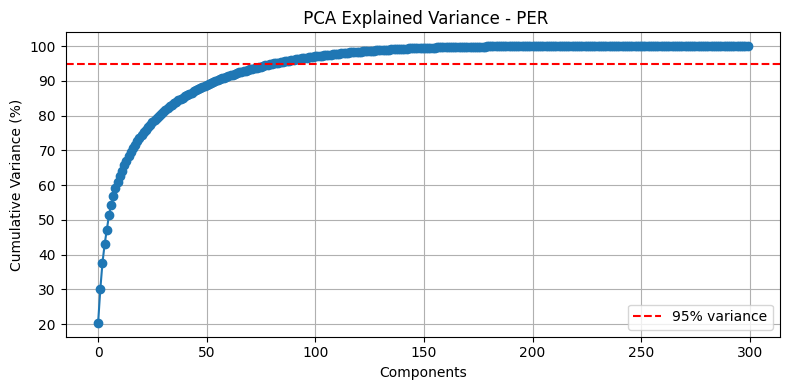

✅ PER: 82 components retain 95% variance


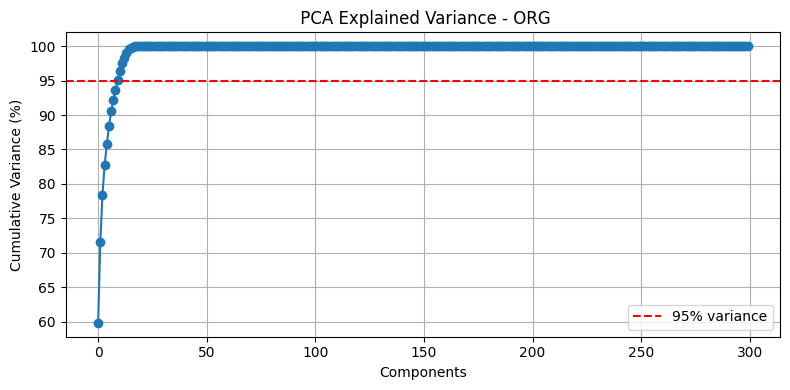

✅ ORG: 10 components retain 95% variance


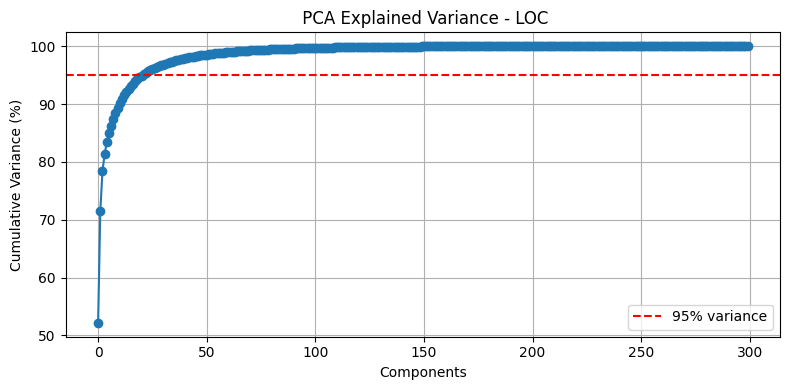

✅ LOC: 22 components retain 95% variance


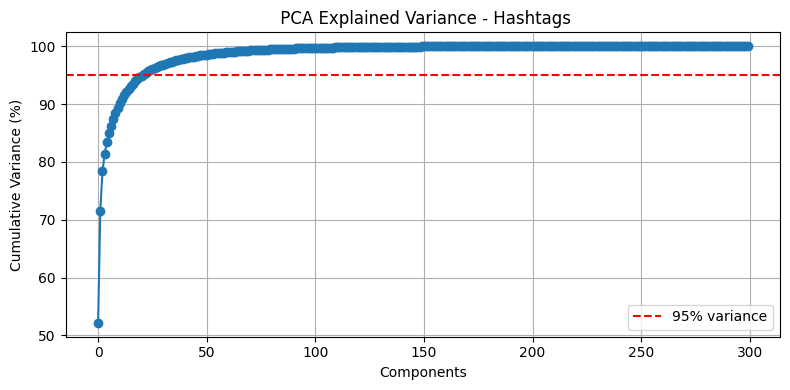

✅ Hashtags: 22 components retain 95% variance

🧠 PCA-reduced embeddings added to dataframe.


In [ ]:
#@title PCA Reduction on Named Entity Embeddings

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Convert Series of vectors to arrays
ne_array = np.vstack(named_entities_embedding.values)
per_array = np.vstack(PER_embedding.values)
org_array = np.vstack(ORG_embedding.values)
loc_array = np.vstack(LOC_embedding.values)

def reduce_with_pca(name, X, threshold=0.95):
    pca = PCA()
    pca.fit(X)

    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_variance >= threshold) + 1

    # Plot explained variance
    plt.figure(figsize=(8, 4))
    plt.plot(cumulative_variance * 100, marker='o')
    plt.axhline(y=threshold * 100, color='red', linestyle='--', label=f'{int(threshold * 100)}% variance')
    plt.title(f' PCA Explained Variance - {name}')
    plt.xlabel('Components')
    plt.ylabel('Cumulative Variance (%)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"✅ {name}: {n_components} components retain {int(threshold*100)}% variance")

    # Final reduction
    reduced = PCA(n_components=n_components).fit_transform(X)
    return reduced

# Apply PCA
named_entities_reduced = reduce_with_pca("Named Entities", ne_array)
per_reduced = reduce_with_pca("PER", per_array)
org_reduced = reduce_with_pca("ORG", org_array)
loc_reduced = reduce_with_pca("LOC", loc_array)
hash_reduced = reduce_with_pca("Hashtags", loc_array)


# Save to DataFrame
df['NamedEntities_PCA'] = named_entities_reduced.tolist()
df['PER_PCA'] = per_reduced.tolist()
df['ORG_PCA'] = org_reduced.tolist()
df['LOC_PCA'] = loc_reduced.tolist()
df['Hashtags_PCA'] = hash_reduced.tolist()


# Confirm
print("\n🧠 PCA-reduced embeddings added to dataframe.")


In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
df['word2vec_embeddings'] = reduced_embeddings.tolist()

# Convert each PCA column to a NumPy array
named = np.vstack(df['NamedEntities_PCA'].apply(np.array).values)
per   = np.vstack(df['PER_PCA'].apply(np.array).values)
org   = np.vstack(df['ORG_PCA'].apply(np.array).values)
loc   = np.vstack(df['LOC_PCA'].apply(np.array).values)
hash   = np.vstack(df['Hashtags_PCA'].apply(np.array).values)

# Concatenate horizontally
final_embeddings = np.hstack([reduced_embeddings,loc,per, org])#, per, org, loc

# Store back into df
df['final_embedding'] = list(final_embeddings)

# ✅ Confirm
print("🎯 Final embedding column shape per row:", final_embeddings[0].shape)
print("📦 Final embedding column added to df.")

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


🎯 Final embedding column shape per row: (318,)
📦 Final embedding column added to df.


### online

In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=400,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df,
    embedding_column='final_embedding'

)


Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:01<00:00, 15.55it/s]


In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=4,
    min_cluster_size=3,
    min_samples=3,
    initial_df=tuning_df_aug,
    embedding_column='final_embedding'

)

Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:02<00:00, 12.39it/s]


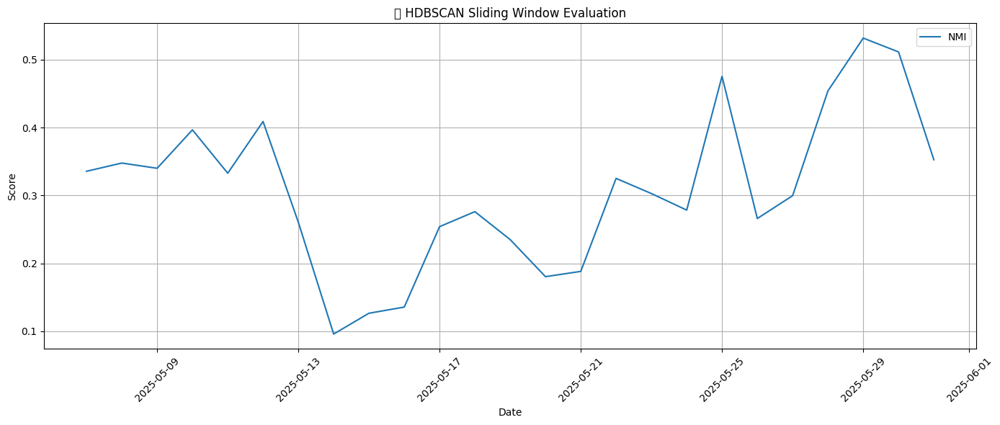

In [ ]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title("📊 HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


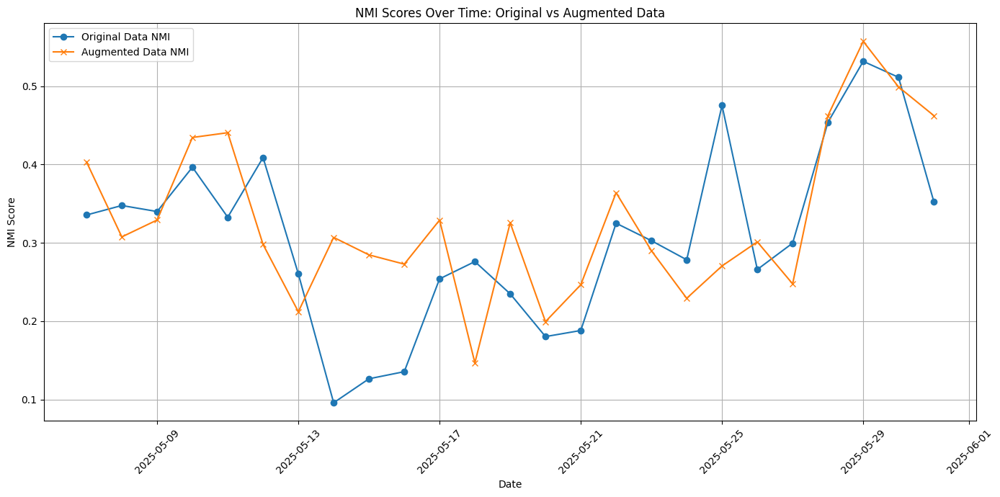

In [ ]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


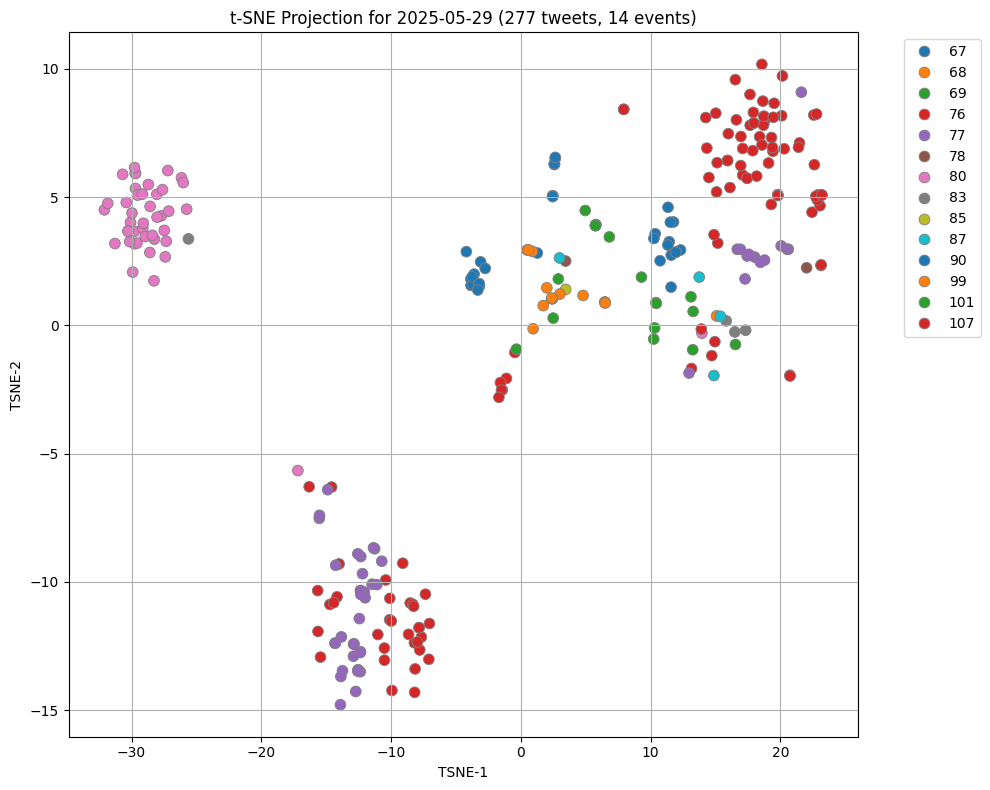

In [ ]:
#@title 🌀 Plot t-SNE of a Message Block with Event Labels
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns

def plot_tsne_message_block(daily_blocks, date_key, title_prefix='t-SNE Projection'):
    """
    Plots t-SNE projection of a daily message block using event labels for coloring.

    Args:
        daily_blocks: dict of daily DataFrames (e.g., `daily_blocks_augmented` or `daily_blocks`)
        date_key: datetime.date (e.g., datetime.date(2025, 5, 9))
        title_prefix: Optional title prefix
    """

    block = daily_blocks.get(date_key)
    if block is None:
        print(f"No block found for {date_key}")
        return

    # Convert embeddings and labels
    embeddings = np.vstack(block['final_embedding'].apply(np.array).values)
    labels = block['event_label'].values

    # Run t-SNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    tsne_proj = tsne.fit_transform(embeddings)

    # Plot
    plt.figure(figsize=(10, 8))
    palette = sns.color_palette('tab10', n_colors=len(set(labels)))
    sns.scatterplot(x=tsne_proj[:, 0], y=tsne_proj[:, 1], hue=labels, palette=palette, legend='full', s=60, edgecolor='gray')
    plt.title(f"{title_prefix} for {date_key} ({len(labels)} tweets, {len(set(labels))} events)")
    plt.xlabel("TSNE-1")
    plt.ylabel("TSNE-2")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.grid(True)
    plt.show()

#  Example usage:
import datetime
plot_tsne_message_block(daily_blocks, datetime.date(2025, 5, 29))  # Change the date to your desired day


In [ ]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_word2vec_splited")


Results saved to drive/MyDrive/results/hdbscan_word2vec_splited.csv


In [ ]:
#@title Results
models_results = {
    'hdbscan_arabert': sliding_results_original,
    'hdbscan_arabert_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.3356      0.3477      0.3400      0.3966      0.3327      0.4089   
ami       0.2885      0.2742      0.2762      0.3212      0.2299      0.3391   
ari       0.1917      0.1160      0.1480      0.1299      0.0393      0.0590   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.2604      0.0958      0.1264      0.1355  ...      0.3250   
ami       0.2167      0.0598      0.0845      0.0964  ...      0.2674   
ari       0.1374      0.0162      0.0102      0.0195  ...      0.0869   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.3027      0.2784      0.4755      0.2660      0.2996      0.4539   
ami       0.2575      0.2264      0.3968      0.2351      0.2632      0.4126   
ari       0.1098      0.0962      0.1786      0.1161      0.1331      0.1852   

date  2025-05-29  2025

## HDBSCAN + Word2Vec + Named Entities Splited +Verbs

### tune

In [ ]:

#@title Install & Load Word2Vec Model
!wget https://archive.org/download/AraVec/Twt-CBOW.zip
!unzip Twt-CBOW.zip
from gensim.models import KeyedVectors, Word2Vec


# model = Word2Vec.load('model_full_grams_cbow_300_twitter.mdl')


--2025-07-06 05:37:04--  https://archive.org/download/AraVec/Twt-CBOW.zip
Resolving archive.org (archive.org)... 207.241.224.2
Connecting to archive.org (archive.org)|207.241.224.2|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://ia803205.us.archive.org/28/items/AraVec/Twt-CBOW.zip [following]
--2025-07-06 05:37:04--  https://ia803205.us.archive.org/28/items/AraVec/Twt-CBOW.zip
Resolving ia803205.us.archive.org (ia803205.us.archive.org)... 207.241.234.125
Connecting to ia803205.us.archive.org (ia803205.us.archive.org)|207.241.234.125|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 369123021 (352M) [application/zip]
Saving to: ‘Twt-CBOW.zip’

Twt-CBOW.zip        100%[===================>] 352.02M  52.9MB/s    in 7.2s    

2025-07-06 05:37:12 (49.2 MB/s) - ‘Twt-CBOW.zip’ saved [369123021/369123021]

Archive:  Twt-CBOW.zip
  inflating: Twt-CBOW                
  inflating: Twt-CBOW.syn1neg.npy    
  inflating: Twt-CBOW.wv.syn

In [ ]:
#@title install stanza
# !pip install stanza

In [ ]:
#@title Initialize Stanza Pipeline
# !pip install stanza
import numpy as np
import nltk
import stanza
from gensim.models import KeyedVectors
from nltk.corpus import stopwords

# Download necessary resources (only run once)
nltk.download('stopwords')
stanza.download('ar')

# Load Arabic stopwords from NLTK
ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Initialize Stanza Arabic pipeline for tokenization
nlp = stanza.Pipeline(lang='ar', processors='tokenize,pos,lemma', tokenize_no_ssplit=True)

# Tokenization function
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]

# Tweet embedding function using FastText + Stanza + NLTK stopwords
def embed_tweet(text, model):
    tokens = stanza_tokenize(text)
    # Remove stopwords
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    # Embed
    vectors = [model[token] for token in filtered_tokens if token in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Downloading default packages for language: ar (Arabic) ...


INFO:stanza:Downloaded file to /root/stanza_resources/ar/default.zip
INFO:stanza:Finished downloading models and saved to /root/stanza_resources
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package |
-----------------------
| tokenize  | padt    |
| mwt       | padt    |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Done loading processors!


In [ ]:
#@title Load the model

from gensim.models import KeyedVectors

# model = KeyedVectors.load_word2vec_format('Twitter-CBOW.bin', binary=True)
model = KeyedVectors.load('Twt-CBOW') # word2vec_model



In [ ]:
#@title Embeddding the Tweets
from tqdm.notebook import tqdm
import numpy as np

def embed_tweet(text, word_vectors):
    tokens = stanza_tokenize(text)
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    vectors = [word_vectors[token] for token in filtered_tokens if token in word_vectors]
    if not vectors:
        return np.zeros(word_vectors.vector_size)
    return np.mean(vectors, axis=0)

# Use model.wv, not model
word_vectors = model.wv

tweets = df['Tweet Text'].tolist()
embeddings = np.array([
    embed_tweet(text, word_vectors) for text in tqdm(tweets)
])


  0%|          | 0/6998 [00:00<?, ?it/s]

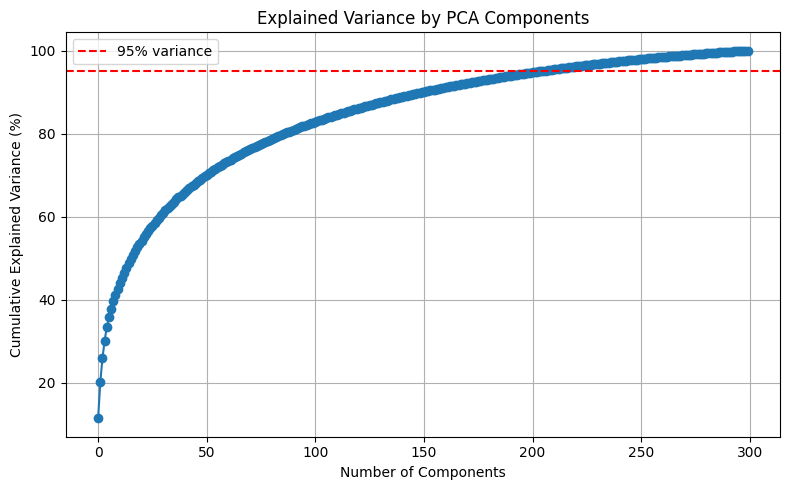


Number of components to retain 95% variance: 204


In [ ]:
#@title best dim
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [ ]:
#@title reduce dim
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 204

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 300)
Reduced shape: (6998, 204)


In [ ]:
#@title Embedding the Named Entities

if isinstance(df['Named Entities'].iloc[0], str):
    df['Named Entities'] = df['Named Entities'].apply(eval)

if isinstance(df['Hashtags'].iloc[0], str):
    df['Hashtags'] = df['Hashtags'].apply(eval)

if isinstance(df['PER'].iloc[0], str):
    df['PER'] = df['PER'].apply(eval)

if isinstance(df['ORG'].iloc[0], str):
    df['ORG'] = df['ORG'].apply(eval)

if isinstance(df['LOC'].iloc[0], str):
    df['LOC'] = df['LOC'].apply(eval)

#@title 🧠 Embedding Named Entities Using Word2Vec

from tqdm.notebook import tqdm
import numpy as np

# --- Step 1: Ensure lists are parsed correctly ---
columns_to_eval = ['Named Entities', 'PER', 'ORG', 'LOC']
for col in columns_to_eval:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

# --- Step 2: Define embed function using Word2Vec ---
def embed_tokens(tokens, word_vectors):
    filtered = [token for token in tokens if token not in ARABIC_STOPWORDS]
    vectors = [word_vectors[token] for token in filtered if token in word_vectors]
    if not vectors:
        return np.zeros(word_vectors.vector_size)
    return np.mean(vectors, axis=0)

named_entities_embedding = df['Named Entities'].apply(lambda x: embed_tokens(x, word_vectors))
PER_embedding = df['PER'].apply(lambda x: embed_tokens(x, word_vectors))
ORG_embedding = df['ORG'].apply(lambda x: embed_tokens(x, word_vectors))
LOC_embedding = df['LOC'].apply(lambda x: embed_tokens(x, word_vectors))


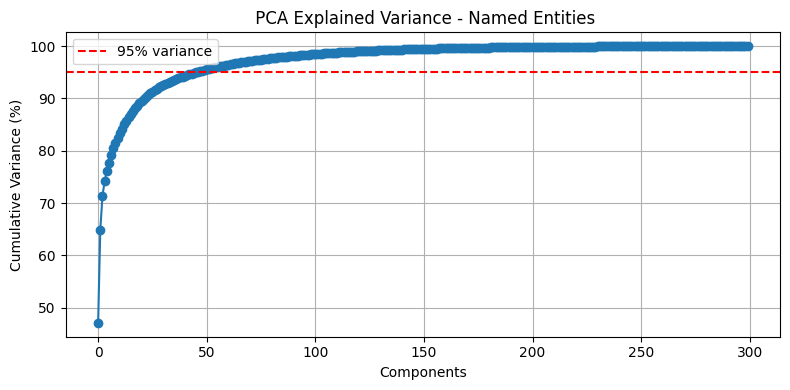

✅ Named Entities: 47 components retain 95% variance


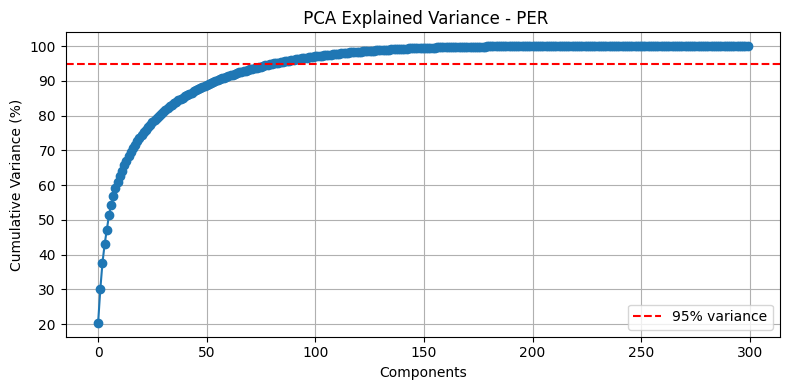

✅ PER: 82 components retain 95% variance


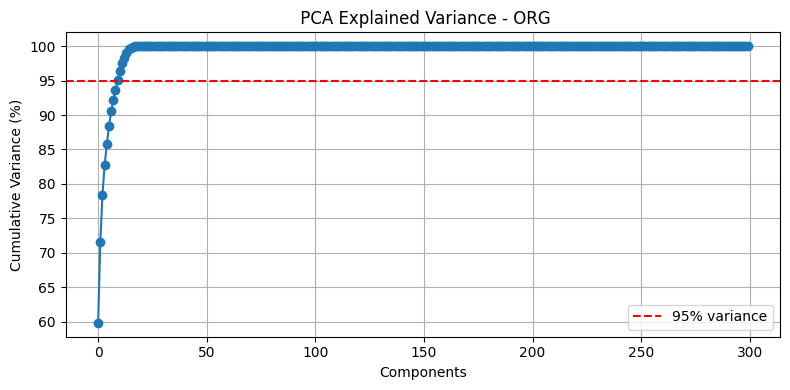

✅ ORG: 10 components retain 95% variance


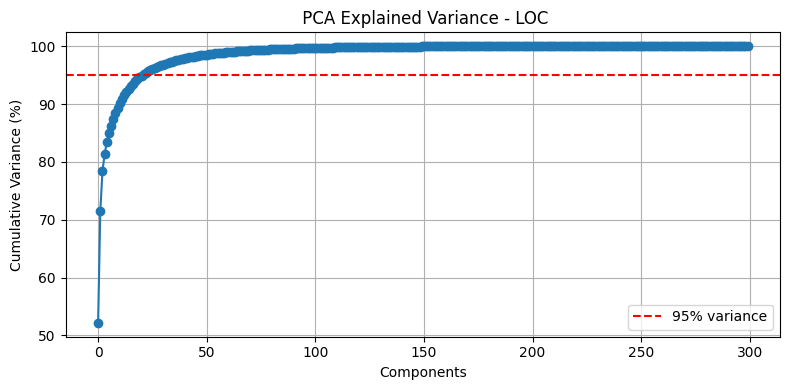

✅ LOC: 22 components retain 95% variance


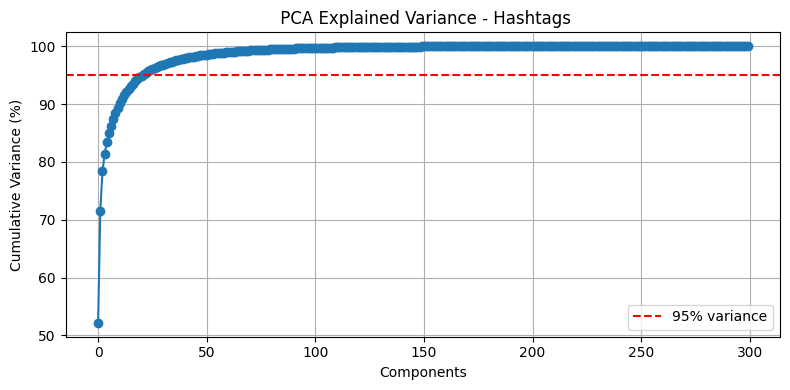

✅ Hashtags: 22 components retain 95% variance


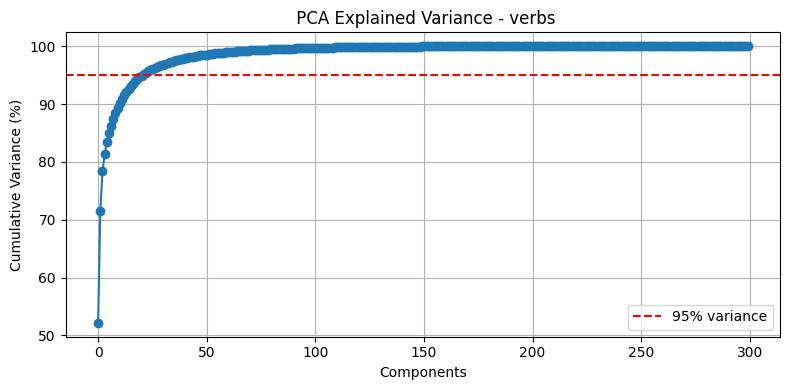

✅ verbs: 22 components retain 95% variance


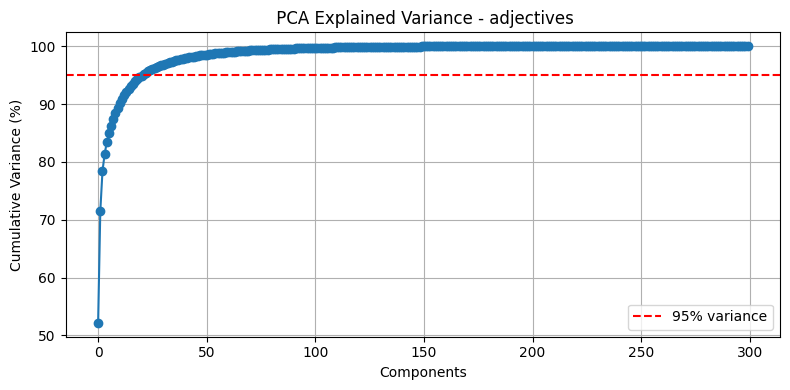

✅ adjectives: 22 components retain 95% variance


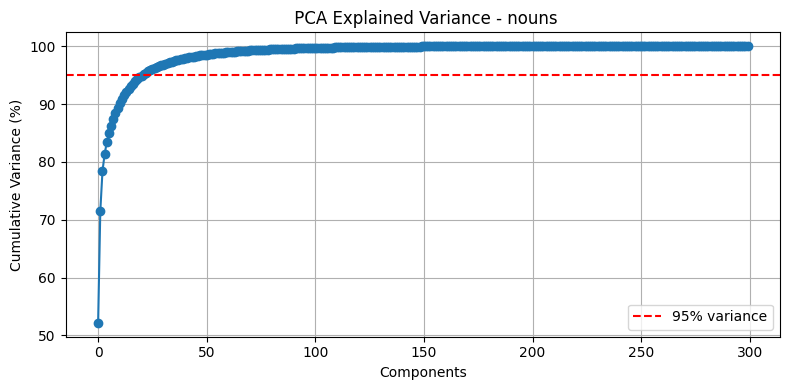

✅ nouns: 22 components retain 95% variance

🧠 PCA-reduced embeddings added to dataframe.


In [ ]:
#@title PCA Reduction on Named Entity Embeddings

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Convert Series of vectors to arrays
ne_array = np.vstack(named_entities_embedding.values)
per_array = np.vstack(PER_embedding.values)
org_array = np.vstack(ORG_embedding.values)
loc_array = np.vstack(LOC_embedding.values)

def reduce_with_pca(name, X, threshold=0.95):
    pca = PCA()
    pca.fit(X)

    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_variance >= threshold) + 1

    # Plot explained variance
    plt.figure(figsize=(8, 4))
    plt.plot(cumulative_variance * 100, marker='o')
    plt.axhline(y=threshold * 100, color='red', linestyle='--', label=f'{int(threshold * 100)}% variance')
    plt.title(f' PCA Explained Variance - {name}')
    plt.xlabel('Components')
    plt.ylabel('Cumulative Variance (%)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"✅ {name}: {n_components} components retain {int(threshold*100)}% variance")

    # Final reduction
    reduced = PCA(n_components=n_components).fit_transform(X)
    return reduced

# Apply PCA
named_entities_reduced = reduce_with_pca("Named Entities", ne_array)
per_reduced = reduce_with_pca("PER", per_array)
org_reduced = reduce_with_pca("ORG", org_array)
loc_reduced = reduce_with_pca("LOC", loc_array)
hash_reduced = reduce_with_pca("Hashtags", loc_array)

verb_reduced = reduce_with_pca("verbs", loc_array)
adj_reduced = reduce_with_pca("adjectives", loc_array)
nouns_reduced = reduce_with_pca("nouns", loc_array)


# Save to DataFrame
df['NamedEntities_PCA'] = named_entities_reduced.tolist()
df['PER_PCA'] = per_reduced.tolist()
df['ORG_PCA'] = org_reduced.tolist()
df['LOC_PCA'] = loc_reduced.tolist()
df['Hashtags_PCA'] = hash_reduced.tolist()

df['VERBS_PCA'] = nouns_reduced.tolist()
df['ADJ_PCA'] = adj_reduced.tolist()
df['NOUNS_PCA'] = verb_reduced.tolist()


# Confirm
print("\n🧠 PCA-reduced embeddings added to dataframe.")


In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
df['word2vec_embeddings'] = reduced_embeddings.tolist()

# Convert each PCA column to a NumPy array
named = np.vstack(df['NamedEntities_PCA'].apply(np.array).values)
per   = np.vstack(df['PER_PCA'].apply(np.array).values)
org   = np.vstack(df['ORG_PCA'].apply(np.array).values)
loc   = np.vstack(df['LOC_PCA'].apply(np.array).values)
hash   = np.vstack(df['Hashtags_PCA'].apply(np.array).values)

verbs   = np.vstack(df['VERBS_PCA'].apply(np.array).values)
adj   = np.vstack(df['ADJ_PCA'].apply(np.array).values)
nouns   = np.vstack(df['NOUNS_PCA'].apply(np.array).values)

# Concatenate horizontally
final_embeddings = np.hstack([reduced_embeddings,adj,per,org,loc])#, per, org, loc

# Store back into df
df['final_embedding'] = list(final_embeddings)

# ✅ Confirm
print("🎯 Final embedding column shape per row:", final_embeddings[0].shape)
print("📦 Final embedding column added to df.")

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


🎯 Final embedding column shape per row: (340,)
📦 Final embedding column added to df.


### online

In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=400,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df,
    embedding_column='final_embedding'

)


Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:01<00:00, 15.73it/s]


In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=4,
    min_cluster_size=3,
    min_samples=3,
    initial_df=tuning_df_aug,
    embedding_column='final_embedding'

)

Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:02<00:00, 10.43it/s]


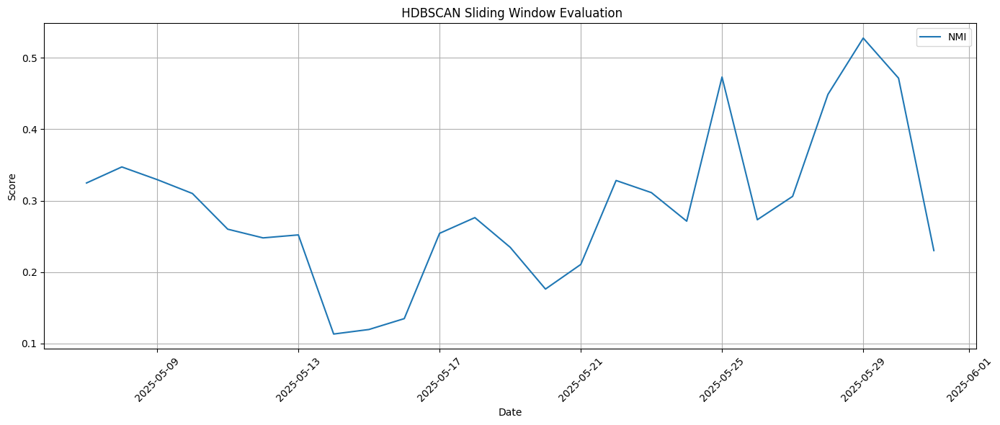

In [ ]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title(" HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


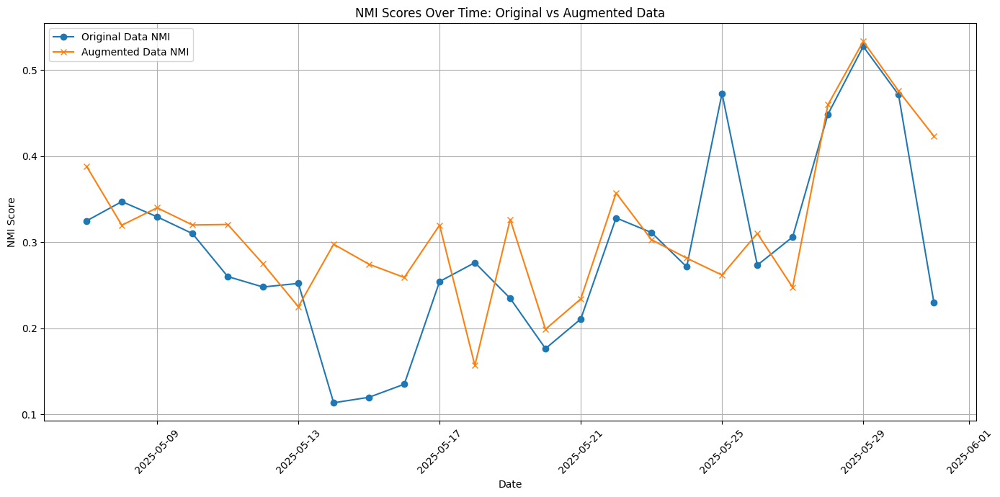

In [ ]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


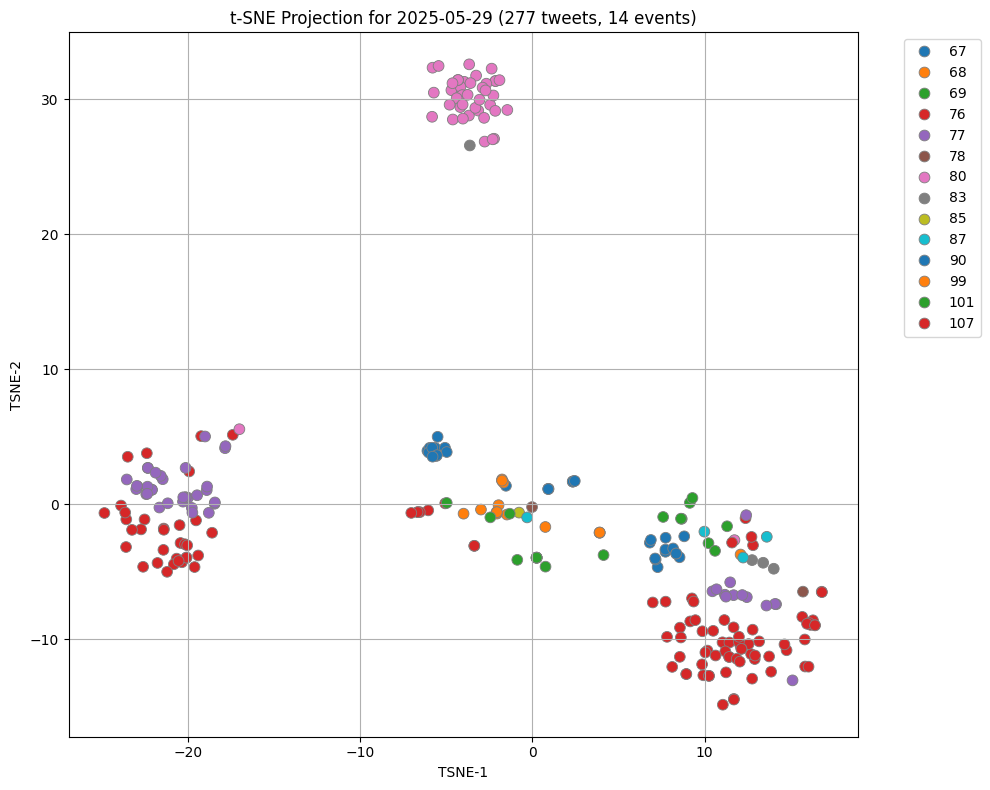

In [ ]:
#@title 🌀 Plot t-SNE of a Message Block with Event Labels
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns

def plot_tsne_message_block(daily_blocks, date_key, title_prefix='t-SNE Projection'):
    """
    Plots t-SNE projection of a daily message block using event labels for coloring.

    Args:
        daily_blocks: dict of daily DataFrames (e.g., `daily_blocks_augmented` or `daily_blocks`)
        date_key: datetime.date (e.g., datetime.date(2025, 5, 9))
        title_prefix: Optional title prefix
    """

    block = daily_blocks.get(date_key)
    if block is None:
        print(f"No block found for {date_key}")
        return

    # Convert embeddings and labels
    embeddings = np.vstack(block['final_embedding'].apply(np.array).values)
    labels = block['event_label'].values

    # Run t-SNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    tsne_proj = tsne.fit_transform(embeddings)

    # Plot
    plt.figure(figsize=(10, 8))
    palette = sns.color_palette('tab10', n_colors=len(set(labels)))
    sns.scatterplot(x=tsne_proj[:, 0], y=tsne_proj[:, 1], hue=labels, palette=palette, legend='full', s=60, edgecolor='gray')
    plt.title(f"{title_prefix} for {date_key} ({len(labels)} tweets, {len(set(labels))} events)")
    plt.xlabel("TSNE-1")
    plt.ylabel("TSNE-2")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.grid(True)
    plt.show()

#  Example usage:
import datetime
plot_tsne_message_block(daily_blocks, datetime.date(2025, 5, 29))  # Change the date to your desired day


In [ ]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_word2vec_v")


Results saved to drive/MyDrive/results/hdbscan_word2vec_v.csv


In [ ]:
#@title Results
models_results = {
    'hdbscan_arabert': sliding_results_original,
    'hdbscan_arabert_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.3247      0.3471      0.3294      0.3100      0.2601      0.2479   
ami       0.2769      0.2736      0.2613      0.2367      0.1682      0.1989   
ari       0.1834      0.1203      0.1540      0.1362      0.0802      0.0730   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.2521      0.1134      0.1197      0.1349  ...      0.3282   
ami       0.2045      0.0733      0.0780      0.0960  ...      0.2744   
ari       0.1279      0.0204      0.0127      0.0192  ...      0.0915   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.3112      0.2713      0.4729      0.2733      0.3060      0.4486   
ami       0.2625      0.2014      0.3873      0.2389      0.2663      0.4072   
ari       0.1127      0.0595      0.1558      0.1110      0.1162      0.2016   

date  2025-05-29  2025

## HDBSCAN + Word2Vec

### tune

In [ ]:

#@title Install & Load Word2Vec Model
!wget https://archive.org/download/AraVec/Twt-CBOW.zip
!unzip Twt-CBOW.zip
from gensim.models import KeyedVectors, Word2Vec


# model = Word2Vec.load('model_full_grams_cbow_300_twitter.mdl')


--2025-07-06 10:32:49--  https://archive.org/download/AraVec/Twt-CBOW.zip
Resolving archive.org (archive.org)... 207.241.224.2
Connecting to archive.org (archive.org)|207.241.224.2|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://ia903205.us.archive.org/28/items/AraVec/Twt-CBOW.zip [following]
--2025-07-06 10:32:50--  https://ia903205.us.archive.org/28/items/AraVec/Twt-CBOW.zip
Resolving ia903205.us.archive.org (ia903205.us.archive.org)... 207.241.234.115
Connecting to ia903205.us.archive.org (ia903205.us.archive.org)|207.241.234.115|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 369123021 (352M) [application/zip]
Saving to: ‘Twt-CBOW.zip.1’

Twt-CBOW.zip.1      100%[===================>] 352.02M  42.0MB/s    in 8.2s    

2025-07-06 10:32:59 (43.0 MB/s) - ‘Twt-CBOW.zip.1’ saved [369123021/369123021]

Archive:  Twt-CBOW.zip
replace Twt-CBOW? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: Twt-CBOW                
repl

In [ ]:
#@title install stanza
# !pip install stanza

In [ ]:
#@title Initialize Stanza Pipeline
# !pip install stanza
import numpy as np
import nltk
import stanza
from gensim.models import KeyedVectors
from nltk.corpus import stopwords

# Download necessary resources (only run once)
nltk.download('stopwords')
stanza.download('ar')

# Load Arabic stopwords from NLTK
ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Initialize Stanza Arabic pipeline for tokenization
nlp = stanza.Pipeline(lang='ar', processors='tokenize,pos,lemma', tokenize_no_ssplit=True)

# Tokenization function
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]

# Tweet embedding function using FastText + Stanza + NLTK stopwords
def embed_tweet(text, model):
    tokens = stanza_tokenize(text)
    # Remove stopwords
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    # Embed
    vectors = [model[token] for token in filtered_tokens if token in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Downloading default packages for language: ar (Arabic) ...
INFO:stanza:File exists: /root/stanza_resources/ar/default.zip
INFO:stanza:Finished downloading models and saved to /root/stanza_resources
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package       |
-----------------------------
| tokenize  | padt          |
| mwt       | padt          |
| pos       | padt_charlm   |
| lemma     | padt_nocharlm |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Loading: pos
INFO:stanza:Loading: lemma
INFO:stanza:Done loading processors!


In [ ]:
#@title Load the model

from gensim.models import KeyedVectors

# model = KeyedVectors.load_word2vec_format('Twitter-CBOW.bin', binary=True)
model = KeyedVectors.load('Twt-CBOW') # word2vec_model



In [ ]:
#@title Embeddding the Tweets
from tqdm.notebook import tqdm
import numpy as np

def embed_tweet(text, word_vectors):
    tokens = stanza_tokenize(text)
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    vectors = [word_vectors[token] for token in filtered_tokens if token in word_vectors]
    if not vectors:
        return np.zeros(word_vectors.vector_size)
    return np.mean(vectors, axis=0)

# Use model.wv, not model
word_vectors = model.wv

tweets = df['Tweet Text'].tolist()
embeddings = np.array([
    embed_tweet(text, word_vectors) for text in tqdm(tweets)
])


  0%|          | 0/6998 [00:00<?, ?it/s]

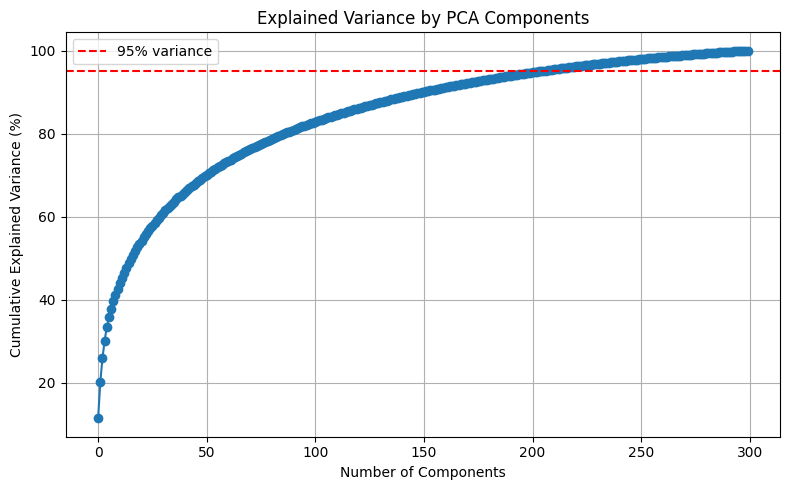


Number of components to retain 95% variance: 204


In [ ]:
#@title best dim
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [ ]:
#@title reduce dim
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 204

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 300)
Reduced shape: (6998, 204)


In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
df['word2vec_embeddings'] = reduced_embeddings.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


In [ ]:
#@title 📦 Load and Concatenate Word2Vec + Named Entity PCA Embeddings
import ast
import numpy as np

# Helper to safely convert stringified lists
def safe_literal_eval(val):
    if isinstance(val, str):
        return ast.literal_eval(val)
    return val

# Apply to all embedding columns
embedding_cols = ['word2vec_embeddings']

for col in embedding_cols:
    tuning_df[col] = tuning_df[col].apply(safe_literal_eval)
    evaluation_df[col] = evaluation_df[col].apply(safe_literal_eval)



# Convert to NumPy arrays and concatenate
tuning_word2vec = np.vstack(tuning_df['word2vec_embeddings'].apply(np.array).values)

evaluation_word2vec = np.vstack(evaluation_df['word2vec_embeddings'].apply(np.array).values)


# Final combined embeddings
tuning_embeddings = np.hstack([tuning_word2vec]) #  tuning_per, tuning_org, tuning_loc
evaluation_embeddings = np.hstack([evaluation_word2vec])# evaluation_per, evaluation_org, evaluation_loc

# Shape summary
print(f"🧪 Tuning embeddings shape    : {tuning_embeddings.shape}")
print(f"📈 Evaluation embeddings shape: {evaluation_embeddings.shape}")


🧪 Tuning embeddings shape    : (1122, 204)
📈 Evaluation embeddings shape: (9309, 204)


### online

In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df,
    embedding_column='word2vec_embeddings'
)


Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:03<00:00,  7.63it/s]


In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df_aug,
    embedding_column='word2vec_embeddings'
)

Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:02<00:00, 11.08it/s]


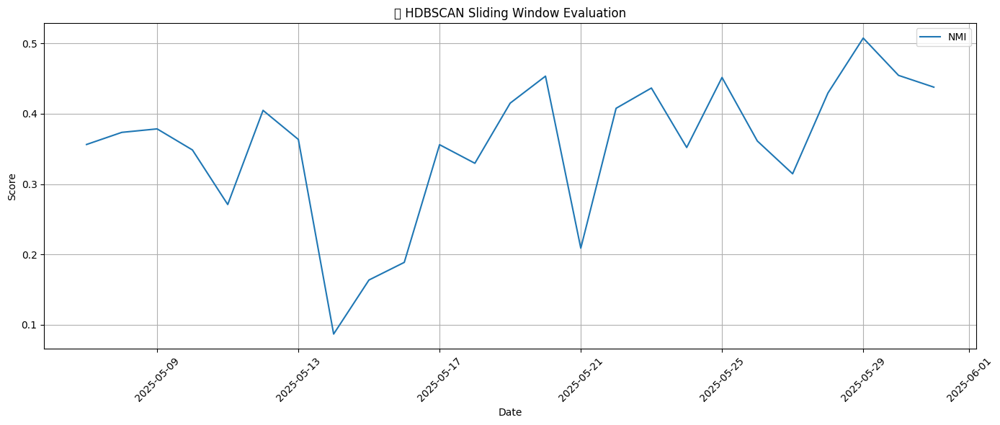

In [ ]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title("📊 HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


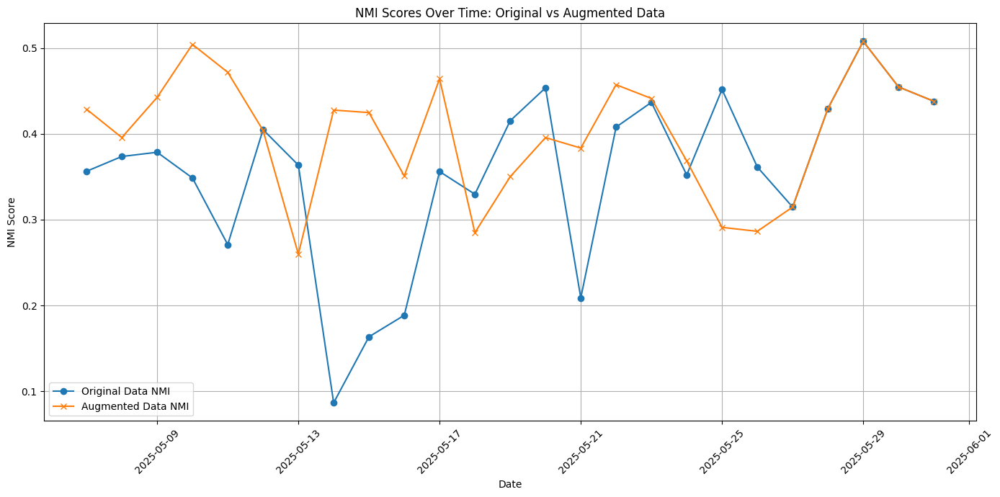

In [ ]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


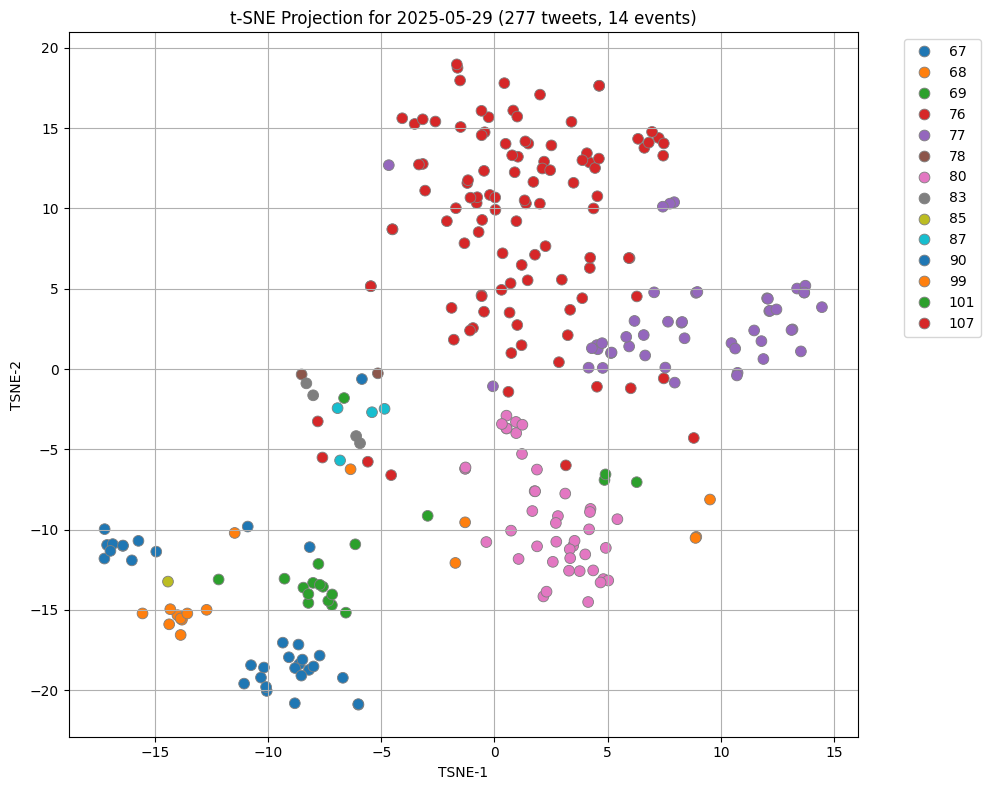

In [ ]:
#@title 🌀 Plot t-SNE of a Message Block with Event Labels
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns

def plot_tsne_message_block(daily_blocks, date_key, title_prefix='t-SNE Projection'):
    """
    Plots t-SNE projection of a daily message block using event labels for coloring.

    Args:
        daily_blocks: dict of daily DataFrames (e.g., `daily_blocks_augmented` or `daily_blocks`)
        date_key: datetime.date (e.g., datetime.date(2025, 5, 9))
        title_prefix: Optional title prefix
    """

    block = daily_blocks.get(date_key)
    if block is None:
        print(f"No block found for {date_key}")
        return

    # Convert embeddings and labels
    embeddings = np.vstack(block['fasttext_embeddings'].apply(np.array).values)
    labels = block['event_label'].values

    # Run t-SNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    tsne_proj = tsne.fit_transform(embeddings)

    # Plot
    plt.figure(figsize=(10, 8))
    palette = sns.color_palette('tab10', n_colors=len(set(labels)))
    sns.scatterplot(x=tsne_proj[:, 0], y=tsne_proj[:, 1], hue=labels, palette=palette, legend='full', s=60, edgecolor='gray')
    plt.title(f"{title_prefix} for {date_key} ({len(labels)} tweets, {len(set(labels))} events)")
    plt.xlabel("TSNE-1")
    plt.ylabel("TSNE-2")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.grid(True)
    plt.show()

#  Example usage:
import datetime
plot_tsne_message_block(daily_blocks, datetime.date(2025, 5, 29))  # Change the date to your desired day


In [ ]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_word2vec")


Results saved to drive/MyDrive/results/hdbscan_word2vec.csv


In [ ]:
#@title Results
models_results = {
    'hdbscan_arabert': sliding_results_original,
    'hdbscan_arabert_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.3563      0.3736      0.3785      0.3485      0.2709      0.4048   
ami       0.2988      0.3108      0.3140      0.2814      0.1680      0.3458   
ari       0.1152      0.1240      0.1321      0.1112     -0.0361      0.0761   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.3635      0.0866      0.1635      0.1886  ...      0.4078   
ami       0.3177      0.0710      0.1176      0.1582  ...      0.3506   
ari       0.1200      0.1569      0.0386      0.0183  ...      0.0815   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.4366      0.3520      0.4517      0.3613      0.3146      0.4295   
ami       0.3775      0.2739      0.3833      0.2971      0.2707      0.3871   
ari       0.0962      0.0841      0.0767      0.0886      0.0994      0.1312   

date  2025-05-29  2025

# FastText

## HDBSCAN + FastText + Named Entities +Splited

### tune

In [ ]:
#@title Install Fast Text Model
# !pip install fasttext
!wget https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
!gunzip cc.ar.300.vec.gz


--2025-07-06 07:38:07--  https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.167.112.53, 3.167.112.129, 3.167.112.51, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.167.112.53|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1272365870 (1.2G) [binary/octet-stream]
Saving to: ‘cc.ar.300.vec.gz’

cc.ar.300.vec.gz    100%[===================>]   1.18G  18.0MB/s    in 47s     

2025-07-06 07:38:54 (26.0 MB/s) - ‘cc.ar.300.vec.gz’ saved [1272365870/1272365870]



In [ ]:
#@title install stanza
# !pip install stanza

In [ ]:
#@title Initialize Stanza Pipeline
# !pip install stanza
import numpy as np
import nltk
import stanza
from gensim.models import KeyedVectors
from nltk.corpus import stopwords

# Download necessary resources (only run once)
nltk.download('stopwords')
stanza.download('ar')

# Load Arabic stopwords from NLTK
ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Initialize Stanza Arabic pipeline for tokenization
nlp = stanza.Pipeline(lang='ar', processors='tokenize,pos,lemma', tokenize_no_ssplit=True)

# Tokenization function
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]

# Tweet embedding function using FastText + Stanza + NLTK stopwords
def embed_tweet(text, model):
    tokens = stanza_tokenize(text)
    # Remove stopwords
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    # Embed
    vectors = [model[token] for token in filtered_tokens if token in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Downloading default packages for language: ar (Arabic) ...
INFO:stanza:File exists: /root/stanza_resources/ar/default.zip
INFO:stanza:Finished downloading models and saved to /root/stanza_resources
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package       |
-----------------------------
| tokenize  | padt          |
| mwt       | padt          |
| pos       | padt_charlm   |
| lemma     | padt_nocharlm |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Loading: pos
INFO:stanza:Loading: lemma
INFO:stanza:Done loading processors!


In [ ]:
#@title Load the model

from gensim.models import KeyedVectors

# Load the .vec file (pre-trained FastText embeddings in text format)
fasttext_model = KeyedVectors.load_word2vec_format('cc.ar.300.vec', binary=False, encoding='utf-8')


In [ ]:
#@title Embeddding the Tweets
from tqdm.notebook import tqdm
import numpy as np

def embed_tweet(text, word_vectors):
    tokens = stanza_tokenize(text)
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    vectors = [word_vectors[token] for token in filtered_tokens if token in word_vectors]
    if not vectors:
        return np.zeros(word_vectors.vector_size)
    return np.mean(vectors, axis=0)

# Use model.wv, not model
word_vectors = model.wv
# fasttext_model=fasttext_model.wv
tweets = df['Tweet Text'].tolist()
embeddings = np.array([
    embed_tweet(text, fasttext_model) for text in tqdm(tweets)
])


  0%|          | 0/6998 [00:00<?, ?it/s]

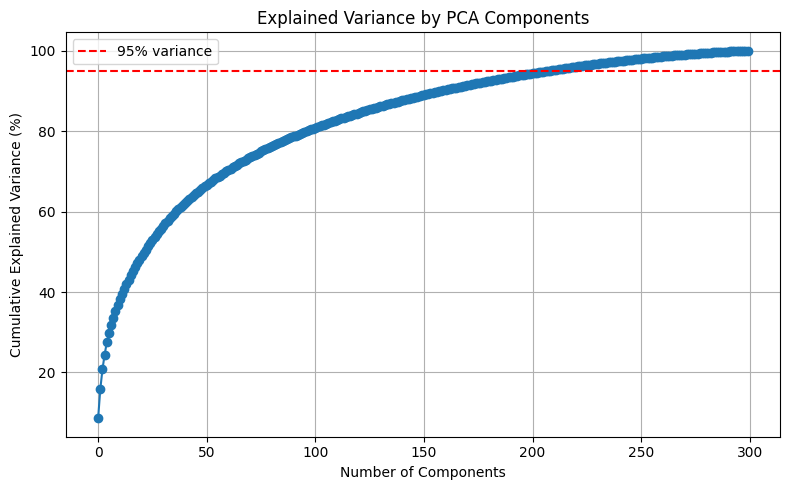


Number of components to retain 95% variance: 209


In [ ]:
#@title best dim
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [ ]:
#@title reduce dim
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 209

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 300)
Reduced shape: (6998, 209)


In [ ]:
#@title Embedding the Named Entities

if isinstance(df['Named Entities'].iloc[0], str):
    df['Named Entities'] = df['Named Entities'].apply(eval)

if isinstance(df['Hashtags'].iloc[0], str):
    df['Hashtags'] = df['Hashtags'].apply(eval)

if isinstance(df['PER'].iloc[0], str):
    df['PER'] = df['PER'].apply(eval)

if isinstance(df['ORG'].iloc[0], str):
    df['ORG'] = df['ORG'].apply(eval)

if isinstance(df['LOC'].iloc[0], str):
    df['LOC'] = df['LOC'].apply(eval)

#@title 🧠 Embedding Named Entities Using Word2Vec

from tqdm.notebook import tqdm
import numpy as np

# --- Step 1: Ensure lists are parsed correctly ---
columns_to_eval = ['Named Entities', 'PER', 'ORG', 'LOC']
for col in columns_to_eval:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

# --- Step 2: Define embed function using Word2Vec ---
def embed_tokens(tokens, word_vectors):
    filtered = [token for token in tokens if token not in ARABIC_STOPWORDS]
    vectors = [word_vectors[token] for token in filtered if token in word_vectors]
    if not vectors:
        return np.zeros(word_vectors.vector_size)
    return np.mean(vectors, axis=0)

named_entities_embedding = df['Named Entities'].apply(lambda x: embed_tokens(x, fasttext_model))
PER_embedding = df['PER'].apply(lambda x: embed_tokens(x, fasttext_model))
ORG_embedding = df['ORG'].apply(lambda x: embed_tokens(x, fasttext_model))
LOC_embedding = df['LOC'].apply(lambda x: embed_tokens(x, fasttext_model))


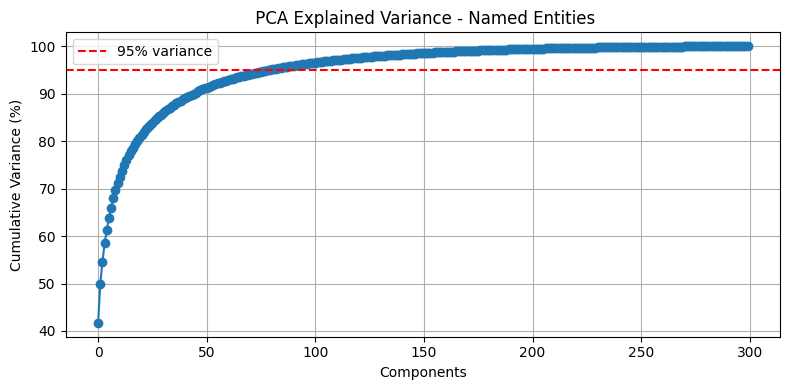

✅ Named Entities: 80 components retain 95% variance


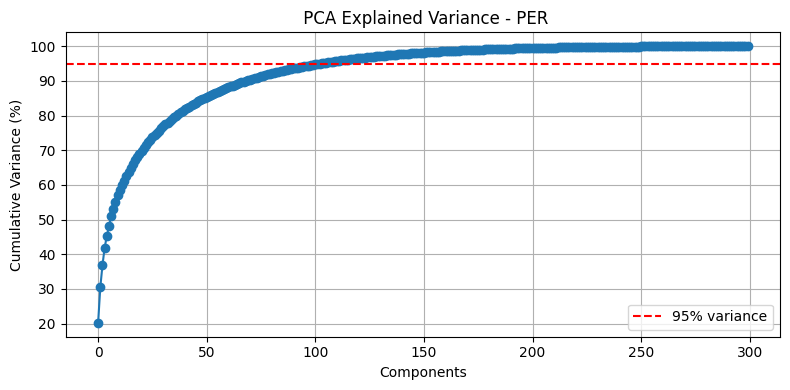

✅ PER: 104 components retain 95% variance


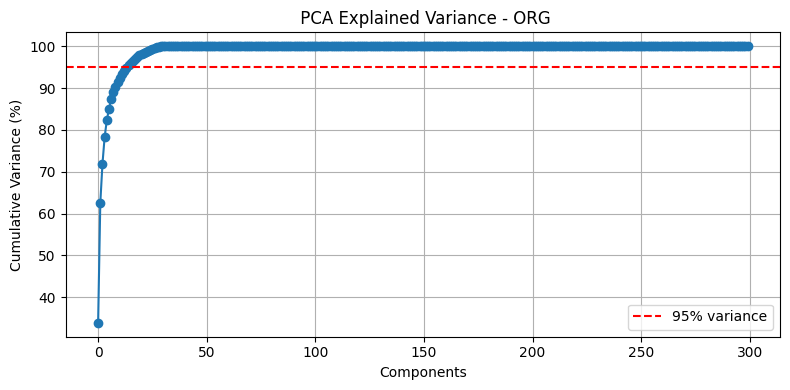

✅ ORG: 15 components retain 95% variance


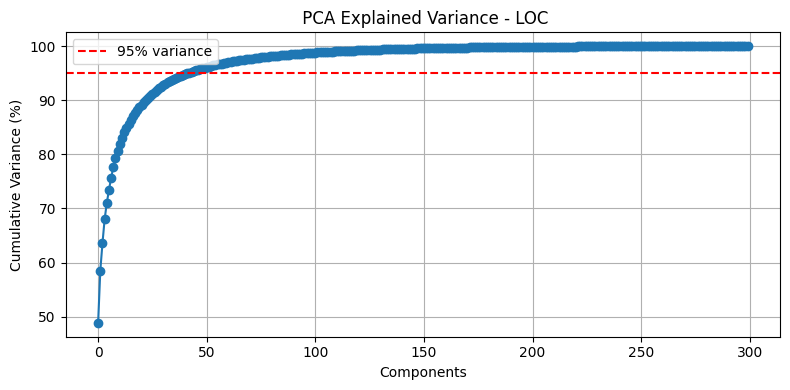

✅ LOC: 43 components retain 95% variance

🧠 PCA-reduced embeddings added to dataframe.


In [ ]:
#@title PCA Reduction on Named Entity Embeddings

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Convert Series of vectors to arrays
ne_array = np.vstack(named_entities_embedding.values)
per_array = np.vstack(PER_embedding.values)
org_array = np.vstack(ORG_embedding.values)
loc_array = np.vstack(LOC_embedding.values)

def reduce_with_pca(name, X, threshold=0.95):
    pca = PCA()
    pca.fit(X)

    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_variance >= threshold) + 1

    # Plot explained variance
    plt.figure(figsize=(8, 4))
    plt.plot(cumulative_variance * 100, marker='o')
    plt.axhline(y=threshold * 100, color='red', linestyle='--', label=f'{int(threshold * 100)}% variance')
    plt.title(f' PCA Explained Variance - {name}')
    plt.xlabel('Components')
    plt.ylabel('Cumulative Variance (%)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"✅ {name}: {n_components} components retain {int(threshold*100)}% variance")

    # Final reduction
    reduced = PCA(n_components=n_components).fit_transform(X)
    return reduced

# Apply PCA
named_entities_reduced = reduce_with_pca("Named Entities", ne_array)
per_reduced = reduce_with_pca("PER", per_array)
org_reduced = reduce_with_pca("ORG", org_array)
loc_reduced = reduce_with_pca("LOC", loc_array)

# Save to DataFrame
df['NamedEntities_PCA'] = named_entities_reduced.tolist()
df['PER_PCA'] = per_reduced.tolist()
df['ORG_PCA'] = org_reduced.tolist()
df['LOC_PCA'] = loc_reduced.tolist()

# Confirm
print("\n🧠 PCA-reduced embeddings added to dataframe.")


In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
df['fasttext_embeddings'] = reduced_embeddings.tolist()
import numpy as np

# Convert each PCA column to a NumPy array
named = np.vstack(df['NamedEntities_PCA'].apply(np.array).values)
per   = np.vstack(df['PER_PCA'].apply(np.array).values)
org   = np.vstack(df['ORG_PCA'].apply(np.array).values)
loc   = np.vstack(df['LOC_PCA'].apply(np.array).values)

# Concatenate horizontally
final_embeddings = np.hstack([reduced_embeddings, per, org, loc])#,

# Store back into df
df['final_embedding'] = list(final_embeddings)

# ✅ Confirm
print("🎯 Final embedding column shape per row:", final_embeddings[0].shape)
print("📦 Final embedding column added to df.")

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


🎯 Final embedding column shape per row: (371,)
📦 Final embedding column added to df.


In [ ]:
#@title 📦 Load and Concatenate FastText + Named Entity PCA Embeddings
# import ast
# import numpy as np

# # Helper to safely convert stringified lists
# def safe_literal_eval(val):
#     if isinstance(val, str):
#         return ast.literal_eval(val)
#     return val

# # Apply to all embedding columns
# embedding_cols = ['fasttext_embeddings','NamedEntities_PCA', 'PER_PCA', 'ORG_PCA', 'LOC_PCA']

# for col in embedding_cols:
#     tuning_df[col] = tuning_df[col].apply(safe_literal_eval)
#     evaluation_df[col] = evaluation_df[col].apply(safe_literal_eval)



# # Convert to NumPy arrays and concatenate
# tuning_word2vec = np.vstack(tuning_df['fasttext_embeddings'].apply(np.array).values)


# # Convert to NumPy arrays and concatenate
# tuning_per = np.vstack(tuning_df['PER_PCA'].apply(np.array).values)
# tuning_org = np.vstack(tuning_df['ORG_PCA'].apply(np.array).values)
# tuning_loc = np.vstack(tuning_df['LOC_PCA'].apply(np.array).values)
# tuning_named_entities = np.vstack(tuning_df['NamedEntities_PCA'].apply(np.array).values)




# evaluation_per = np.vstack(evaluation_df['PER_PCA'].apply(np.array).values)

# evaluation_org = np.vstack(evaluation_df['ORG_PCA'].apply(np.array).values)
# evaluation_loc = np.vstack(evaluation_df['LOC_PCA'].apply(np.array).values)
# evaluation_named_entities = np.vstack(evaluation_df['NamedEntities_PCA'].apply(np.array).values)

# evaluation_word2vec = np.vstack(evaluation_df['fasttext_embeddings'].apply(np.array).values)


# # Final combined embeddings
# tuning_embeddings = np.hstack([tuning_word2vec,tuning_named_entities]) #  tuning_per, tuning_org, tuning_loc
# evaluation_embeddings = np.hstack([evaluation_word2vec,evaluation_named_entities])# evaluation_per, evaluation_org, evaluation_loc
# # Add to tuning_df
# tuning_df['final_embedding'] = list(tuning_embeddings)
# tuning_df_aug=list(tuning_embeddings)
# # Add to evaluation_df
# evaluation_df['final_embedding'] = list(evaluation_embeddings)
# evaluation_df_aug
# # Shape summary
# print(f"🧪 Tuning embeddings shape    : {tuning_embeddings.shape}")
# print(f"📈 Evaluation embeddings shape: {evaluation_embeddings.shape}")


🧪 Tuning embeddings shape    : (1122, 289)
📈 Evaluation embeddings shape: (9309, 289)


In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df,
    embedding_column='final_embedding'
)


Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:02<00:00, 11.40it/s]


In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df_aug,
    embedding_column='final_embedding'
)

Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:02<00:00, 10.79it/s]


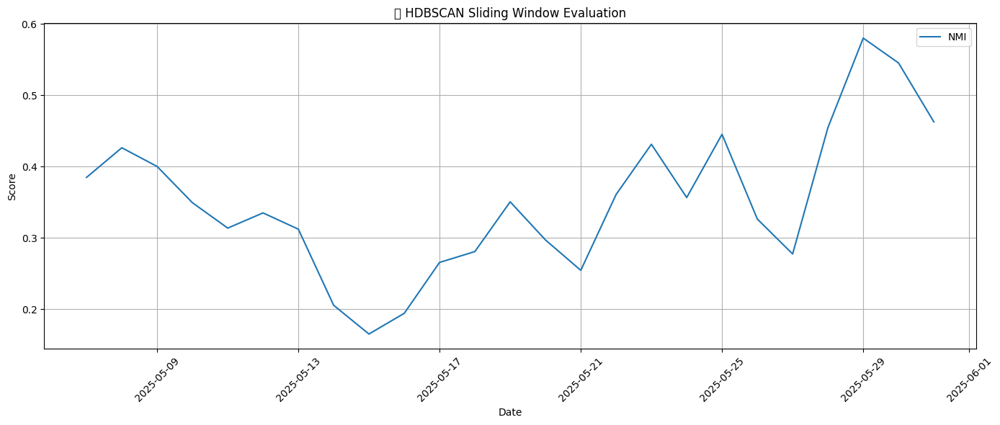

In [ ]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title("📊 HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


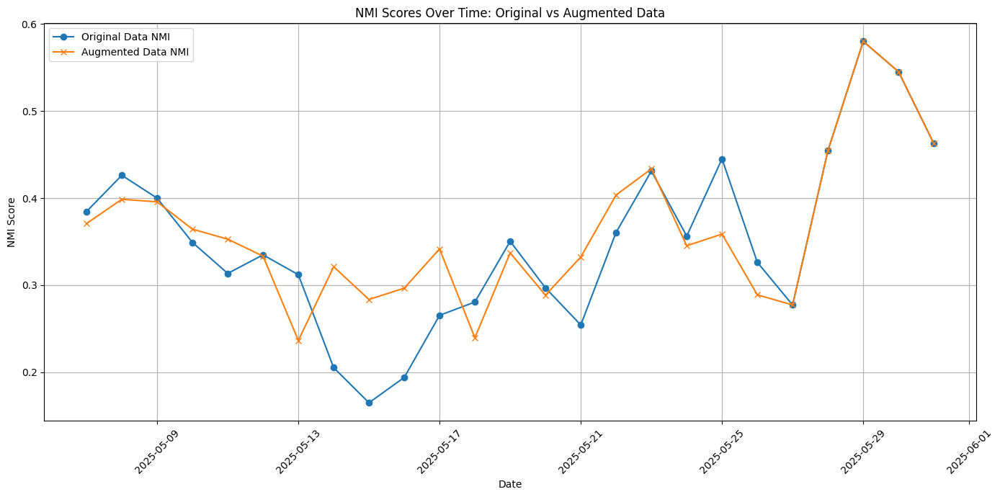

In [ ]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


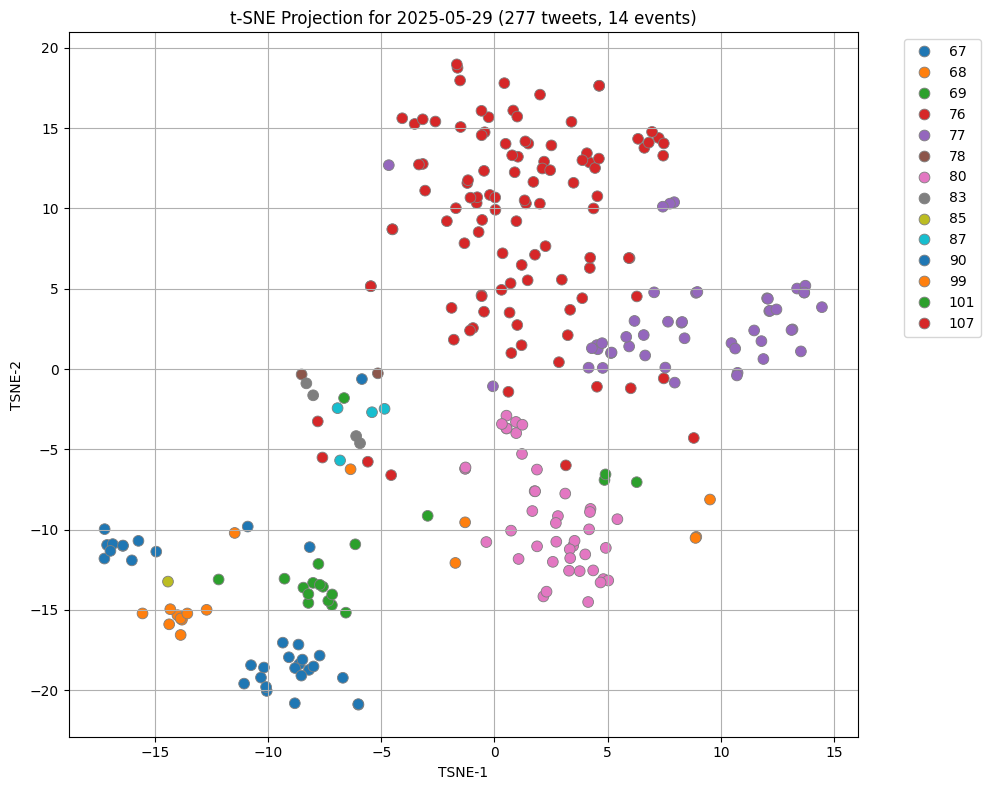

In [ ]:
#@title 🌀 Plot t-SNE of a Message Block with Event Labels
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns

def plot_tsne_message_block(daily_blocks, date_key, title_prefix='t-SNE Projection'):
    """
    Plots t-SNE projection of a daily message block using event labels for coloring.

    Args:
        daily_blocks: dict of daily DataFrames (e.g., `daily_blocks_augmented` or `daily_blocks`)
        date_key: datetime.date (e.g., datetime.date(2025, 5, 9))
        title_prefix: Optional title prefix
    """

    block = daily_blocks.get(date_key)
    if block is None:
        print(f"No block found for {date_key}")
        return

    # Convert embeddings and labels
    embeddings = np.vstack(block['fasttext_embeddings'].apply(np.array).values)
    labels = block['event_label'].values

    # Run t-SNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    tsne_proj = tsne.fit_transform(embeddings)

    # Plot
    plt.figure(figsize=(10, 8))
    palette = sns.color_palette('tab10', n_colors=len(set(labels)))
    sns.scatterplot(x=tsne_proj[:, 0], y=tsne_proj[:, 1], hue=labels, palette=palette, legend='full', s=60, edgecolor='gray')
    plt.title(f"{title_prefix} for {date_key} ({len(labels)} tweets, {len(set(labels))} events)")
    plt.xlabel("TSNE-1")
    plt.ylabel("TSNE-2")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.grid(True)
    plt.show()

#  Example usage:
import datetime
plot_tsne_message_block(daily_blocks, datetime.date(2025, 5, 29))  # Change the date to your desired day


In [ ]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_fasttext_splited")


Results saved to drive/MyDrive/results/hdbscan_fasttext_splited.csv


In [ ]:
#@title Results
models_results = {
    'hdbscan_arabert': sliding_results_original,
    'hdbscan_arabert_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.3847      0.4263      0.4000      0.3492      0.3136      0.3349   
ami       0.3359      0.3717      0.3435      0.2526      0.2072      0.2637   
ari       0.1706      0.2331      0.2275      0.0930      0.0599      0.0618   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.3121      0.2053      0.1649      0.1940  ...      0.3607   
ami       0.2547      0.1555      0.1182      0.1426  ...      0.2990   
ari       0.0882      0.0229      0.0052      0.0029  ...      0.0963   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.4312      0.3565      0.4452      0.3263      0.2773      0.4546   
ami       0.3637      0.2906      0.3417      0.2684      0.2304      0.4033   
ari       0.1756      0.1096      0.0965      0.1084      0.0944      0.1803   

date  2025-05-29  2025

## HDBSCAN + FastText + Named Entities

### tune

In [ ]:
#@title Install Fast Text Model
# !pip install fasttext
!wget https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
!gunzip cc.ar.300.vec.gz


--2025-07-06 07:38:07--  https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.167.112.53, 3.167.112.129, 3.167.112.51, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.167.112.53|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1272365870 (1.2G) [binary/octet-stream]
Saving to: ‘cc.ar.300.vec.gz’

cc.ar.300.vec.gz    100%[===================>]   1.18G  18.0MB/s    in 47s     

2025-07-06 07:38:54 (26.0 MB/s) - ‘cc.ar.300.vec.gz’ saved [1272365870/1272365870]



In [ ]:
#@title install stanza
# !pip install stanza

In [ ]:
#@title Initialize Stanza Pipeline
# !pip install stanza
import numpy as np
import nltk
import stanza
from gensim.models import KeyedVectors
from nltk.corpus import stopwords

# Download necessary resources (only run once)
nltk.download('stopwords')
stanza.download('ar')

# Load Arabic stopwords from NLTK
ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Initialize Stanza Arabic pipeline for tokenization
nlp = stanza.Pipeline(lang='ar', processors='tokenize,pos,lemma', tokenize_no_ssplit=True)

# Tokenization function
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]

# Tweet embedding function using FastText + Stanza + NLTK stopwords
def embed_tweet(text, model):
    tokens = stanza_tokenize(text)
    # Remove stopwords
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    # Embed
    vectors = [model[token] for token in filtered_tokens if token in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Downloading default packages for language: ar (Arabic) ...
INFO:stanza:File exists: /root/stanza_resources/ar/default.zip
INFO:stanza:Finished downloading models and saved to /root/stanza_resources
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package       |
-----------------------------
| tokenize  | padt          |
| mwt       | padt          |
| pos       | padt_charlm   |
| lemma     | padt_nocharlm |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Loading: pos
INFO:stanza:Loading: lemma
INFO:stanza:Done loading processors!


In [ ]:
#@title Load the model

from gensim.models import KeyedVectors

# Load the .vec file (pre-trained FastText embeddings in text format)
fasttext_model = KeyedVectors.load_word2vec_format('cc.ar.300.vec', binary=False, encoding='utf-8')


In [ ]:
#@title Embeddding the Tweets
from tqdm.notebook import tqdm
import numpy as np

def embed_tweet(text, word_vectors):
    tokens = stanza_tokenize(text)
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    vectors = [word_vectors[token] for token in filtered_tokens if token in word_vectors]
    if not vectors:
        return np.zeros(word_vectors.vector_size)
    return np.mean(vectors, axis=0)

# Use model.wv, not model
word_vectors = model.wv
# fasttext_model=fasttext_model.wv
tweets = df['Tweet Text'].tolist()
embeddings = np.array([
    embed_tweet(text, fasttext_model) for text in tqdm(tweets)
])


  0%|          | 0/6998 [00:00<?, ?it/s]

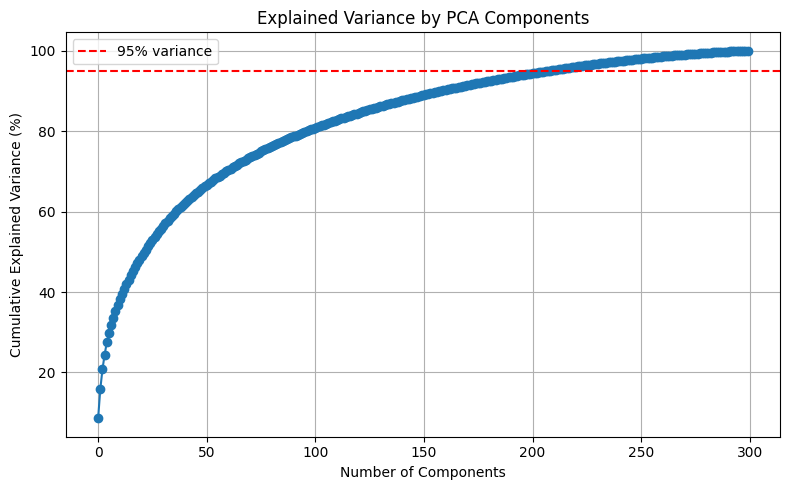


Number of components to retain 95% variance: 209


In [ ]:
#@title best dim
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [ ]:
#@title reduce dim
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 209

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 300)
Reduced shape: (6998, 209)


In [ ]:
#@title Embedding the Named Entities

if isinstance(df['Named Entities'].iloc[0], str):
    df['Named Entities'] = df['Named Entities'].apply(eval)

if isinstance(df['Hashtags'].iloc[0], str):
    df['Hashtags'] = df['Hashtags'].apply(eval)

if isinstance(df['PER'].iloc[0], str):
    df['PER'] = df['PER'].apply(eval)

if isinstance(df['ORG'].iloc[0], str):
    df['ORG'] = df['ORG'].apply(eval)

if isinstance(df['LOC'].iloc[0], str):
    df['LOC'] = df['LOC'].apply(eval)

#@title 🧠 Embedding Named Entities Using Word2Vec

from tqdm.notebook import tqdm
import numpy as np

# --- Step 1: Ensure lists are parsed correctly ---
columns_to_eval = ['Named Entities', 'PER', 'ORG', 'LOC']
for col in columns_to_eval:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

# --- Step 2: Define embed function using Word2Vec ---
def embed_tokens(tokens, word_vectors):
    filtered = [token for token in tokens if token not in ARABIC_STOPWORDS]
    vectors = [word_vectors[token] for token in filtered if token in word_vectors]
    if not vectors:
        return np.zeros(word_vectors.vector_size)
    return np.mean(vectors, axis=0)

named_entities_embedding = df['Named Entities'].apply(lambda x: embed_tokens(x, fasttext_model))
PER_embedding = df['PER'].apply(lambda x: embed_tokens(x, fasttext_model))
ORG_embedding = df['ORG'].apply(lambda x: embed_tokens(x, fasttext_model))
LOC_embedding = df['LOC'].apply(lambda x: embed_tokens(x, fasttext_model))


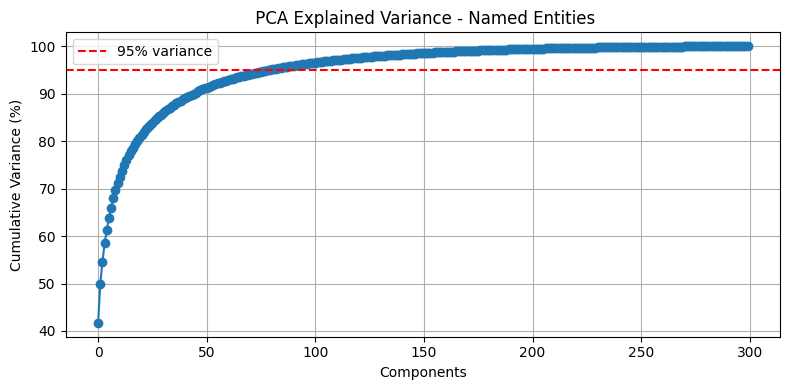

✅ Named Entities: 80 components retain 95% variance


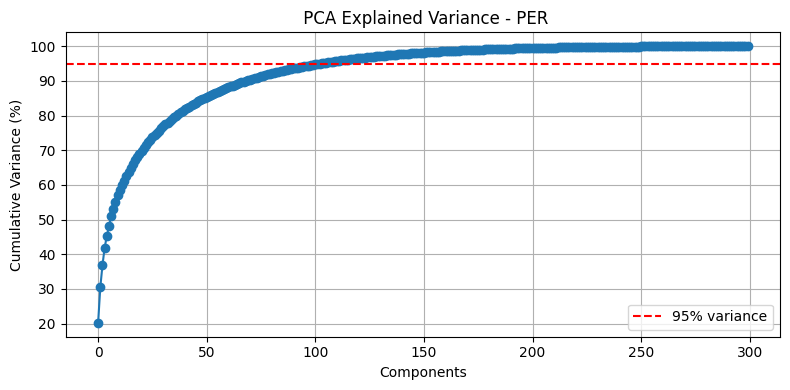

✅ PER: 104 components retain 95% variance


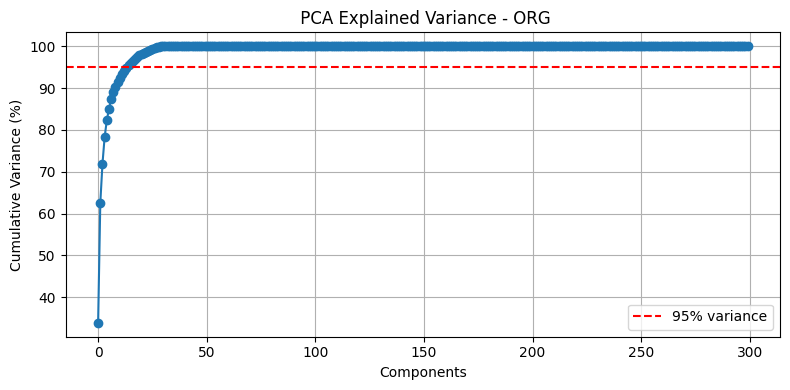

✅ ORG: 15 components retain 95% variance


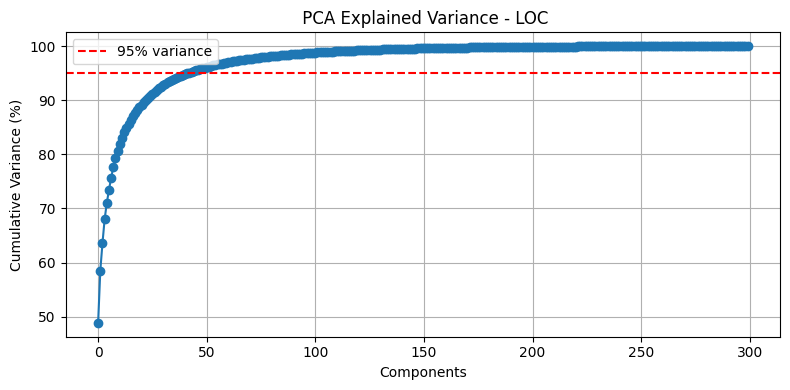

✅ LOC: 43 components retain 95% variance

🧠 PCA-reduced embeddings added to dataframe.


In [ ]:
#@title PCA Reduction on Named Entity Embeddings

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Convert Series of vectors to arrays
ne_array = np.vstack(named_entities_embedding.values)
per_array = np.vstack(PER_embedding.values)
org_array = np.vstack(ORG_embedding.values)
loc_array = np.vstack(LOC_embedding.values)

def reduce_with_pca(name, X, threshold=0.95):
    pca = PCA()
    pca.fit(X)

    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_variance >= threshold) + 1

    # Plot explained variance
    plt.figure(figsize=(8, 4))
    plt.plot(cumulative_variance * 100, marker='o')
    plt.axhline(y=threshold * 100, color='red', linestyle='--', label=f'{int(threshold * 100)}% variance')
    plt.title(f' PCA Explained Variance - {name}')
    plt.xlabel('Components')
    plt.ylabel('Cumulative Variance (%)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"✅ {name}: {n_components} components retain {int(threshold*100)}% variance")

    # Final reduction
    reduced = PCA(n_components=n_components).fit_transform(X)
    return reduced

# Apply PCA
named_entities_reduced = reduce_with_pca("Named Entities", ne_array)
per_reduced = reduce_with_pca("PER", per_array)
org_reduced = reduce_with_pca("ORG", org_array)
loc_reduced = reduce_with_pca("LOC", loc_array)

# Save to DataFrame
df['NamedEntities_PCA'] = named_entities_reduced.tolist()
df['PER_PCA'] = per_reduced.tolist()
df['ORG_PCA'] = org_reduced.tolist()
df['LOC_PCA'] = loc_reduced.tolist()

# Confirm
print("\n🧠 PCA-reduced embeddings added to dataframe.")


In [ ]:
#@title 📦 Load and Concatenate Word2Vec + Named Entity PCA Embeddings
# import ast
# import numpy as np

# # Helper to safely convert stringified lists
# def safe_literal_eval(val):
#     if isinstance(val, str):
#         return ast.literal_eval(val)
#     return val

# # Apply to all embedding columns
# embedding_cols = ['word2vec_embeddings',]

# for col in embedding_cols:
#     tuning_df[col] = tuning_df[col].apply(safe_literal_eval)
#     evaluation_df[col] = evaluation_df[col].apply(safe_literal_eval)



# # Convert to NumPy arrays and concatenate
# tuning_word2vec = np.vstack(tuning_df['word2vec_embeddings'].apply(np.array).values)
# tuning_per = np.vstack(tuning_df['PER_PCA'].apply(np.array).values)
# tuning_org = np.vstack(tuning_df['ORG_PCA'].apply(np.array).values)
# tuning_loc = np.vstack(tuning_df['LOC_PCA'].apply(np.array).values)
# tuning_named_entities = np.vstack(tuning_df['NamedEntities_PCA'].apply(np.array).values)

# evaluation_word2vec = np.vstack(evaluation_df['word2vec_embeddings'].apply(np.array).values)
# evaluation_per = np.vstack(evaluation_df['PER_PCA'].apply(np.array).values)
# evaluation_org = np.vstack(evaluation_df['ORG_PCA'].apply(np.array).values)
# evaluation_loc = np.vstack(evaluation_df['LOC_PCA'].apply(np.array).values)
# evaluation_named_entities = np.vstack(evaluation_df['NamedEntities_PCA'].apply(np.array).values)


# # Final combined embeddings
# tuning_embeddings = np.hstack([tuning_word2vec,tuning_named_entities]) #  tuning_per, tuning_org, tuning_loc
# evaluation_embeddings = np.hstack([evaluation_word2vec,evaluation_named_entities])# evaluation_per, evaluation_org, evaluation_loc

# # Shape summary
# print(f"🧪 Tuning embeddings shape    : {tuning_embeddings.shape}")
# print(f"📈 Evaluation embeddings shape: {evaluation_embeddings.shape}")


🧪 Tuning embeddings shape    : (1122, 251)
📈 Evaluation embeddings shape: (9309, 251)


In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
df['fasttext_embeddings'] = reduced_embeddings.tolist()
import numpy as np

# Convert each PCA column to a NumPy array
named = np.vstack(df['NamedEntities_PCA'].apply(np.array).values)
per   = np.vstack(df['PER_PCA'].apply(np.array).values)
org   = np.vstack(df['ORG_PCA'].apply(np.array).values)
loc   = np.vstack(df['LOC_PCA'].apply(np.array).values)

# Concatenate horizontally
final_embeddings = np.hstack([reduced_embeddings,named])#, per, org, loc

# Store back into df
df['final_embedding'] = list(final_embeddings)

# ✅ Confirm
print("🎯 Final embedding column shape per row:", final_embeddings[0].shape)
print("📦 Final embedding column added to df.")

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


🎯 Final embedding column shape per row: (289,)
📦 Final embedding column added to df.


In [ ]:
#@title 📦 Load and Concatenate FastText + Named Entity PCA Embeddings
# import ast
# import numpy as np

# # Helper to safely convert stringified lists
# def safe_literal_eval(val):
#     if isinstance(val, str):
#         return ast.literal_eval(val)
#     return val

# # Apply to all embedding columns
# embedding_cols = ['fasttext_embeddings','NamedEntities_PCA', 'PER_PCA', 'ORG_PCA', 'LOC_PCA']

# for col in embedding_cols:
#     tuning_df[col] = tuning_df[col].apply(safe_literal_eval)
#     evaluation_df[col] = evaluation_df[col].apply(safe_literal_eval)



# # Convert to NumPy arrays and concatenate
# tuning_word2vec = np.vstack(tuning_df['fasttext_embeddings'].apply(np.array).values)


# # Convert to NumPy arrays and concatenate
# tuning_per = np.vstack(tuning_df['PER_PCA'].apply(np.array).values)
# tuning_org = np.vstack(tuning_df['ORG_PCA'].apply(np.array).values)
# tuning_loc = np.vstack(tuning_df['LOC_PCA'].apply(np.array).values)
# tuning_named_entities = np.vstack(tuning_df['NamedEntities_PCA'].apply(np.array).values)




# evaluation_per = np.vstack(evaluation_df['PER_PCA'].apply(np.array).values)

# evaluation_org = np.vstack(evaluation_df['ORG_PCA'].apply(np.array).values)
# evaluation_loc = np.vstack(evaluation_df['LOC_PCA'].apply(np.array).values)
# evaluation_named_entities = np.vstack(evaluation_df['NamedEntities_PCA'].apply(np.array).values)

# evaluation_word2vec = np.vstack(evaluation_df['fasttext_embeddings'].apply(np.array).values)


# # Final combined embeddings
# tuning_embeddings = np.hstack([tuning_word2vec,tuning_named_entities]) #  tuning_per, tuning_org, tuning_loc
# evaluation_embeddings = np.hstack([evaluation_word2vec,evaluation_named_entities])# evaluation_per, evaluation_org, evaluation_loc
# # Add to tuning_df
# tuning_df['final_embedding'] = list(tuning_embeddings)
# tuning_df_aug=list(tuning_embeddings)
# # Add to evaluation_df
# evaluation_df['final_embedding'] = list(evaluation_embeddings)
# evaluation_df_aug
# # Shape summary
# print(f"🧪 Tuning embeddings shape    : {tuning_embeddings.shape}")
# print(f"📈 Evaluation embeddings shape: {evaluation_embeddings.shape}")


🧪 Tuning embeddings shape    : (1122, 289)
📈 Evaluation embeddings shape: (9309, 289)


In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df,
    embedding_column='final_embedding'
)


Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:03<00:00,  7.02it/s]


In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=3,
    initial_df=tuning_df_aug,
    embedding_column='final_embedding'
)

Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:02<00:00,  9.47it/s]


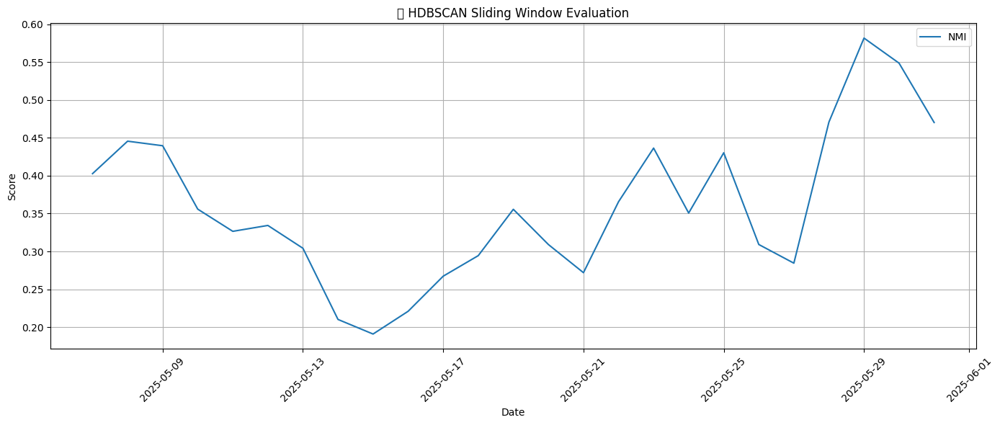

In [ ]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title("📊 HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


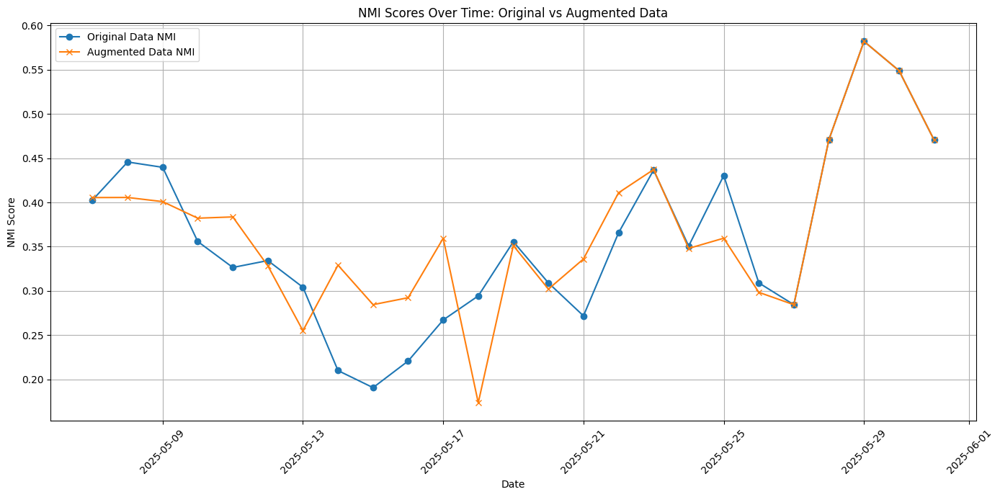

In [ ]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


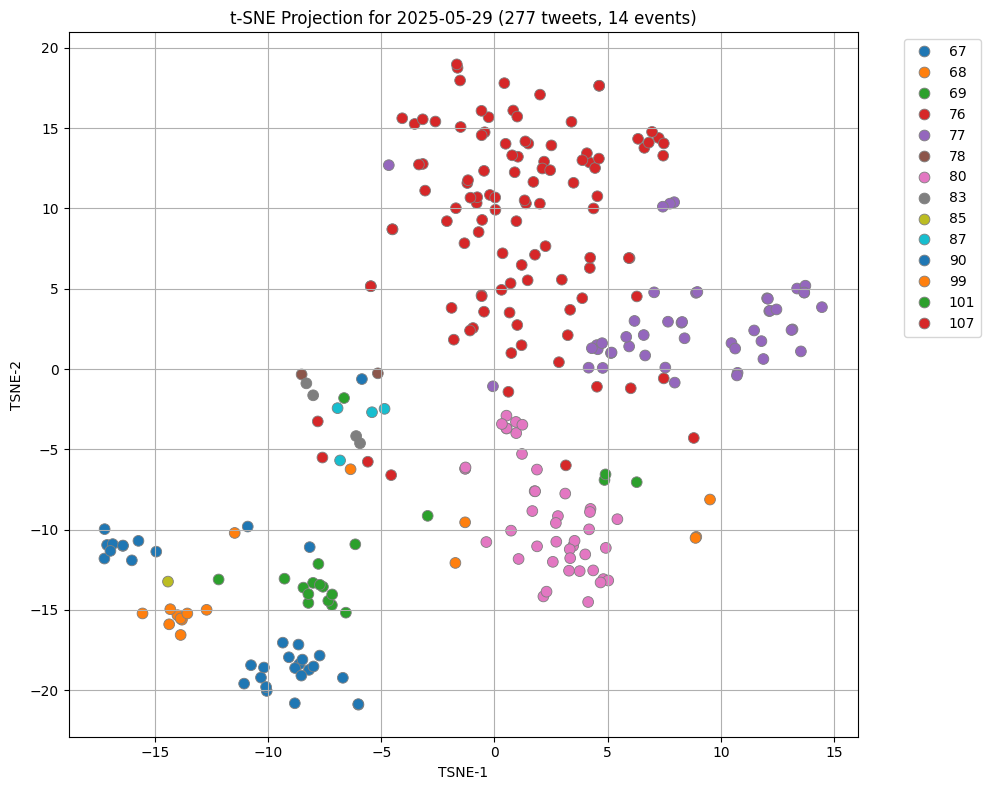

In [ ]:
#@title 🌀 Plot t-SNE of a Message Block with Event Labels
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns

def plot_tsne_message_block(daily_blocks, date_key, title_prefix='t-SNE Projection'):
    """
    Plots t-SNE projection of a daily message block using event labels for coloring.

    Args:
        daily_blocks: dict of daily DataFrames (e.g., `daily_blocks_augmented` or `daily_blocks`)
        date_key: datetime.date (e.g., datetime.date(2025, 5, 9))
        title_prefix: Optional title prefix
    """

    block = daily_blocks.get(date_key)
    if block is None:
        print(f"No block found for {date_key}")
        return

    # Convert embeddings and labels
    embeddings = np.vstack(block['fasttext_embeddings'].apply(np.array).values)
    labels = block['event_label'].values

    # Run t-SNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    tsne_proj = tsne.fit_transform(embeddings)

    # Plot
    plt.figure(figsize=(10, 8))
    palette = sns.color_palette('tab10', n_colors=len(set(labels)))
    sns.scatterplot(x=tsne_proj[:, 0], y=tsne_proj[:, 1], hue=labels, palette=palette, legend='full', s=60, edgecolor='gray')
    plt.title(f"{title_prefix} for {date_key} ({len(labels)} tweets, {len(set(labels))} events)")
    plt.xlabel("TSNE-1")
    plt.ylabel("TSNE-2")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.grid(True)
    plt.show()

#  Example usage:
import datetime
plot_tsne_message_block(daily_blocks, datetime.date(2025, 5, 29))  # Change the date to your desired day


In [ ]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_fasttext_named")


Results saved to drive/MyDrive/results/hdbscan_fasttext_named.csv


In [ ]:
#@title Results
models_results = {
    'hdbscan_arabert': sliding_results_original,
    'hdbscan_arabert_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.4027      0.4456      0.4396      0.3559      0.3265      0.3343   
ami       0.3579      0.3965      0.3897      0.2758      0.2217      0.2768   
ari       0.2246      0.3280      0.3466      0.1326      0.0773      0.0898   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.3042      0.2101      0.1909      0.2209  ...      0.3656   
ami       0.2552      0.1633      0.1434      0.1784  ...      0.3100   
ari       0.1164      0.0368      0.0139      0.0566  ...      0.0978   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.4365      0.3507      0.4303      0.3091      0.2845      0.4709   
ami       0.3745      0.2891      0.3312      0.2580      0.2401      0.4246   
ari       0.1754      0.1289      0.0858      0.1020      0.1005      0.1917   

date  2025-05-29  2025

## HDBSCAN + FastText

### tune

In [ ]:
#@title Install Fast Text Model
# !pip install fasttext
!wget https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
!gunzip cc.ar.300.vec.gz


--2025-07-06 07:38:07--  https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.167.112.53, 3.167.112.129, 3.167.112.51, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.167.112.53|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1272365870 (1.2G) [binary/octet-stream]
Saving to: ‘cc.ar.300.vec.gz’

cc.ar.300.vec.gz    100%[===================>]   1.18G  18.0MB/s    in 47s     

2025-07-06 07:38:54 (26.0 MB/s) - ‘cc.ar.300.vec.gz’ saved [1272365870/1272365870]



In [ ]:
#@title install stanza
# !pip install stanza

In [ ]:
#@title Initialize Stanza Pipeline
# !pip install stanza
import numpy as np
import nltk
import stanza
from gensim.models import KeyedVectors
from nltk.corpus import stopwords

# Download necessary resources (only run once)
nltk.download('stopwords')
stanza.download('ar')

# Load Arabic stopwords from NLTK
ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Initialize Stanza Arabic pipeline for tokenization
nlp = stanza.Pipeline(lang='ar', processors='tokenize,pos,lemma', tokenize_no_ssplit=True)

# Tokenization function
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]

# Tweet embedding function using FastText + Stanza + NLTK stopwords
def embed_tweet(text, model):
    tokens = stanza_tokenize(text)
    # Remove stopwords
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    # Embed
    vectors = [model[token] for token in filtered_tokens if token in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Downloading default packages for language: ar (Arabic) ...
INFO:stanza:File exists: /root/stanza_resources/ar/default.zip
INFO:stanza:Finished downloading models and saved to /root/stanza_resources
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package       |
-----------------------------
| tokenize  | padt          |
| mwt       | padt          |
| pos       | padt_charlm   |
| lemma     | padt_nocharlm |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Loading: pos
INFO:stanza:Loading: lemma
INFO:stanza:Done loading processors!


In [ ]:
#@title Load the model

from gensim.models import KeyedVectors

# Load the .vec file (pre-trained FastText embeddings in text format)
fasttext_model = KeyedVectors.load_word2vec_format('cc.ar.300.vec', binary=False, encoding='utf-8')


In [ ]:
#@title Embeddding the Tweets
from tqdm.notebook import tqdm
import numpy as np

def embed_tweet(text, word_vectors):
    tokens = stanza_tokenize(text)
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    vectors = [word_vectors[token] for token in filtered_tokens if token in word_vectors]
    if not vectors:
        return np.zeros(word_vectors.vector_size)
    return np.mean(vectors, axis=0)

# Use model.wv, not model
word_vectors = model.wv
# fasttext_model=fasttext_model.wv
tweets = df['Tweet Text'].tolist()
embeddings = np.array([
    embed_tweet(text, fasttext_model) for text in tqdm(tweets)
])


  0%|          | 0/6998 [00:00<?, ?it/s]

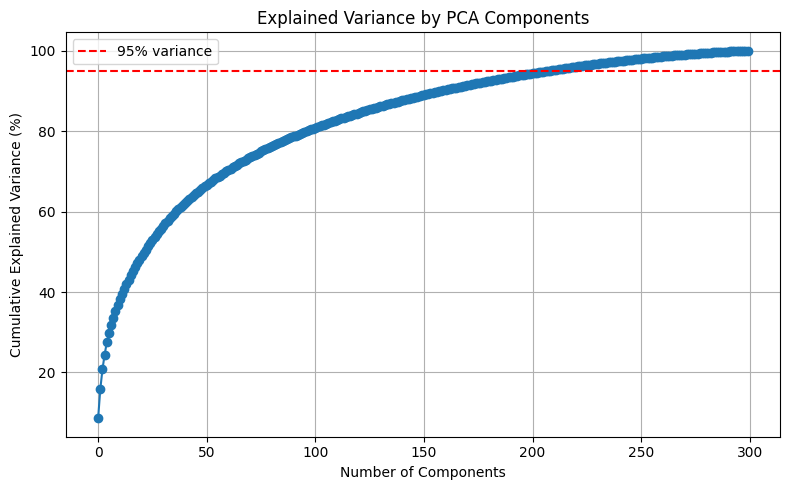


Number of components to retain 95% variance: 209


In [ ]:
#@title best dim
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Apply PCA
pca = PCA()
pca.fit(embeddings)

# Explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-')
plt.axhline(y=95, color='r', linestyle='--', label='95% variance')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Find number of components to explain 95% of variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nNumber of components to retain 95% variance: {n_components_95}")


In [ ]:
#@title reduce dim
from sklearn.decomposition import PCA

# Set the target dimensionality
n_components = 209

# Fit and transform PCA
pca_154 = PCA(n_components=n_components)
reduced_embeddings = pca_154.fit_transform(embeddings)

# Confirm shape
print(f"Original shape: {embeddings.shape}")
print(f"Reduced shape: {reduced_embeddings.shape}")


Original shape: (6998, 300)
Reduced shape: (6998, 209)


In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
df['fasttext_embeddings'] = reduced_embeddings.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


### online

In [ ]:
#@title 📦 Load and Concatenate Word2Vec + Named Entity PCA Embeddings
import ast
import numpy as np

# Helper to safely convert stringified lists
def safe_literal_eval(val):
    if isinstance(val, str):
        return ast.literal_eval(val)
    return val

# Apply to all embedding columns
embedding_cols = ['fasttext_embeddings']

for col in embedding_cols:
    tuning_df[col] = tuning_df[col].apply(safe_literal_eval)
    evaluation_df[col] = evaluation_df[col].apply(safe_literal_eval)



# Convert to NumPy arrays and concatenate
tuning_word2vec = np.vstack(tuning_df['fasttext_embeddings'].apply(np.array).values)

evaluation_word2vec = np.vstack(evaluation_df['fasttext_embeddings'].apply(np.array).values)


# Final combined embeddings
tuning_embeddings = np.hstack([tuning_word2vec]) #  tuning_per, tuning_org, tuning_loc
evaluation_embeddings = np.hstack([evaluation_word2vec])# evaluation_per, evaluation_org, evaluation_loc

# Shape summary
print(f"🧪 Tuning embeddings shape    : {tuning_embeddings.shape}")
print(f"📈 Evaluation embeddings shape: {evaluation_embeddings.shape}")


🧪 Tuning embeddings shape    : (1122, 209)
📈 Evaluation embeddings shape: (9309, 209)


In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Original Daily Blocks
import numpy as np

# Run clustering on original daily blocks
sliding_results_original = run_hdbscan_sliding(
    daily_blocks_original,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=4,
    initial_df=tuning_df,
    embedding_column='fasttext_embeddings'
)


Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:04<00:00,  5.18it/s]


In [ ]:
#@title Run HDBSCAN Sliding Window Clustering on Augmented Daily Blocks
import numpy as np

# Run clustering on augmented daily blocks
sliding_results_augmented = run_hdbscan_sliding(
    daily_blocks_augmented,
    window_size=500,
    time_window_days=3,
    min_cluster_size=4,
    min_samples=4,
    initial_df=tuning_df_aug
)

Running HDBSCAN Sliding Window: 100%|██████████| 25/25 [00:03<00:00,  6.50it/s]


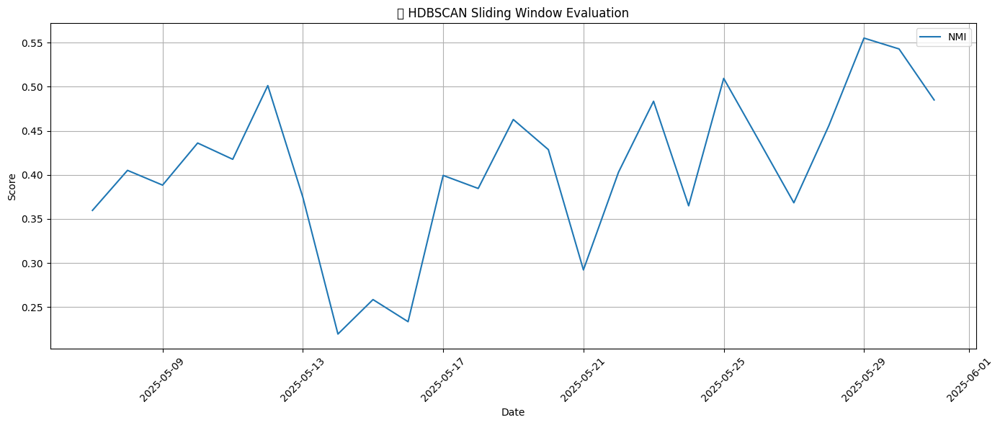

In [ ]:
#@title 📈 Plot HDBSCAN Sliding Metrics

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='NMI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ari'], label='ARI')
# plt.plot(sliding_eval_df['date'], sliding_eval_df['ami'], label='AMI')
plt.xlabel("Date")
plt.ylabel("Score")
plt.title("📊 HDBSCAN Sliding Window Evaluation")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


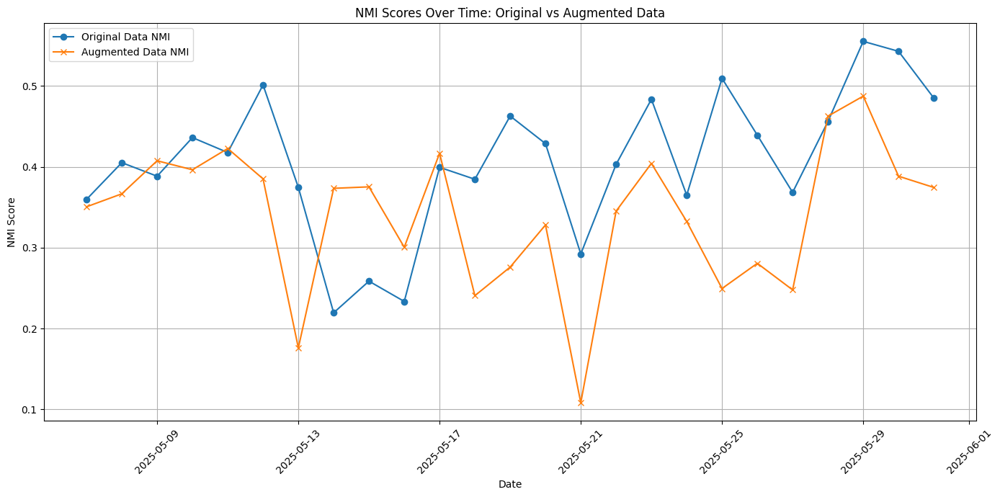

In [ ]:
#@title 📊 Plot NMI Comparison: Original vs Augmented Data

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

plt.plot(sliding_results_original['date'], sliding_results_original['nmi'], label='Original Data NMI', marker='o')
plt.plot(sliding_results_augmented['date'], sliding_results_augmented['nmi'], label='Augmented Data NMI', marker='x')

plt.xlabel('Date')
plt.ylabel('NMI Score')
plt.title('NMI Scores Over Time: Original vs Augmented Data')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


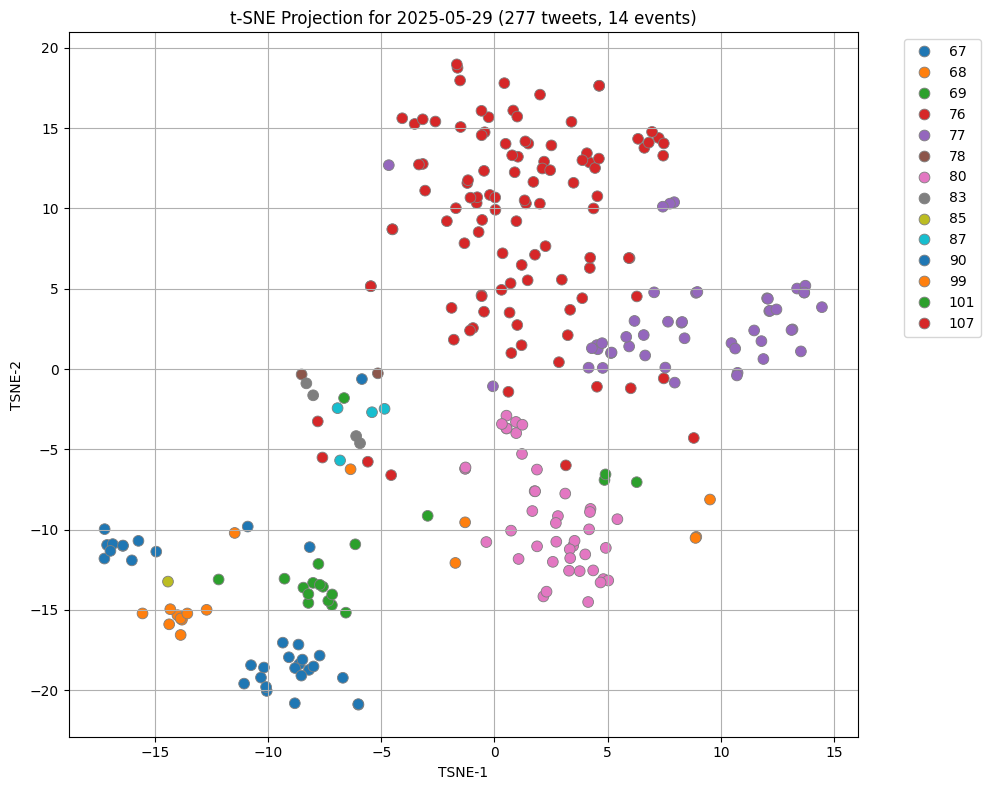

In [ ]:
#@title 🌀 Plot t-SNE of a Message Block with Event Labels
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns

def plot_tsne_message_block(daily_blocks, date_key, title_prefix='t-SNE Projection'):
    """
    Plots t-SNE projection of a daily message block using event labels for coloring.

    Args:
        daily_blocks: dict of daily DataFrames (e.g., `daily_blocks_augmented` or `daily_blocks`)
        date_key: datetime.date (e.g., datetime.date(2025, 5, 9))
        title_prefix: Optional title prefix
    """

    block = daily_blocks.get(date_key)
    if block is None:
        print(f"No block found for {date_key}")
        return

    # Convert embeddings and labels
    embeddings = np.vstack(block['fasttext_embeddings'].apply(np.array).values)
    labels = block['event_label'].values

    # Run t-SNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    tsne_proj = tsne.fit_transform(embeddings)

    # Plot
    plt.figure(figsize=(10, 8))
    palette = sns.color_palette('tab10', n_colors=len(set(labels)))
    sns.scatterplot(x=tsne_proj[:, 0], y=tsne_proj[:, 1], hue=labels, palette=palette, legend='full', s=60, edgecolor='gray')
    plt.title(f"{title_prefix} for {date_key} ({len(labels)} tweets, {len(set(labels))} events)")
    plt.xlabel("TSNE-1")
    plt.ylabel("TSNE-2")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.grid(True)
    plt.show()

#  Example usage:
import datetime
plot_tsne_message_block(daily_blocks, datetime.date(2025, 5, 29))  # Change the date to your desired day


In [ ]:
#@title Save Results
save_results(sliding_results_original, "drive/MyDrive/results/hdbscan_fasttext")


Results saved to drive/MyDrive/results/hdbscan_fasttext.csv


In [ ]:
#@title Results
models_results = {
    'hdbscan_arabert': sliding_results_original,
    'hdbscan_arabert_aug': sliding_results_augmented,

}

print_results_tables(models_results)


=== Metrics Table for hdbscan_arabert ===
date  2025-05-07  2025-05-08  2025-05-09  2025-05-10  2025-05-11  2025-05-12  \
nmi       0.3597      0.4051      0.3883      0.4361      0.4176      0.5012   
ami       0.3134      0.3627      0.3383      0.3956      0.3557      0.4658   
ari       0.0233      0.0945      0.0824      0.2052      0.1163      0.1802   

date  2025-05-13  2025-05-14  2025-05-15  2025-05-16  ...  2025-05-22  \
nmi       0.3745      0.2194      0.2585      0.2334  ...      0.4030   
ami       0.3348      0.1824      0.2155      0.1944  ...      0.3567   
ari       0.1192     -0.0116      0.0625      0.0110  ...      0.0816   

date  2025-05-23  2025-05-24  2025-05-25  2025-05-26  2025-05-27  2025-05-28  \
nmi       0.4835      0.3649      0.5094      0.4391      0.3683      0.4560   
ami       0.4395      0.3148      0.4414      0.3920      0.3295      0.4294   
ari       0.1435      0.1013      0.1187      0.1683      0.1119      0.2127   

date  2025-05-29  2025

# other


In [ ]:
#@title FSD
from datetime import timedelta
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm

class MiniBatchFSD:
    def __init__(self, threshold=0.6, window_size=1000, memory_update_strategy=None):
        self.threshold = threshold
        self.window_size = window_size
        self.memory_update_strategy = memory_update_strategy or self.default_strategy
        self.memory = np.empty((0, 768))
        self.memory_indices = []
        self.memory_dates = []  # track dates of each message in memory
        self.cluster_ids = []
        self.next_cluster_id = 0

    def memory_update_remove_older_than(self, current_date, days=3):
        cutoff_date = current_date - timedelta(days=days)
        # Keep only messages in memory with date >= cutoff_date
        # keep_mask = [date >= cutoff_date for date in self.memory_dates]
        # self.memory = self.memory[keep_mask]
        # self.memory_indices = [idx for idx, keep in zip(self.memory_indices, keep_mask) if keep]
        # self.memory_dates = [date for date, keep in zip(self.memory_dates, keep_mask) if keep]

    def default_strategy(self):
        if len(self.memory) > self.window_size:
            self.memory = self.memory[1:]
            self.memory_indices = self.memory_indices[1:]

    def fit_predict(self, embeddings, dates):
        predictions = []
        for i, (emb, curr_date) in enumerate(zip(embeddings, dates)):
            emb = emb.reshape(1, -1)
            if len(self.memory) == 0:
                predictions.append(self.next_cluster_id)
                self.memory = np.vstack([self.memory, emb])
                self.memory_indices.append(i)
                self.memory_dates.append(curr_date)
                self.cluster_ids.append(self.next_cluster_id)
                self.next_cluster_id += 1
                continue

            sims = cosine_similarity(emb, self.memory)[0]
            max_sim_idx = sims.argmax()
            max_sim_val = sims[max_sim_idx]

            if max_sim_val >= self.threshold:
                assigned_cluster = self.cluster_ids[self.memory_indices[max_sim_idx]]
            else:
                assigned_cluster = self.next_cluster_id
                self.next_cluster_id += 1

            predictions.append(assigned_cluster)
            self.cluster_ids.append(assigned_cluster)

            # Remove messages older than 3 days relative to current message
            self.memory_update_remove_older_than(curr_date, days=3)

            # Add current message
            self.memory = np.vstack([self.memory, emb])
            self.memory_indices.append(len(self.cluster_ids) - 1)
            self.memory_dates.append(curr_date)

        return predictions


## F

In [ ]:
# Convert Date column to datetime
df['Date'] = pd.to_datetime(df['Date'])


daily_blocks = dict(tuple(evaluation_df.groupby(evaluation_df['Date'].dt.date)))


In [ ]:
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
import numpy as np
import pandas as pd

# Define the threshold values to test
threshold_range = np.arange(0.1, 1.4, 0.02)

# Prepare tuning embeddings and labels
tuning_embeddings = np.vstack(tuning_df['arabert_embeddings'].apply(np.array).values)
tuning_labels = tuning_df['event_label'].values
tuning_dates = pd.to_datetime(tuning_df['Date']).to_list()

# Store grid search results
threshold_results = []

for threshold in threshold_range:
    fsd_model = MiniBatchFSD(threshold=threshold, window_size=1000)
    predicted_labels = fsd_model.fit_predict(tuning_embeddings, tuning_dates)

    if len(set(predicted_labels)) > 1:
        nmi = normalized_mutual_info_score(tuning_labels, predicted_labels)
        ari = adjusted_rand_score(tuning_labels, predicted_labels)
        ami = adjusted_mutual_info_score(tuning_labels, predicted_labels)
    else:
        nmi = ari = ami = 0.0

    threshold_results.append({
        'threshold': threshold,
        'nmi': nmi,
        'ari': ari,
        'ami': ami
    })

# Convert to DataFrame
threshold_df = pd.DataFrame(threshold_results)


✅ Best Threshold (Tuning Set): 0.88, NMI = 0.5763


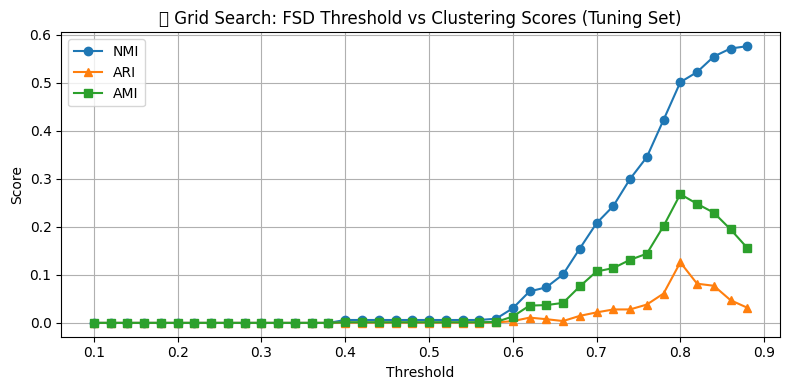

In [ ]:

# Show best threshold by NMI
best_row = threshold_df.loc[threshold_df['nmi'].idxmax()]
print(f"✅ Best Threshold (Tuning Set): {best_row['threshold']:.2f}, NMI = {best_row['nmi']:.4f}")

# Optional: Plot NMI vs. Threshold
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))
plt.plot(threshold_df['threshold'], threshold_df['nmi'], marker='o', label='NMI')
plt.plot(threshold_df['threshold'], threshold_df['ari'], marker='^', label='ARI')
plt.plot(threshold_df['threshold'], threshold_df['ami'], marker='s', label='AMI')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('🔍 Grid Search: FSD Threshold vs Clustering Scores (Tuning Set)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


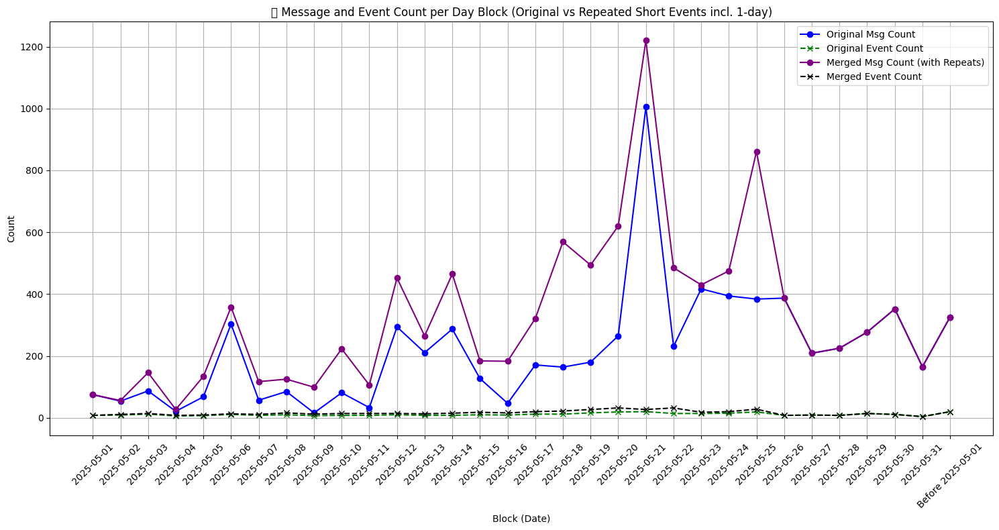

In [ ]:
#@title Augment the data by repeating the events
from datetime import timedelta

# Ensure 'Date' column is datetime.date type
if df['Date'].dtype != 'O':
    df['Date'] = pd.to_datetime(df['Date']).dt.date

start_date = pd.to_datetime("2025-05-01").date()
end_date = pd.to_datetime("2025-05-25").date()

# Assign Block column
df['Block'] = df['Date'].apply(lambda d: "Before 2025-05-01" if d < start_date else str(d))

# Original stats
block_stats = df.groupby('Block').agg(
    Block_Size=('Tweet ID', 'count'),
    Num_Events=('event_filename', pd.Series.nunique)
).reset_index()

# --- Step 1: Detect short events (< 5 days) and 1-day events
event_durations = df.groupby('event_filename')['Creation Time'].agg(['min', 'max'])
event_durations['duration_days'] = (event_durations['max'] - event_durations['min']).dt.total_seconds() / 86400
event_durations['start_date'] = event_durations['min'].dt.date
event_durations['end_date'] = event_durations['max'].dt.date

short_events = event_durations[event_durations['duration_days'] < 5]
one_day_events = event_durations[event_durations['duration_days'] == 1.0]

# Extract only short event rows in range
filtered_df = df[
    (df['event_filename'].isin(short_events.index)) &
    (df['Date'] >= start_date) & (df['Date'] <= end_date)
].copy()

# Precompute daily counts
daily_counts = df[df['Date'] >= start_date].groupby('Date').size().to_dict()
augmented_rows = []

# Augment short events (< 5 days)
for event_name, row in short_events.iterrows():
    original_rows = filtered_df[filtered_df['event_filename'] == event_name]
    if original_rows.empty:
        continue

    candidates = []
    for shift in [-3, 3, 7, 10]:
        target_date = row['end_date'] + timedelta(days=shift) if shift >= 0 else row['start_date'] + timedelta(days=shift)
        if start_date <= target_date <= end_date and daily_counts.get(target_date, 0) < 500:
            candidates.append(target_date)

    used_targets = set()
    for target_date in candidates:
        if target_date in used_targets:
            continue
        used_targets.add(target_date)

        shift_days = (target_date - row['start_date']).days
        repeated_rows = original_rows.copy()
        repeated_rows['Date'] = repeated_rows['Date'] + timedelta(days=shift_days)
        repeated_rows = repeated_rows[(repeated_rows['Date'] >= start_date) & (repeated_rows['Date'] <= end_date)]
        if not repeated_rows.empty:
            augmented_rows.append(repeated_rows)

# Augment 1-day events with more shifts
filtered_one_day = df[
    (df['event_filename'].isin(one_day_events.index)) &
    (df['Date'] >= start_date) & (df['Date'] <= end_date)
].copy()

for event_name, row in one_day_events.iterrows():
    original_rows = filtered_one_day[filtered_one_day['event_filename'] == event_name]
    if original_rows.empty:
        continue

    for shift in [-7, -3, 3, 7]:
        target_date = row['start_date'] + timedelta(days=shift)
        if start_date <= target_date <= end_date and daily_counts.get(target_date, 0) < 500:
            repeated_rows = original_rows.copy()
            repeated_rows['Date'] = repeated_rows['Date'] + timedelta(days=shift)
            repeated_rows = repeated_rows[(repeated_rows['Date'] >= start_date) & (repeated_rows['Date'] <= end_date)]
            if not repeated_rows.empty:
                augmented_rows.append(repeated_rows)

# Merge repeated events
repeated_df = pd.concat(augmented_rows, ignore_index=True) if augmented_rows else pd.DataFrame(columns=df.columns)
repeated_df['is_augmented'] = True

# Merge with original
merged_df = pd.concat([df, repeated_df], ignore_index=True)
merged_df['Block'] = merged_df['Date'].apply(lambda d: "Before 2025-05-01" if d < start_date else str(d))

# Recompute block stats
merged_block_stats = merged_df.groupby('Block').agg(
    Block_Size=('Tweet ID', 'count'),
    Num_Events=('event_filename', pd.Series.nunique)
).reset_index()

# --- 📊 Plot comparison
plt.figure(figsize=(15, 8))

plt.plot(block_stats['Block'], block_stats['Block_Size'], marker='o', color='blue', label='Original Msg Count')
plt.plot(block_stats['Block'], block_stats['Num_Events'], marker='x', color='green', linestyle='--', label='Original Event Count')

plt.plot(merged_block_stats['Block'], merged_block_stats['Block_Size'], marker='o', color='purple', label='Merged Msg Count (with Repeats)')
plt.plot(merged_block_stats['Block'], merged_block_stats['Num_Events'], marker='x', color='black', linestyle='--', label='Merged Event Count')

plt.xticks(rotation=45)
plt.title("📦 Message and Event Count per Day Block (Original vs Repeated Short Events incl. 1-day)")
plt.xlabel("Block (Date)")
plt.ylabel("Count")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
#@title 🎨 t-SNE Plot (Cluster All Until Given Date, Plot Only That Day)
def plot_tsne_hdbscan_clusters_until_date(daily_blocks,
                                          date_key,
                                          embedding_column='arabert_embeddings',
                                          min_cluster_size=5,
                                          min_samples=3,
                                          perplexity=30,
                                          window_size=500,
                                          time_window_days=3):
    """
    Cluster tweets using HDBSCAN up to a given date (windowed),
    and plot only the tweets from that date colored by cluster ID.

    Args:
        daily_blocks: dict of {date: DataFrame}
        date_key: datetime.date of the day to plot
        embedding_column: embedding column to use
        min_cluster_size: HDBSCAN min_cluster_size
        min_samples: HDBSCAN min_samples
        perplexity: t-SNE perplexity
        window_size: max tweets in window
        time_window_days: max number of days back
    """
    # --- Step 1: Filter blocks in the time window ---
    cutoff = date_key - timedelta(days=time_window_days)
    window_blocks = {d: b for d, b in daily_blocks.items() if cutoff <= d <= date_key}
    if not window_blocks:
        print(f"❌ No tweets found in window up to {date_key}")
        return

    full_df = pd.concat([window_blocks[d] for d in sorted(window_blocks)]).copy()
    full_df["__row_id"] = np.arange(len(full_df))

    if len(full_df) > window_size:
        full_df = full_df.tail(window_size)

    full_embeddings = np.vstack(full_df[embedding_column].apply(np.array).values)

    # --- Step 2: HDBSCAN clustering over all tweets in the window ---
    clusterer = HDBSCAN(min_cluster_size=min_cluster_size,
                        min_samples=min_samples,
                        metric='cosine',
                        algorithm='generic')
    cluster_labels = clusterer.fit_predict(full_embeddings)
    full_df['cluster_id'] = cluster_labels

    # --- Step 3: Filter today's tweets from full_df ---
    block_today = daily_blocks.get(date_key)
    if block_today is None or block_today.empty:
        print(f"❌ No tweets found for {date_key}")
        return

    block_today = block_today.copy()
    block_today['__row_id'] = block_today.index
    today_df = pd.merge(block_today, full_df[['__row_id', 'cluster_id']], on='__row_id', how='left')

    today_embeddings = np.vstack(today_df[embedding_column].apply(np.array).values)
    today_cluster_ids = today_df['cluster_id'].values

    # --- Step 4: Run t-SNE on today's tweets only ---
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
    tsne_proj = tsne.fit_transform(today_embeddings)

    print(f"Full DF length: {len(full_df)}")
    print(f"Tweets on {date_key}: {len(daily_blocks[date_key])}")

    # --- Step 5: Plot ---
    plt.figure(figsize=(10, 8))
    unique_clusters = np.unique(today_cluster_ids)
    palette = sns.color_palette('tab20', len(unique_clusters))

    sns.scatterplot(x=tsne_proj[:, 0],
                    y=tsne_proj[:, 1],
                    hue=today_cluster_ids,
                    palette=palette,
                    style=today_cluster_ids == -1,
                    s=60,
                    edgecolor='gray')

    plt.title(f"t-SNE: HDBSCAN Clusters on {date_key} (Window: {time_window_days}d, {window_size} tweets)")
    plt.xlabel("TSNE-1")
    plt.ylabel("TSNE-2")
    plt.legend(title="Cluster ID", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:

from datetime import date

# Use the merged (augmented) dataset
df_aug = merged_df.copy()

# Make sure Date column is datetime type
df_aug['Date'] = pd.to_datetime(df_aug['Date'])

# Define split date
split_date = pd.to_datetime("2025-05-01")

# Split for tuning and evaluation
tuning_df = df_aug[df_aug['Date'] < split_date].copy()
evaluation_df = df_aug[df_aug['Date'] >= split_date].copy()

# Show the sizes
print(f"🧪 Tuning Set Size     : {tuning_df.shape[0]} messages")
print(f"📈 Evaluation Set Size : {evaluation_df.shape[0]} messages")

# Daily blocks from evaluation set (each day = one message block)
daily_blocks = dict(tuple(evaluation_df.groupby(evaluation_df['Date'].dt.date)))

# Show block summary table
block_stats = evaluation_df.groupby(evaluation_df['Date'].dt.date).agg(
    Block_Size=('Tweet ID', 'count'),
    Num_Events=('event_filename', pd.Series.nunique)
).reset_index().rename(columns={'Date': 'Block (Date)'})

print("\n📊 Daily Block Summary:\n")
print(block_stats.to_string(index=False))


🧪 Tuning Set Size     : 326 messages
📈 Evaluation Set Size : 10105 messages

📊 Daily Block Summary:

Block (Date)  Block_Size  Num_Events
  2025-05-01          75           8
  2025-05-02          56          11
  2025-05-03         146          14
  2025-05-04          27           8
  2025-05-05         134           9
  2025-05-06         358          13
  2025-05-07         117          11
  2025-05-08         125          16
  2025-05-09          99          12
  2025-05-10         223          14
  2025-05-11         106          14
  2025-05-12         452          14
  2025-05-13         265          13
  2025-05-14         465          15
  2025-05-15         184          18
  2025-05-16         183          16
  2025-05-17         321          20
  2025-05-18         569          22
  2025-05-19         494          27
  2025-05-20         620          32
  2025-05-21        1220          27
  2025-05-22         485          32
  2025-05-23         430          18
  2025-05-2

In [ ]:
# === Online evaluation adapted for dates ===
fsd_model = MiniBatchFSD(threshold=1.1, window_size=100)

online_results = []

for date, block in tqdm(sorted(daily_blocks.items())):
    embeddings = np.vstack(block['arabert_embeddings'].apply(np.array).values)
    true_labels = block['event_label'].values
    dates = pd.to_datetime(block['Date']).to_list()

    predicted_labels = fsd_model.fit_predict(embeddings, dates)

    if len(set(predicted_labels)) > 1:
        # print(1)
        nmi = normalized_mutual_info_score(true_labels, predicted_labels)
        ari = adjusted_rand_score(true_labels, predicted_labels)
        ami = adjusted_mutual_info_score(true_labels, predicted_labels)
    else:
        nmi = ari = ami = 0.0

    online_results.append({
        'date': date,
        'nmi': nmi,
        'ari': ari,
        'ami': ami,
        'num_tweets': len(block)
    })

online_eval_df = pd.DataFrame(online_results).sort_values(by='date')
# print(online_eval_df.head())


  0%|          | 0/31 [00:00<?, ?it/s]

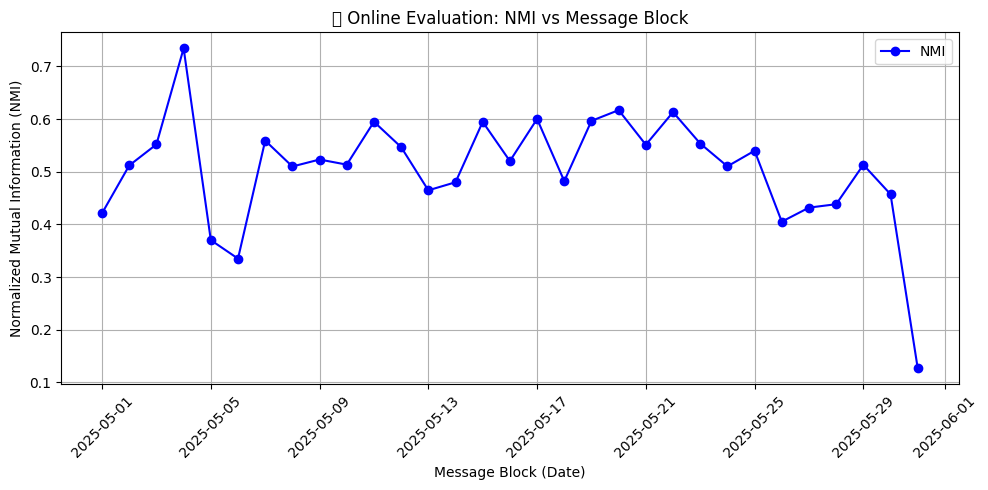

In [ ]:
#@title 📈 Plot NMI vs. Message Block (Date)
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(online_eval_df['date'], online_eval_df['nmi'], marker='o', color='blue', label='NMI')

plt.xticks(rotation=45)
plt.xlabel("Message Block (Date)")
plt.ylabel("Normalized Mutual Information (NMI)")
plt.title("📊 Online Evaluation: NMI vs Message Block")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


Full DF length: 1000
Tweets on 2025-05-22: 485


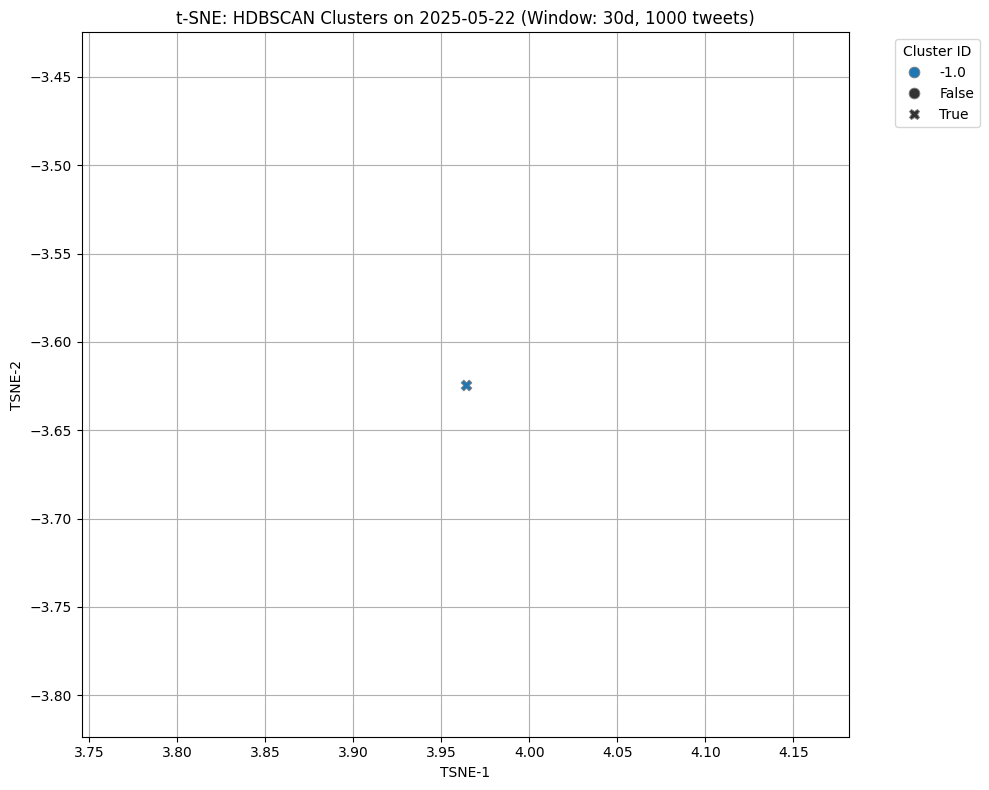

In [ ]:
#@title 🎨 Plot t-SNE of a Message Block with HDBSCAN Cluster IDs
from sklearn.manifold import TSNE
from hdbscan import HDBSCAN
import seaborn as sns

plot_tsne_hdbscan_clusters_until_date(
    daily_blocks=daily_blocks,
    date_key=datetime.date(2025, 5, 22),
    embedding_column='fasttext_embeddings',  # Or any other like 'arabert_embeddings'
    min_cluster_size=2,
    min_samples=1,
    perplexity=30,
    window_size=1000,
    time_window_days=30
)
